





**CLIMATE CHANGE PATTERNS: UNDERSTANDING THE VARIABILITY IN THE EARTH’S SURFACE TEMPERATURE AND SPATIAL CORRELATION WITH ECONOMIC INDICATORS**

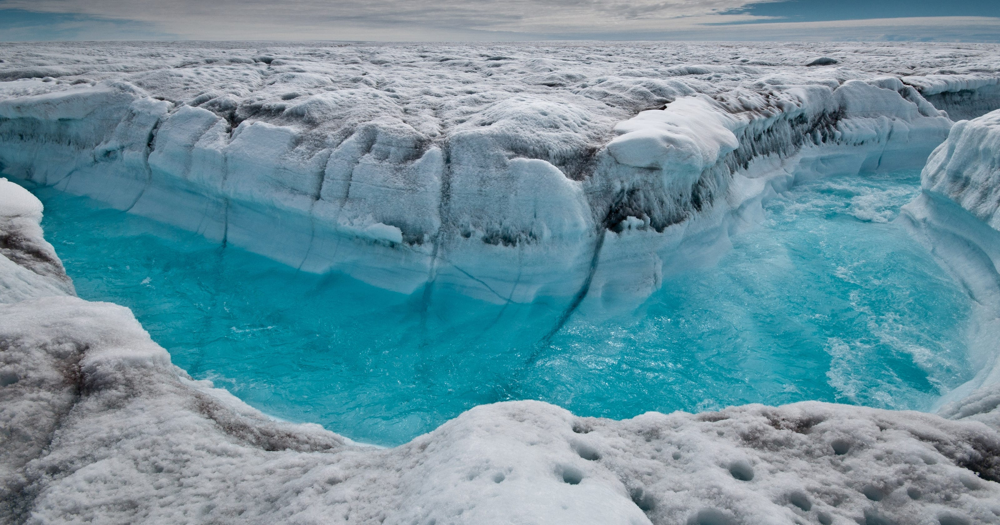



----


### OVERVIEW


Climate change is the long-term alteration in Earth’s climate and weather patterns that took a century of research to convince scholars that human activity can alter this pattern. Climate change has already increased the risks to the world's agricultural output by causing extreme weather and sea level rises (SLRs) that consequently in the long-term influences the countries’ GDP.

New research conducted by researchers from Cambridge University and the University of East Anglia UK, showed that under the current global warming scenarios 63 sovereigns will experience climate-induced downgrades by 2030, and this number will increase to 80 sovereigns by 2100. [Paper](https://www.bennettinstitute.cam.ac.uk/publications/rising-temperatures-falling-ratings/)

Nowadays, scientists in order to obtain a complete picture of the earth surface temperature, use and combine different air, land and ocean temperature measurements through ships, buoys and satellites. These data collected and recoreded by different institutions around world but in general, there are four major and authenticate source of datasets  measuring the global temperature including HadCRUT4 records produced by UK (East Anglia’s Climatic Research Unit); GISTEMP records by NASA; MLOST records by NOAA; and The Japan Meteorological Agency make the JMA records.HadCrut4 stretches back the furthest to 1850. GISTEMP and MLOST both begin in 1880, whereas JMA starts a bit later in 1891. while many industriealized countries are aware of their contribution to the global warming and Greenhouse gas emission but still they are reluctant to take action regarding their impacts. [Measurement](https://oceanservice.noaa.gov/facts/satellites-ocean.html)

In general GDP growth implies simply increased pollution level due to increased economic outputs and Increased output requires increased input which means more natural resources consumption and environmental destruction. Pollution is thought to increase to scale with economic growth [Cederborg & Snöbohm, 2016](https://www.diva-portal.org/smash/get/diva2:1076315/FULLTEXT01.pd).

GDP measures the monetary value of final goods and services that produced within a specific period of time and generated inside the boundary of specific country.
GDP can be evaluated and measured through three ways:
The production approach where country considers the value-added at each stage of the production process (value of output minus the value of intermediate consumption)
The expenditure approach where the country adds up the value of purchases made up by final consumers
The income approach where government considers total incomes generated by production


Consumer Food Price (CFP) is based on the prices of goods and services consumers buy from a fixed basket of goods. CFP includes foreign or imported goods.

All countries do not bear the same burden of climate change. The impacts of climate change are felt differently depending on a country's geographical location, level of economic development, and vulnerability to climate-related hazards.Developing countries, especially those in tropical regions, are often more vulnerable to the impacts of climate change due to factors such as a lack of resources and infrastructure to adapt to changing conditions, higher exposure to extreme weather events such as hurricanes and floods, and dependence on climate-sensitive sectors such as agriculture and fisheries.

In contrast, developed countries tend to have more resources and infrastructure to adapt to climate change and tend to have lower vulnerability to its impacts. However, developed countries are often responsible for a larger share of global greenhouse gas emissions, which are the primary driver of climate change. Therefore, developed countries have a greater responsibility to take action to reduce their emissions and support adaptation efforts in developing countries.

The United Nations Framework Convention on Climate Change (UNFCCC) recognizes the principle of "common but differentiated responsibilities and respective capabilities," which acknowledges that developed countries have a greater responsibility to take action on climate change due to their historical and current contributions to the problem and their greater capacity to address it. However, all countries have a role to play in addressing climate change and transitioning to a low-carbon, sustainable future. [Poverty and Climate change](https://www.oecd.org/env/cc/2502872.pdf)

The timeframe used in this study is from 1990-2013.

Datasets used in this study -

1. Global Average Temperature - https://berkeleyearth.org/data/
2. Gross Domestic Product- https://data.worldbank.org/indicator/NY.GDP.MKTP.CD
3. Greenhouse Gas emission- https://ourworldindata.org/co2-and-greenhouse-gas-emissions
4. Consumer Food Price inflation -https://data.worldbank.org/indicator/FP.CPI.TOTL.ZG



### PROBLEM STATEMENT

1.   Observing the patterns in average temperature across the world.
2.  Analyzing if there is any spatial association between economic indicators and global warming across the world. Are all countries equally bearing the burden of climate change?

### **Loading the data**

In [ ]:
import pandas as pd
import numpy as np
import plotly
import plotly.express as px
import matplotlib.pyplot as plt
from urllib.request import urlopen
import datetime as dt
import seaborn as sns
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn import tree
import graphviz

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


###Loading the datasets

In [ ]:
#loading GDP dataset
fname = "/content/drive/MyDrive/MLPP Project/Final Project MLPP group 5/gdp final.csv"
gdp=pd.read_csv(fname)
#loading Food inflation dataset
rname='/content/drive/MyDrive/MLPP Project/Final Project MLPP group 5/Food consumer price final.csv'
food=pd.read_csv(rname)
#loading Greenhouse gas emission dataset
bname='/content/drive/MyDrive/MLPP Project/Final Project MLPP group 5/emission data final.csv'
ghg=pd.read_csv(bname)
#loading Temperature dataset
xname= "/content/drive/MyDrive/MLPP Project/GlobalTemperatures.csv" #global temperature dataset
temp=pd.read_csv(xname)
yname= "/content/drive/MyDrive/MLPP Project/GlobalLandTemperaturesByCountry.csv" #global temperature by country dataset
ct= pd.read_csv(yname)

### **Data Cleaning and Pre-Processing**

To maintain same countries in all datasets we reduced that dataset to 177 countries. which is common for all.

In [ ]:
#GDP dataset before data cleaning and pre processing
gdp

,Country Name,Code,1960,1961,1962,1963,1964,1965,1966,1967,...,2012,2013,2014,2015,2016,2017,2018,2019,2020,Unnamed: 65
0,Afghanistan,AFG,5.377778e+08,5.488889e+08,5.466667e+08,7.511112e+08,8.000000e+08,1.006667e+09,1.400000e+09,1.673333e+09,...,1.990732e+10,2.014640e+10,2.049713e+10,1.913421e+10,1.811656e+10,1.875347e+10,1.805323e+10,1.879945e+10,2.011614e+10,NaN
1,Albania,ALB,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.231983e+10,1.277622e+10,1.322815e+10,1.138685e+10,1.186120e+10,1.301969e+10,1.515643e+10,1.540024e+10,1.488763e+10,NaN
2,Algeria,DZA,2.723593e+09,2.434727e+09,2.001428e+09,2.702960e+09,2.909293e+09,3.136259e+09,3.039835e+09,3.370843e+09,...,2.090000e+11,2.100000e+11,2.140000e+11,1.660000e+11,1.600000e+11,1.700000e+11,1.750000e+11,1.720000e+11,1.450000e+11,NaN
3,Angola,AGO,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.280000e+11,1.370000e+11,1.460000e+11,1.160000e+11,1.010000e+11,1.220000e+11,1.010000e+11,8.941719e+10,5.837598e+10,NaN
4,Antigua and Barbuda,ATG,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.199948e+09,1.181448e+09,1.249733e+09,1.336693e+09,1.436585e+09,1.467978e+09,1.605944e+09,1.687533e+09,1.370281e+09,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,"Venezuela, RB",VEN,7.779091e+09,8.189091e+09,8.946970e+09,9.753333e+09,8.099318e+09,8.427778e+09,8.781333e+09,9.250000e+09,...,3.810000e+11,3.710000e+11,4.820000e+11,NaN,NaN,NaN,NaN,NaN,NaN,NaN
173,Vietnam,VNM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,1.560000e+11,1.710000e+11,1.860000e+11,1.930000e+11,2.050000e+11,2.240000e+11,2.450000e+11,2.620000e+11,2.710000e+11,NaN
174,"Yemen, Rep.",YEM,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,3.540134e+10,4.041524e+10,4.322859e+10,4.244510e+10,3.131737e+10,2.684013e+10,2.160614e+10,NaN,NaN,NaN
175,Zambia,ZMB,7.130000e+08,6.962857e+08,6.931429e+08,7.187143e+08,8.394286e+08,1.082857e+09,1.264286e+09,1.368000e+09,...,2.550306e+10,2.803724e+10,2.714102e+10,2.125122e+10,2.095841e+10,2.587360e+10,2.631159e+10,2.330867e+10,1.811063e+10,NaN


Dropped the unwanted columns in the GDP data set as we have GDP data from 1960 to 2020 and we need to narrow it down to 1990 to 2013 in order to match with other datasets time frame.



In [ ]:
#selecting specific timeframe for analysis of GDPdata
gdp=gdp.loc[:, ['Country Name','1990','1991','1992','1993', '1994', '1995', '1996', '1997', '1998',
         '1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010',
         '2011','2012','2013']]

In [ ]:
gdp

,Country Name,1990,1991,1992,1993,1994,1995,1996,1997,1998,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
0,Afghanistan,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,5.226779e+09,6.209138e+09,6.971286e+09,9.747880e+09,1.010931e+10,1.241616e+10,1.585668e+10,1.780511e+10,1.990732e+10,2.014640e+10
1,Albania,2.028554e+09,1.099559e+09,6.521750e+08,1.185315e+09,1.880952e+09,2.392765e+09,3.199641e+09,2.258514e+09,2.545965e+09,...,7.184686e+09,8.052074e+09,8.896073e+09,1.067732e+10,1.288135e+10,1.204421e+10,1.192692e+10,1.289076e+10,1.231983e+10,1.277622e+10
2,Algeria,6.204856e+10,4.571561e+10,4.800308e+10,4.994560e+10,4.254318e+10,4.176432e+10,4.694158e+10,4.817761e+10,4.818775e+10,...,8.533258e+10,1.030000e+11,1.170000e+11,1.350000e+11,1.710000e+11,1.370000e+11,1.610000e+11,2.000000e+11,2.090000e+11,2.100000e+11
3,Angola,1.123628e+10,NaN,NaN,NaN,3.390500e+09,5.561222e+09,7.526964e+09,7.649716e+09,6.506619e+09,...,2.355205e+10,3.697092e+10,5.238101e+10,6.526645e+10,8.853861e+10,7.030716e+10,8.379950e+10,1.120000e+11,1.280000e+11,1.370000e+11
4,Antigua and Barbuda,4.594704e+08,4.817074e+08,4.992815e+08,5.351741e+08,5.894296e+08,5.772815e+08,6.337296e+08,6.806185e+08,7.278593e+08,...,9.197296e+08,1.022963e+09,1.157663e+09,1.312759e+09,1.370070e+09,1.228330e+09,1.148700e+09,1.137637e+09,1.199948e+09,1.181448e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
172,"Venezuela, RB",4.859832e+10,5.347697e+10,6.040180e+10,6.006501e+10,5.841867e+10,7.740773e+10,7.054321e+10,8.584353e+10,9.133120e+10,...,1.120000e+11,1.460000e+11,1.830000e+11,2.300000e+11,3.160000e+11,3.300000e+11,3.930000e+11,3.160000e+11,3.810000e+11,3.710000e+11
173,Vietnam,6.471741e+09,9.613370e+09,9.866990e+09,1.318095e+10,1.628643e+10,2.073616e+10,2.465747e+10,2.684370e+10,2.720960e+10,...,4.542785e+10,5.763326e+10,6.637166e+10,7.741443e+10,9.913030e+10,1.060000e+11,1.160000e+11,1.360000e+11,1.560000e+11,1.710000e+11
174,"Yemen, Rep.",5.647119e+09,5.930370e+09,6.463650e+09,5.368271e+09,4.167356e+09,4.258789e+09,5.785685e+09,6.838557e+09,6.325142e+09,...,1.387279e+10,1.674634e+10,1.906198e+10,2.165053e+10,2.691085e+10,2.513027e+10,3.090675e+10,3.272642e+10,3.540134e+10,4.041524e+10
175,Zambia,3.285217e+09,3.378882e+09,3.181922e+09,3.273238e+09,3.656648e+09,3.807067e+09,3.597221e+09,4.303282e+09,3.537683e+09,...,6.221078e+09,8.331870e+09,1.275686e+10,1.405696e+10,1.791086e+10,1.532834e+10,2.026556e+10,2.345952e+10,2.550306e+10,2.803724e+10


In [ ]:
gdp_filtered=gdp

In [ ]:
#set the country name as a index
gdp_filtered.set_index('Country Name',inplace=True)

In [ ]:
##creating a array to store the list of values of years from 1990 to 2013
years=np.arange(1990,2014)

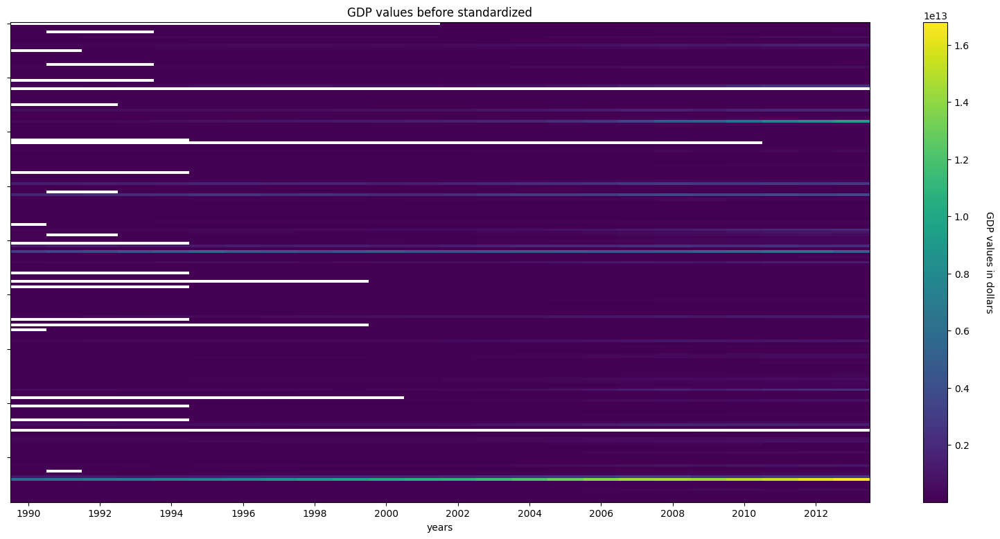

In [ ]:
# initialize the figure
fig, ax = plt.subplots(figsize=(20, 9))

# plot all time series with a "heatmap"
im=ax.imshow(gdp_filtered,aspect='auto',interpolation='nearest',cmap='viridis')

# set the x-axis ticks to be years
xt = np.array([0,2,4,6,8,10,12,14,16,18,20,22])
ax.set_xticks(xt)
ax.set_xticklabels(years[xt])
ax.set_yticklabels("")

ax.set_xlabel("years")
ax.set_title("GDP values before standardized")
# set the colorbar and label
colorbar = fig.colorbar(im)
colorbar.ax.set_ylabel("GDP values in dollars", rotation=270)
colorbar.ax.get_yaxis().labelpad = 25

# show the figure
fig.show()

From the above heatmap, we can see that there are few missing values in the dataset and it could be various reasons:  for afghanisation due to the [soviet-afghan war](https://www.theatlantic.com/photo/2014/08/the-soviet-war-in-afghanistan-1979-1989/100786/), followed by [civil war](https://en.wikipedia.org/wiki/Afghan_Civil_War_(1992%E2%80%931996)) at that time period  and for [kosovo](https://en.wikipedia.org/wiki/2008_Kosovo_declaration_of_independence) it was declared as a independent state in the year 2008, so the data was available after that year only..etc

As we found the missing values in the dataset either we have to drop the values or we can replace it with mean,median and mode imputations. We used the methods FFill and BFill to fill the null values. It is a individual choice to either remove or replace the values using imputations. BFILL and FFill seemed like  better ways for this data rather than using mean,median or mode.

In [ ]:
#fill the Nan values using BFILL method
gdp_filtered.fillna(method='bfill', inplace=True,axis=1)

In [ ]:
#fill the Nan values using FFILL method
gdp_filtered.fillna(method='ffill', inplace=True,axis=1)

In [ ]:
gdp_filtered

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Country Name,,,,,,,,,,,,,,,,,,,,,
Afghanistan,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,...,5.226779e+09,6.209138e+09,6.971286e+09,9.747880e+09,1.010931e+10,1.241616e+10,1.585668e+10,1.780511e+10,1.990732e+10,2.014640e+10
Albania,2.028554e+09,1.099559e+09,6.521750e+08,1.185315e+09,1.880952e+09,2.392765e+09,3.199641e+09,2.258514e+09,2.545965e+09,3.212122e+09,...,7.184686e+09,8.052074e+09,8.896073e+09,1.067732e+10,1.288135e+10,1.204421e+10,1.192692e+10,1.289076e+10,1.231983e+10,1.277622e+10
Algeria,6.204856e+10,4.571561e+10,4.800308e+10,4.994560e+10,4.254318e+10,4.176432e+10,4.694158e+10,4.817761e+10,4.818775e+10,4.864065e+10,...,8.533258e+10,1.030000e+11,1.170000e+11,1.350000e+11,1.710000e+11,1.370000e+11,1.610000e+11,2.000000e+11,2.090000e+11,2.100000e+11
Angola,1.123628e+10,3.390500e+09,3.390500e+09,3.390500e+09,3.390500e+09,5.561222e+09,7.526964e+09,7.649716e+09,6.506619e+09,6.152937e+09,...,2.355205e+10,3.697092e+10,5.238101e+10,6.526645e+10,8.853861e+10,7.030716e+10,8.379950e+10,1.120000e+11,1.280000e+11,1.370000e+11
Antigua and Barbuda,4.594704e+08,4.817074e+08,4.992815e+08,5.351741e+08,5.894296e+08,5.772815e+08,6.337296e+08,6.806185e+08,7.278593e+08,7.662000e+08,...,9.197296e+08,1.022963e+09,1.157663e+09,1.312759e+09,1.370070e+09,1.228330e+09,1.148700e+09,1.137637e+09,1.199948e+09,1.181448e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Venezuela, RB",4.859832e+10,5.347697e+10,6.040180e+10,6.006501e+10,5.841867e+10,7.740773e+10,7.054321e+10,8.584353e+10,9.133120e+10,9.797689e+10,...,1.120000e+11,1.460000e+11,1.830000e+11,2.300000e+11,3.160000e+11,3.300000e+11,3.930000e+11,3.160000e+11,3.810000e+11,3.710000e+11
Vietnam,6.471741e+09,9.613370e+09,9.866990e+09,1.318095e+10,1.628643e+10,2.073616e+10,2.465747e+10,2.684370e+10,2.720960e+10,2.868366e+10,...,4.542785e+10,5.763326e+10,6.637166e+10,7.741443e+10,9.913030e+10,1.060000e+11,1.160000e+11,1.360000e+11,1.560000e+11,1.710000e+11
"Yemen, Rep.",5.647119e+09,5.930370e+09,6.463650e+09,5.368271e+09,4.167356e+09,4.258789e+09,5.785685e+09,6.838557e+09,6.325142e+09,7.641103e+09,...,1.387279e+10,1.674634e+10,1.906198e+10,2.165053e+10,2.691085e+10,2.513027e+10,3.090675e+10,3.272642e+10,3.540134e+10,4.041524e+10


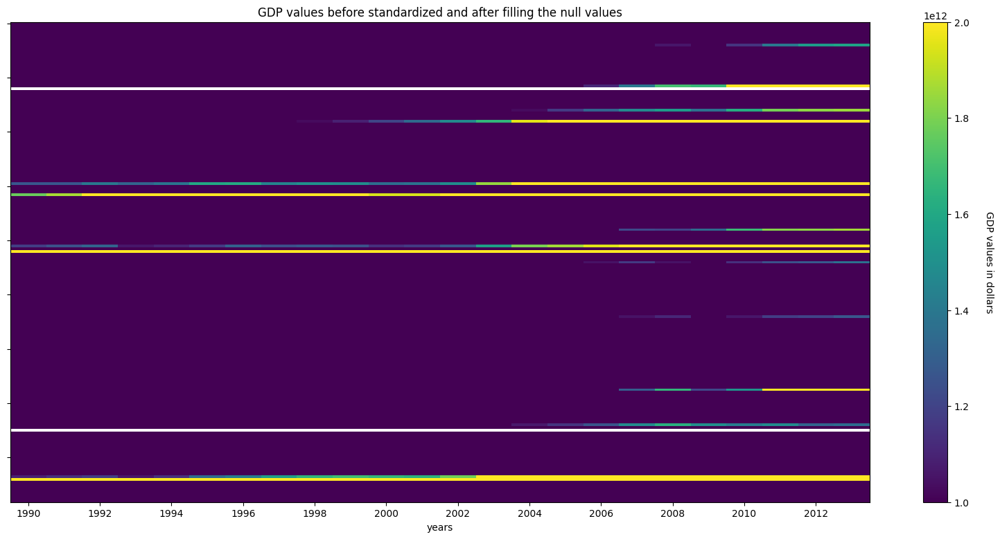

In [ ]:
# initialize the figure
fig, ax = plt.subplots(figsize=(20, 9))

# plot all time series with a "heatmap"
im=ax.imshow(gdp_filtered,aspect='auto',interpolation='nearest',cmap='viridis')
im.set_clim(1e12,2e12)

# set the x-axis ticks to be years
xt = np.array([0,2,4,6,8,10,12,14,16,18,20,22])
ax.set_xticks(xt)
ax.set_xticklabels(years[xt])
ax.set_yticklabels("")

ax.set_xlabel("years")
ax.set_title("GDP values before standardized and after filling the null values")
# set the colorbar and label
colorbar = fig.colorbar(im)
colorbar.ax.set_ylabel("GDP values in dollars", rotation=270)
colorbar.ax.get_yaxis().labelpad = 25

# show the figure
fig.show()

Still we can observe that there is one country with all null values as it doesn't have any forward or backward values to fill those and we can drop this country as we don't have any data.

In [ ]:
gdp_filtered=gdp_filtered.dropna()

From the heat map, we didn't observe any trends properly as the difference between the GDP values are very high for each countries and standardizing the data helps us to find the trends and patterns easily.

In [ ]:
#standardize the data across the columns
gdp_filteredst=gdp_filtered.sub(gdp_filtered.mean(axis=1),axis=0).div(gdp_filtered.std(axis=1),axis=0)

In [ ]:
#data after standardized.
gdp_filteredst

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Country Name,,,,,,,,,,,,,,,,,,,,,
Afghanistan,-0.638506,-0.638506,-0.638506,-0.638506,-0.638506,-0.638506,-0.638506,-0.638506,-0.638506,-0.638506,...,-0.425543,-0.246979,-0.108442,0.396262,0.461959,0.881279,1.506665,1.860834,2.242954,2.286413
Albania,-0.916006,-1.122757,-1.222323,-1.103671,-0.948856,-0.834950,-0.655378,-0.864828,-0.800855,-0.652600,...,0.231505,0.424545,0.612379,1.008802,1.499314,1.313005,1.286903,1.501409,1.374346,1.475917
Algeria,-0.537152,-0.815929,-0.776886,-0.743730,-0.870077,-0.883371,-0.795004,-0.773907,-0.773734,-0.766003,...,-0.139732,0.161823,0.400780,0.708011,1.322472,0.742147,1.151788,1.817455,1.971071,1.988139
Angola,-0.612560,-0.793490,-0.793490,-0.793490,-0.793490,-0.743432,-0.698100,-0.695269,-0.721630,-0.729786,...,-0.328547,-0.019096,0.336275,0.633425,1.170101,0.749668,1.060813,1.711142,2.080116,2.287665
Antigua and Barbuda,-1.433686,-1.356402,-1.295323,-1.170579,-0.982015,-1.024236,-0.828051,-0.665089,-0.500905,-0.367652,...,0.165937,0.524723,0.992870,1.531905,1.731089,1.238471,0.961720,0.923271,1.139832,1.075535
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Venezuela, RB",-0.951228,-0.910464,-0.852602,-0.855416,-0.869173,-0.710507,-0.767864,-0.640020,-0.594167,-0.538638,...,-0.421465,-0.137373,0.171786,0.564502,1.283089,1.400068,1.926474,1.283089,1.826206,1.742650
Vietnam,-1.021186,-0.956898,-0.951708,-0.883893,-0.820345,-0.729289,-0.649046,-0.604309,-0.596821,-0.566657,...,-0.224016,0.025746,0.204563,0.430534,0.874912,1.015488,1.220121,1.629386,2.038652,2.345601
"Yemen, Rep.",-0.849130,-0.823780,-0.776052,-0.874087,-0.981567,-0.973384,-0.836729,-0.742499,-0.788449,-0.670672,...,-0.112947,0.144231,0.351476,0.583147,1.053936,0.894577,1.411562,1.574419,1.813820,2.262554


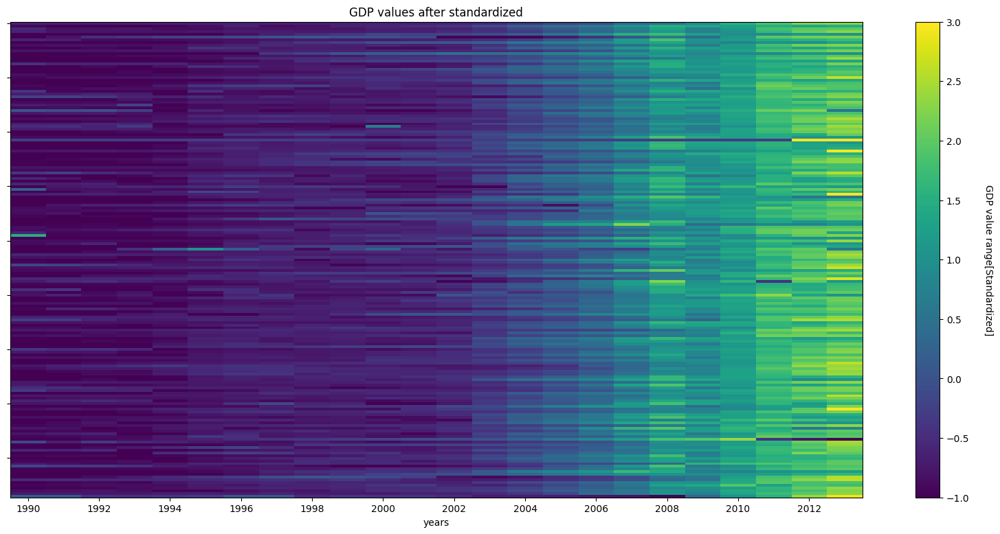

In [ ]:
# initialize the figure
fig, ax = plt.subplots(figsize=(20, 9))

# plot all time series with a "heatmap"
im=ax.imshow(gdp_filteredst,aspect='auto',interpolation='nearest',cmap='viridis')
im.set_clim(-1,3)

# set the x-axis ticks to be years
xt = np.array([0,2,4,6,8,10,12,14,16,18,20,22])
ax.set_xticks(xt)
ax.set_xticklabels(years[xt])
ax.set_yticklabels("")

ax.set_xlabel("years")
ax.set_title("GDP values after standardized")
# set the colorbar and label
colorbar = fig.colorbar(im)
colorbar.ax.set_ylabel("GDP value range[Standardized]", rotation=270)
colorbar.ax.get_yaxis().labelpad = 25

# show the figure
fig.show()

For the above Heat map We can clearly see a trend as all countries and GDP values have been increasing rapidly after 2004, it may be due to advancements in technology, population growth, and an increase in productivity due to demand and It can also be due to changes in government policies helps for growth in GDP.

In [ ]:
#calculate the Average GDP by yearwise from 1990 to 2013.
avg_gdp_yearwise=gdp_filtered.mean()

In [ ]:
avg_gdp_yearwise


1990    1.290079e+11
1991    1.339958e+11
1992    1.433478e+11
1993    1.456630e+11
1994    1.572450e+11
1995    1.750389e+11
1996    1.788685e+11
1997    1.781121e+11
1998    1.777489e+11
1999    1.844011e+11
2000    1.906076e+11
2001    1.894074e+11
2002    1.962711e+11
2003    2.208886e+11
2004    2.487088e+11
2005    2.693034e+11
2006    2.920499e+11
2007    3.295773e+11
2008    3.616092e+11
2009    3.427141e+11
2010    3.755315e+11
2011    4.156633e+11
2012    4.253754e+11
2013    4.372031e+11
dtype: float64

In [ ]:
avg_gdp_yearwisedata=pd.DataFrame(avg_gdp_yearwise,columns=['averageGDP'])

In [ ]:
avg_gdp_yearwisedata=avg_gdp_yearwisedata.reset_index()
avg_gdp_yearwisedata.rename(columns = {'index':'Year'}, inplace = True)

In [ ]:
avg_gdp_yearwisedata['Year']=avg_gdp_yearwisedata['Year'].astype(int)

In [ ]:
#calculate the average GDP country wise from 1990 to 2013.
avg_GDP_countrywise=gdp_filtered.mean(axis=1)

In [ ]:
avg_GDP_countrywise

Country Name
Afghanistan            7.567873e+09
Albania                6.144460e+09
Algeria                9.351916e+10
Angola                 3.779898e+10
Antigua and Barbuda    8.719846e+08
                           ...     
Venezuela, RB          1.624407e+11
Vietnam                5.637508e+10
Yemen, Rep.            1.513480e+10
Zambia                 9.336986e+09
Zimbabwe               8.306245e+09
Length: 175, dtype: float64

In [ ]:
#store the average GDP values in a dataframe.
gdp_average=pd.DataFrame(avg_GDP_countrywise,columns=['GDP average country wise'])

In [ ]:
gdp_average

,GDP average country wise
Country Name,
Afghanistan,7.567873e+09
Albania,6.144460e+09
Algeria,9.351916e+10
Angola,3.779898e+10
Antigua and Barbuda,8.719846e+08
...,...
"Venezuela, RB",1.624407e+11
Vietnam,5.637508e+10
"Yemen, Rep.",1.513480e+10


In [ ]:
#calculate the GDP value difference for year 1990 and 2013.
diff=gdp_filtered['2013']-gdp_filtered['1990']
difference=pd.DataFrame(diff,columns=['GDP difference'])

In [ ]:
difference

,GDP difference
Country Name,
Afghanistan,1.609123e+10
Albania,1.074767e+10
Algeria,1.479514e+11
Angola,1.257637e+11
Antigua and Barbuda,7.219778e+08
...,...
"Venezuela, RB",3.224017e+11
Vietnam,1.645283e+11
"Yemen, Rep.",3.476812e+10


In [ ]:
#selecting specific timeframe for analysis

ghg=ghg.loc[:, ['Country','1990','1991','1992','1993', '1994', '1995', '1996', '1997', '1998',
         '1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010',
         '2011','2012','2013']]
food=food.loc[:, ['Country','1990','1991','1992','1993', '1994', '1995', '1996', '1997', '1998',
         '1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010',
         '2011','2012','2013']]

In [ ]:
#filling and dropping few NAs in the dataset with backward filling method
food = food.set_index('Country')
ghg = ghg.set_index("Country")

In [ ]:
food.fillna(method='bfill', inplace=True,axis=1)
ghg.fillna(method='bfill', inplace=True,axis=1)

In [ ]:
ghg

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,5.920548e+07,6.163197e+07,6.301349e+07,6.434733e+07,6.562982e+07,6.686096e+07,6.802609e+07,6.911057e+07,7.014003e+07,7.094960e+07,...,7.572247e+07,7.704272e+07,7.868596e+07,8.095431e+07,8.515264e+07,9.191295e+07,1.003652e+08,1.125912e+08,1.233332e+08,1.333337e+08
Albania,1.724828e+08,1.767660e+08,1.792795e+08,1.816135e+08,1.835371e+08,1.856219e+08,1.876371e+08,1.891796e+08,1.909310e+08,1.939135e+08,...,2.123544e+08,2.166047e+08,2.204995e+08,2.244237e+08,2.287948e+08,2.331696e+08,2.377643e+08,2.430001e+08,2.479062e+08,2.529662e+08
Algeria,1.227345e+09,1.306150e+09,1.386032e+09,1.467974e+09,1.554121e+09,1.649103e+09,1.745889e+09,1.832893e+09,1.939514e+09,2.031182e+09,...,2.470713e+09,2.577187e+09,2.677388e+09,2.785788e+09,2.894820e+09,3.015005e+09,3.132819e+09,3.252626e+09,3.380736e+09,3.513171e+09
Angola,1.156639e+08,1.207268e+08,1.258918e+08,1.316402e+08,1.355058e+08,1.464541e+08,1.568790e+08,1.642268e+08,1.714964e+08,1.806262e+08,...,2.401006e+08,2.591070e+08,2.812094e+08,3.061856e+08,3.316716e+08,3.592371e+08,3.881015e+08,4.182437e+08,4.514295e+08,4.838026e+08
Antigua and Barbuda,1.064392e+07,1.091139e+07,1.117520e+07,1.144634e+07,1.171381e+07,1.198861e+07,1.228173e+07,1.258950e+07,1.290827e+07,1.323803e+07,...,1.512499e+07,1.555368e+07,1.599702e+07,1.646602e+07,1.694600e+07,1.745530e+07,1.797925e+07,1.849221e+07,1.901616e+07,1.954011e+07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Venezuela, RB",3.228126e+09,3.343178e+09,3.448756e+09,3.572724e+09,3.702255e+09,3.835130e+09,3.957469e+09,4.090953e+09,4.257755e+09,4.430317e+09,...,5.289634e+09,5.454172e+09,5.622715e+09,5.782704e+09,5.960917e+09,6.139762e+09,6.327941e+09,6.503797e+09,6.701527e+09,6.884396e+09
Vietnam,5.523388e+08,5.734992e+08,5.945921e+08,6.171928e+08,6.429659e+08,6.714894e+08,7.055124e+08,7.498216e+08,7.963763e+08,8.430344e+08,...,1.187634e+09,1.282493e+09,1.381627e+09,1.482204e+09,1.595445e+09,1.718282e+09,1.854395e+09,1.999443e+09,2.134818e+09,2.275257e+09
"Yemen, Rep.",1.666563e+08,1.757849e+08,1.856591e+08,1.942851e+08,2.032678e+08,2.136199e+08,2.241468e+08,2.373681e+08,2.494316e+08,2.631563e+08,...,3.449294e+08,3.647243e+08,3.858093e+08,4.065283e+08,4.285533e+08,4.528009e+08,4.759527e+08,4.954658e+08,5.137040e+08,5.386844e+08


Data pre-processing of temperature dataset

In [ ]:
temp.head(5)

,dt,LandAverageTemperature,LandAverageTemperatureUncertainty,LandMaxTemperature,LandMaxTemperatureUncertainty,LandMinTemperature,LandMinTemperatureUncertainty,LandAndOceanAverageTemperature,LandAndOceanAverageTemperatureUncertainty
0,1750-01-01,3.034,3.574,NaN,NaN,NaN,NaN,NaN,NaN
1,1750-02-01,3.083,3.702,NaN,NaN,NaN,NaN,NaN,NaN
2,1750-03-01,5.626,3.076,NaN,NaN,NaN,NaN,NaN,NaN
3,1750-04-01,8.490,2.451,NaN,NaN,NaN,NaN,NaN,NaN
4,1750-05-01,11.573,2.072,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
temp['dt'] = pd.to_datetime(temp['dt']) #converting it into datetime format
temp['year'] = temp['dt'].dt.year #extracting the year

In [ ]:
tempf=temp[(temp["year"]>= 1990) & (temp["year"]<=2013)] #extracting data for our timeframe (1990-2013)

In [ ]:
tempf=tempf.groupby(["year"])['LandAverageTemperature'].mean().reset_index() #grouping by year and taking average of temperature

In [ ]:
tempf.isnull().sum() #no null values

year                      0
LandAverageTemperature    0
dtype: int64

In [ ]:
ct['dt'] = pd.to_datetime(ct['dt']) #converting it into datetime format- This is temperature by countries dataset
ct['year'] = ct['dt'].dt.year #extracting year
ctf=ct[(ct["year"]>= 1990) & (ct["year"]<=2013)] #filtered dataset

In [ ]:
ctf.groupby(["Country","year"])['AverageTemperature'].mean().unstack() #unstacking the data

year,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,14.993333,14.370750,14.056083,14.439250,14.754750,14.859167,14.426000,14.904000,15.132500,15.388750,...,15.770917,14.980000,15.595583,15.106167,15.216500,15.257750,15.828667,15.518000,14.481583,16.533625
Africa,24.703750,24.422250,24.335417,24.538667,24.438750,24.718417,24.634500,24.706833,25.020500,24.743750,...,24.895917,25.156167,24.818917,24.851500,24.754667,25.026500,25.472500,24.786500,24.725917,25.208750
Albania,13.468667,12.338833,13.084667,13.122583,14.099667,12.782083,12.736500,12.900917,13.311250,13.653750,...,13.258167,12.747083,12.976917,13.890500,13.955167,13.844250,13.775417,13.443250,13.768250,14.993875
Algeria,24.014417,23.011083,22.767000,23.450833,23.642083,23.722500,23.734333,23.955167,23.920583,24.299417,...,23.916000,24.222583,24.200833,24.065333,23.950250,24.154333,25.215667,24.144167,23.954833,25.121500
American Samoa,27.156250,27.171167,27.072000,26.816417,26.986333,27.268667,27.112667,26.955750,27.424833,27.067167,...,27.281167,27.373500,27.081250,27.452417,26.995083,27.034250,27.453417,27.009500,27.201417,27.517250
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Western Sahara,23.401917,22.640333,22.734500,22.301917,22.944500,23.371083,23.262250,23.643333,23.690167,22.836250,...,23.420667,23.507667,23.441833,23.145417,23.323083,23.381083,24.114250,23.401250,23.303417,23.744250
Yemen,26.640667,26.594417,26.266500,26.402000,26.994250,26.577667,26.546167,26.940000,27.368667,27.353583,...,27.334083,27.294667,27.175000,27.310750,26.807500,27.342417,27.302750,27.288250,27.445000,28.129750
Zambia,22.219333,21.628917,22.414667,21.711583,21.846583,22.451417,22.018083,21.949750,22.300667,21.451750,...,21.768083,22.813500,21.784250,21.838500,21.535833,21.670250,22.267500,21.771583,21.697750,21.196000


In [ ]:
ct90= ct[(ct["year"]== 1990)]
country_temp_90 = ct90.groupby(by = ['Country'])['AverageTemperature'].mean().reset_index()

In [ ]:
country_temp_90.head() # filtering for the year 1990

,Country,AverageTemperature
0,Afghanistan,14.993333
1,Africa,24.703750
2,Albania,13.468667
3,Algeria,24.014417
4,American Samoa,27.156250


In [ ]:
country_temp_90.columns=["Country","AverageTemperature_1990"]

In [ ]:
country_temp_90.head() #renaming columns

,Country,AverageTemperature_1990
0,Afghanistan,14.993333
1,Africa,24.703750
2,Albania,13.468667
3,Algeria,24.014417
4,American Samoa,27.156250


In [ ]:
country_temp_90.isnull().sum() #1 missing value

Country                    0
AverageTemperature_1990    1
dtype: int64

In [ ]:
country_temp_90[country_temp_90['AverageTemperature_1990'].isna()] #checking the missing value

,Country,AverageTemperature_1990
8,Antarctica,NaN


In [ ]:
ct20= ct[(ct["year"]== 2013)] # filtering for the year 2013

In [ ]:
country_temp_20 = ct20.groupby(by = ['Country'])["AverageTemperature"].mean().reset_index()

In [ ]:
country_temp_20.head()

,Country,AverageTemperature
0,Afghanistan,16.533625
1,Africa,25.208750
2,Albania,14.993875
3,Algeria,25.121500
4,American Samoa,27.517250


In [ ]:
country_temp_20.columns=["Country","AverageTemperature_2013"] #renaming columns

In [ ]:
country_temp_20.head()

,Country,AverageTemperature_2013
0,Afghanistan,16.533625
1,Africa,25.208750
2,Albania,14.993875
3,Algeria,25.121500
4,American Samoa,27.517250


In [ ]:
country_temp_20.isnull().sum()

Country                    0
AverageTemperature_2013    1
dtype: int64

In [ ]:
country_temp_20.sort_values( by="AverageTemperature_2013",ascending=False) #sortin g the temperature

,Country,AverageTemperature_2013
60,Djibouti,30.744750
135,Mali,29.942000
34,Burkina Faso,29.385500
229,United Arab Emirates,29.370625
192,Senegal,29.301500
...,...,...
180,Russia,-2.263125
210,Svalbard And Jan Mayen,-5.382000
58,Denmark,-14.927250
88,Greenland,-15.409750


In [ ]:
merged_country_temp=country_temp_90.merge(country_temp_20, on="Country")

In [ ]:
merged_country_temp.head()

,Country,AverageTemperature_1990,AverageTemperature_2013
0,Afghanistan,14.993333,16.533625
1,Africa,24.703750,25.208750
2,Albania,13.468667,14.993875
3,Algeria,24.014417,25.121500
4,American Samoa,27.156250,27.517250


In [ ]:
merged_country_temp["temp_diff"]=merged_country_temp["AverageTemperature_2013"]-merged_country_temp["AverageTemperature_1990"]

In [ ]:
merged_country_temp.head()

,Country,AverageTemperature_1990,AverageTemperature_2013,temp_diff
0,Afghanistan,14.993333,16.533625,1.540292
1,Africa,24.703750,25.208750,0.505000
2,Albania,13.468667,14.993875,1.525208
3,Algeria,24.014417,25.121500,1.107083
4,American Samoa,27.156250,27.517250,0.361000


###**Plotting of the data**

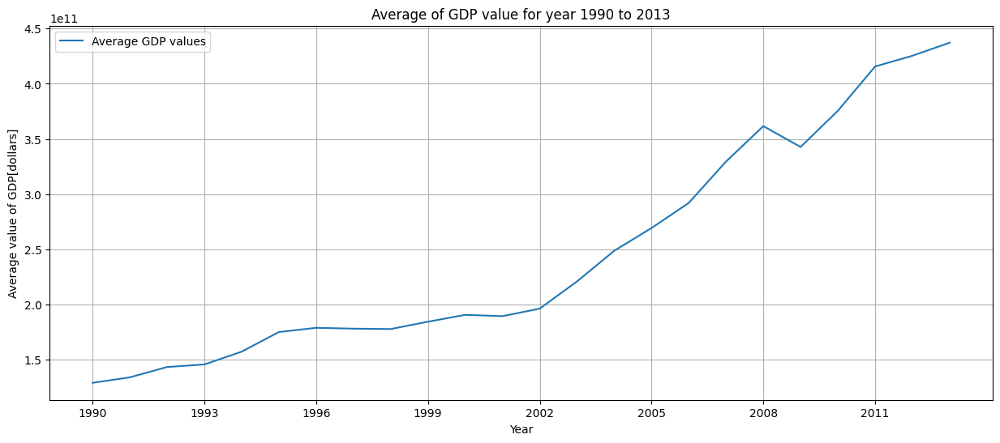

In [ ]:
#normal plot
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(15, 6))
plt.plot(years,avg_gdp_yearwise,label="Average GDP values")
plt.title('Average of GDP value for year 1990 to 2013')
ax.axis("equal")
plt.xlabel('Year')
plt.ylabel('Average value of GDP[dollars]')
plt.xticks(np.arange(1990, 2014, 3))
plt.grid(True)
plt.legend()
plt.show()

The above line plot is for average GDP values from 1990 to 2013 and by seeing the plot we can say that there is a gradually increase in the average GDP value from the year 1990 to 2013 except at the year 2008 and it may be due to the global finanical crisis happened at that time period.The average GDP has been increased approximately four times from the year 1990 to 2013.

In [ ]:
fig = px.choropleth(gdp_filtered, locations=gdp_filtered.index,locationmode = "country names",color="1990",color_continuous_scale=px.colors.diverging.BrBG,range_color=(0,3000000000000))

fig.update_layout(title_text ='GDP values of year 1990',margin=dict(l=5, r=600, t=70, b=50))
fig.update_layout(coloraxis_colorbar_title="1990 GDP values in US Dollars")
fig.show()

The above Choropleth is to observe the GDP values for all countries in the year 1990 and by seeing the map we can observe that united states has recorded the highest GDP of 5.96 Trillion US dollars and followed by japan with 3.13 Trillion US dollars.These two countries are far a head in GDP value as compared to all other countries.

In [ ]:
fig = px.choropleth(gdp_filtered, locations=gdp_filtered.index,locationmode = "country names",color="2013",color_continuous_scale=px.colors.diverging.BrBG,range_color=(0,10000000000000))

fig.update_layout(title_text ='GDP values of year 2013',margin=dict(l=5, r=600, t=90, b=50))
fig.update_layout(coloraxis_colorbar_title="2013 GDP values in US Dollars")
fig.show()

The above Choropleth is to observe the GDP values for all countries in the year 2013 and by seeing the map we can observe that united states has recorded the highest GDP of 16.78 Trillion US dollars and followed by china with 9.57 Trillion US dollars.As we see that china has improved a lot and it crosses japan (5.21 Trillion US dollars) in GDP and sits in the second position in the year 2013 and United states still continued in the first place. There are many factors that helps [china](https://www.everycrsreport.com/reports/RL33534.html#:~:text=Database%2C%20April%202019%2C-,Causes%20of%20China's%20Economic%20Growth,gone%20together%20hand%20in%20hand.) to improve GDP like technologies, infrastructure and massive population.

In [ ]:


fig = px.choropleth(gdp_average, locations=gdp_average.index, locationmode = "country names", color="GDP average country wise",color_continuous_scale=px.colors.diverging.BrBG,
                    title="GDP average from 1990 to 2013 country wise",range_color=(0,8000000000000))
fig.update_layout(title_text ='GDP average from year 1990 to 2013 country wise',margin=dict(l=5, r=600, t=90, b=50),legend=dict(x=2, y=3.0, orientation='h'))
fig.update_layout(coloraxis_colorbar_title="GDP average from 1990 to 2013 in US Dollars")
fig.show()

The above Choropleth is to observe the average GDP values for all countries from year 1990 to 2013 and by seeing the map we can observe that united states has recorded the highest average in GDP with 11.04 Trillion US dollars and followed by Japan with 4.77 Trillion US dollars.Though china crosses Japan's GDP in the year 2013 but japan maintains it constant GDP value around 4 to 6 trillion dollars and sits in the second position in terms of average GDP at that time period. china and germany are in next positions in terms of average GDP.

In [ ]:
fig = px.choropleth(difference, locations=difference.index, locationmode = "country names", color="GDP difference",color_continuous_scale=px.colors.diverging.BrBG,
                    title="GDP change for year 1990 to 2013 country wise")
fig.update_layout(title_text ='GDP change for year 1990 to 2013 country wise',margin=dict(l=5, r=600, t=90, b=50))
fig.update_layout(coloraxis_colorbar_title="GDP change for 1990 and 2013 in US Dollars")
fig.show()

The above Choropleth is to observe the change in GDP values for all countries for year 1990 to 2013 and by seeing the map we can observe that united states has recorded the highest change in GDP with 10.82 Trillion US dollars and followed by china with 9.20 Trillion US dollars.We can clearly say that united states was in first position in terms of GDP at every plot we have made and the GDP has been increased to three times in year 2013 compared to year 1990 and coming to china the GDP has increased to 26 times in year 2013 compared to year 1990.

In [ ]:
ghg=ghg.reset_index()
food=food.reset_index()

In [ ]:
#global map of GHG distribution for differnt countries (2013)
fig = px.choropleth(ghg,
                    locations='Country',
                    locationmode='country names',
                    color='2013',
                    hover_name='Country',
                    title = 'Greenhouse Gas emission by country 2013',
                    range_color=[0,14300000000],
                    color_continuous_scale='plasma'
                   )
fig.update_layout(
    autosize=False,
    width=1200,
    height=600,
    margin=dict(
        l=30,
        r=30,
        b=80,
        t=80,
        pad=4
    ),
    template='seaborn',
    paper_bgcolor="rgb(255, 255, 255)",
    legend=dict(
        orientation="v",
        yanchor="auto",
        y=2,
        xanchor="right",
        x=2
))
fig.layout.coloraxis.colorbar.title = 'GHG in 2013 (MtCO2)'
fig.show()

According to the results most of developed and industrialized countries with higher GDP rate are contributors to the GHG emission. Countries such as USA, China, Australia, and Russia. during the last few years we can observe a pick in the fossil fuel burning in the Middle East since more than 80% (1,241.82 billion barrels) of the world's proven oil reserves are located in OPEC Member Countries including Iran, Saudi Arabia, United Arab Emirates, Algeria, Nigeria.

In [ ]:
#global map of GHG distribution for differnt countries (1990)
fig = px.choropleth(ghg,
                    locations='Country',
                    locationmode='country names',
                    color='1990',
                    hover_name='Country',
                    title = 'Greenhouse Gas emission by country 1990',
                    range_color=[0,14300000000],
                    color_continuous_scale='plasma'
                   )
fig.update_layout(
    autosize=False,
    width=1200,
    height=600,
    margin=dict(
        l=30,
        r=30,
        b=80,
        t=80,
        pad=4
    ),
    template='seaborn',
    paper_bgcolor="rgb(255, 255, 255)",
    legend=dict(
        orientation="v",
        yanchor="auto",
        y=2,
        xanchor="right",
        x=2
))
fig.layout.coloraxis.colorbar.title = 'GHG in 1990 (MtCO2)'
fig.show()

Comparing this results with previous one in 2013 can provide us with a good understanding of countries growth and GHG emission. In comparison, in 1990 the most industrialized countries were USA, Canada, Germany, France, Russia and China and many other countries such as india, Australia were in the developing phase of their economy. But clearly after 23 years timelapse, those developing countries has been reached to the developed phase in 2013 which consequently this growth was associated with more environmental pollution and GHG emission.  

<ipython-input-423-c14099f9c2d4>:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Text(0.5, 0.98, 'Cumulative GHG emission for top 10 countries')

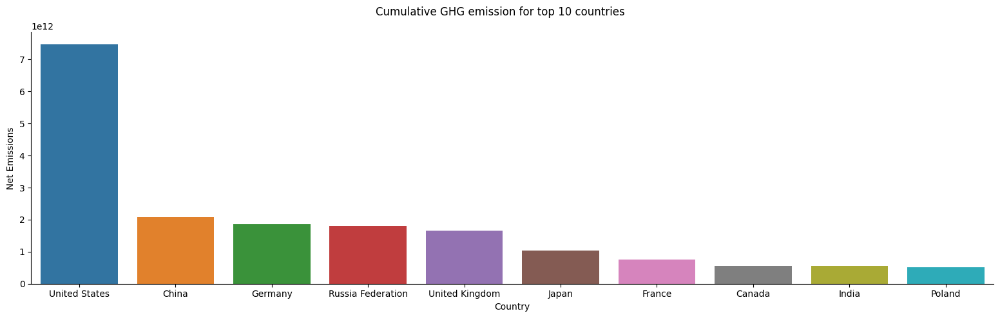

In [ ]:
#Ranking and graphing the cumulative GHG emission of countries between 1990-2013
ghg["Net Emissions"]=ghg.sum(axis=1)
sorted = ghg.sort_values(by='Net Emissions',ascending=False)
aa=sorted.iloc[0:10]
aaa=aa.head(10)
rp=sns.catplot(x="Country", y="Net Emissions", kind="bar", data=aaa,height=5, aspect=25/8)
rp.fig.subplots_adjust(top=0.9)
rp.fig.suptitle('Cumulative GHG emission for top 10 countries')

After calculating the cumulative GHG emission for all countries and sorting the data, results show that top countries that contribute to the global warming between 1990-2013 are USA with almost 6 trillion tons of CO2 emission , China with roughly 2 trillion tons, and the third place germany with 1.5 trillion tons of CO2. According to Global PEO service [link text](https://globalpeoservices.com/top-15-countries-by-gdp-in-2022/), top countries with strongest gross domestic product values are USA, China, Germany and Japan which is clear indication of economic growth and GHG emission.

In [ ]:
#global map of food inflation for different countries (2013)
fig = px.choropleth(food,
                    locations='Country',
                    locationmode='country names',
                    color='2013',
                    hover_name='Country',
                    title = 'Consumer Food Price inflation by country 2013',
                    range_color=[0,20],
                    color_continuous_scale='reds'
                   )
fig.update_layout(
    autosize=False,
    width=1200,
    height=600,
    margin=dict(
        l=30,
        r=30,
        b=80,
        t=80,
        pad=4
    ),
    template='seaborn',
    paper_bgcolor="rgb(255, 255, 255)",
    legend=dict(
        orientation="v",
        yanchor="auto",
        y=2,
        xanchor="right",
        x=2
))
fig.layout.coloraxis.colorbar.title = 'CFPI in 2013 (%YoY)'
fig.show()

Consumer Food Price (CFPI) includes foreign or imported goods is based on the prices of food and services consumers buy from a fixed basket of goods. preliminary analysis on CFPI indicated that generally countries with less economic stability or lower GDP are experiencing the most inflation in the citizens food and service prices. Most of African countries and Iran in the Middle-East, Ukrain in the Europe and Venezuela in south america are soffering from inflation in the food price.  

In [ ]:
#global map of food inflation for different countries (1990)
fig = px.choropleth(food,
                    locations='Country',
                    locationmode='country names',
                    color='1990',
                    hover_name='Country',
                    title = 'Consumer Food Price inflation by country 1990',
                    range_color=[0,20],
                    color_continuous_scale='reds'
                   )
fig.update_layout(
    autosize=False,
    width=1200,
    height=600,
    margin=dict(
        l=30,
        r=30,
        b=80,
        t=80,
        pad=4
    ),
    template='seaborn',
    paper_bgcolor="rgb(255, 255, 255)",
    legend=dict(
        orientation="v",
        yanchor="auto",
        y=2,
        xanchor="right",
        x=2
))
fig.layout.coloraxis.colorbar.title = 'CFPI in 1990 (%YoY)'
fig.show()

in this graph similar to GHG emission, there is a clear pattern that most of south american and asia pacific countries were suffering from food price inflation in 1990 since they were in the developing phase but more and more economic growth secured their production and economic prosperity. Economic growth consequently resulted in the more financial and political stability which resulted in food price stability and less inflation.  

<ipython-input-426-8ecf3c15c86d>:2: FutureWarning:

Dropping of nuisance columns in DataFrame reductions (with 'numeric_only=None') is deprecated; in a future version this will raise TypeError.  Select only valid columns before calling the reduction.



Text(0.5, 0.98, 'Cumulative Consumer Food Price Inflation for top 10 countries')

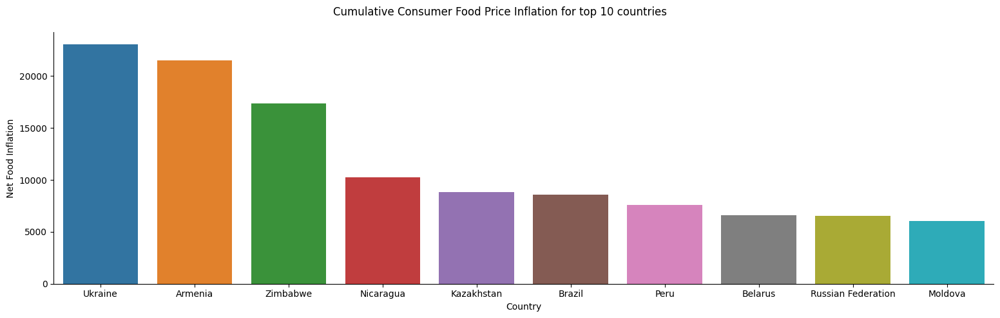

In [ ]:
#Ranking and ngraphing the cumulative of food inflation for different countries between 1990-2013
food["Net Food Inflation"]=food.sum(axis=1)
sorted1 = food.sort_values(by='Net Food Inflation',ascending=False)
aa2=sorted1.iloc[0:10]
aa2.head(10)
rp1=sns.catplot(x="Country", y="Net Food Inflation", kind="bar", data=aa2,height=5, aspect=25/8)
rp1.fig.subplots_adjust(top=0.9)
rp1.fig.suptitle('Cumulative Consumer Food Price Inflation for top 10 countries')

a quick glance at to ten countries with food price inflation from 1990-2013 shows that most of them included in this list are third-world destinations with less economic stability and low GDP. if we want to compare this graph with top ten in GHG, we can observe that non of these contries are massive contributors to the global warming but they suffer from it's consequences caused by industrialized countriens.  

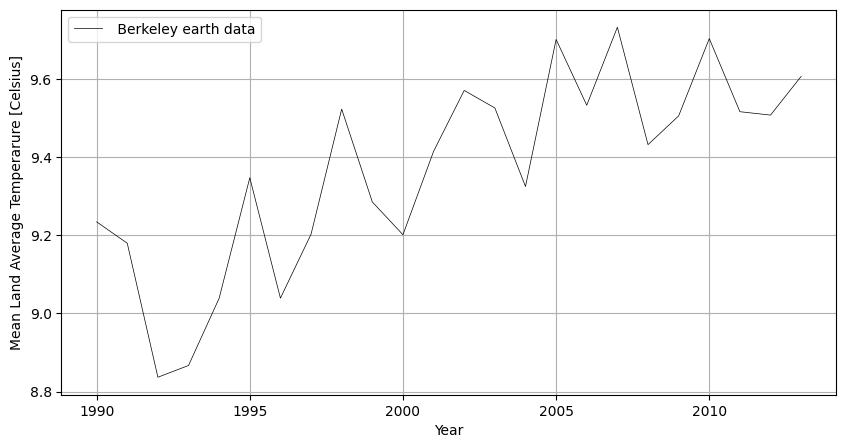

In [ ]:
ax = tempf.plot("year", "LandAverageTemperature",linewidth=0.5,color="black",figsize=(10, 5), grid=True, xlabel="Year",
          ylabel="Mean Land Average Temperarure [Celsius]",label=" Berkeley earth data")

This is the trend of global mean average temperature from 1990-2013. A random trend can be observed but we can clearly see that the mean average land temperature is increasing. The rise in average world land temperature is approximately 1.5 degrees C in the past 250 years, and about 0.9 degrees in the past 50 years. (Berkeley Earth , 2019)|

In [ ]:
country_temp = ct.groupby(by = ['Country']).mean().reset_index()
fig3 = px.choropleth(country_temp, locations="Country", locationmode = "country names", color="AverageTemperature",
                    color_continuous_scale=px.colors.diverging.BrBG,labels={'AverageTemperature':'Mean Average Temperature in Celsius'},
                    title="Mean Average Temperature Contrywise Worldwide")
fig3.update_layout( title_x=0.14, title_y=0.9 ,margin=dict(l=5, r=500, t=90, b=40),legend=dict(x=-2.0, y=-2.0, orientation='h'))
fig3.update_layout(coloraxis_colorbar_x=0.85)
fig3.show()

<ipython-input-428-abceb9d567f8>:1: FutureWarning:

The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.



The choropleth depicts the mean average temperature countrywise across the globe from 1990-2013. The scale used is a diverging scale. All the values which are positive are shaded in green and the one's with a negative temperature are in brown.

In [ ]:
fig90 = px.choropleth(country_temp_90, locations="Country", locationmode = "country names", color="AverageTemperature_1990",
                    color_continuous_scale=px.colors.diverging.BrBG, labels={'AverageTemperature_1990':'Mean Average Temperature in Celsius'},
                    title="Mean Average Temperature Contrywise Worldwide in 1990")
fig90.update_layout( title_x=0.14, title_y=0.9 ,margin=dict(l=5, r=500, t=90, b=40),legend=dict(x=-2.0, y=-2.0, orientation='h'))
fig90.update_layout(coloraxis_colorbar_x=0.85)
fig90.show()

The choropleth depicts the mean average temperature countrywise across the globe for 1990. Djibouti has the highest average temperature followed by Mali (29.3 °C).Greenland (-18.3 °C)and Denmark (-17.3 °C) have the lowest average temperature


In [ ]:
fig20 = px.choropleth(country_temp_20, locations="Country", locationmode = "country names", color="AverageTemperature_2013",
                    color_continuous_scale=px.colors.diverging.BrBG, labels={'AverageTemperature_2013':'Mean Average Temperature in Celsius'},
                    title="Mean Average Temperature Contrywise Worldwide in 2013")
fig20.update_layout( title_x=0.14, title_y=0.9 ,margin=dict(l=5, r=500, t=90, b=40),legend=dict(x=-2.0, y=-2.0, orientation='h'))
fig20.update_layout(coloraxis_colorbar_x=0.85)
fig20.show()

The choropleth depicts the mean average temperature countrywise across the globe for 2013. Djibouti (30.7 °C) has the highest average temperature ( Hottest country on earth) followed by Mali (29.9 °C)
Greenland (-15.4°C)and Denmark (-14.9 °C) have the lowest average temperature. We can see that the temperature has significantly increased from the year 1990 to 2013.  



In [ ]:
figmerged = px.choropleth(merged_country_temp, locations="Country", locationmode = "country names", color="temp_diff",
                    color_continuous_scale=px.colors.diverging.BrBG)
figmerged.update_layout(title_text ='Difference in Mean Average Temperature (2013-1990)', title_x=0.14, title_y=0.9 ,margin=dict(l=5, r=500, t=90, b=40),legend=dict(x=-2.0, y=-2.0, orientation='v'))
figmerged.update_layout(coloraxis_colorbar_title="Mean Average Temperature Difference in Celsius 2013-1990")
figmerged.update_layout(coloraxis_colorbar_x=0.85)
figmerged.show()

Based on the choropleth we can clearly see that the areas closer to the north pole, mainly the arctic region are have seen the maximum increase in temperature for our timeframe.

 This is also supported by literature which state that the Arctic region, which includes the North Pole and surrounding areas, is experiencing more rapid warming than other parts of the world. This phenomenon is known as Arctic amplification.

The countries that see an increase in temperature are not necessarily the countries that emit maximum GHG or have maximum GDP.

According to data from the National Oceanic and Atmospheric Administration (NOAA), the Arctic region has been warming at a rate of about twice the global average over the past few decades. The consequences of this rapid warming in the Arctic are significant, including melting sea ice, rising sea levels, and changes in weather patterns around the globe.



# Second Phase of Analysis

GDP Analysis

### **Previous Literature and References**

So, We have GDP data and we want to observe the clusters with similar trends.so we use kmeans algorithm.

In [ ]:
from pandas.core.common import random_state
from sklearn.cluster import KMeans
# fitting the data into the model and seting the parameter to the model
km=KMeans(n_clusters=3,random_state=10)
km.fit(gdp_filteredst)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=3, random_state=10)

We use Kmeans cluster algorithm to find the clusters in the GDP standardized dataset and we set number of clusters is 3 and random state is 10 as parameters to the model.

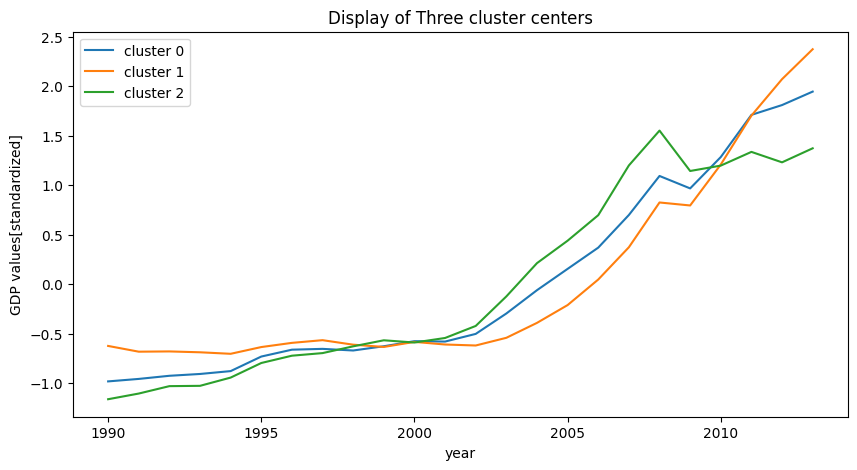

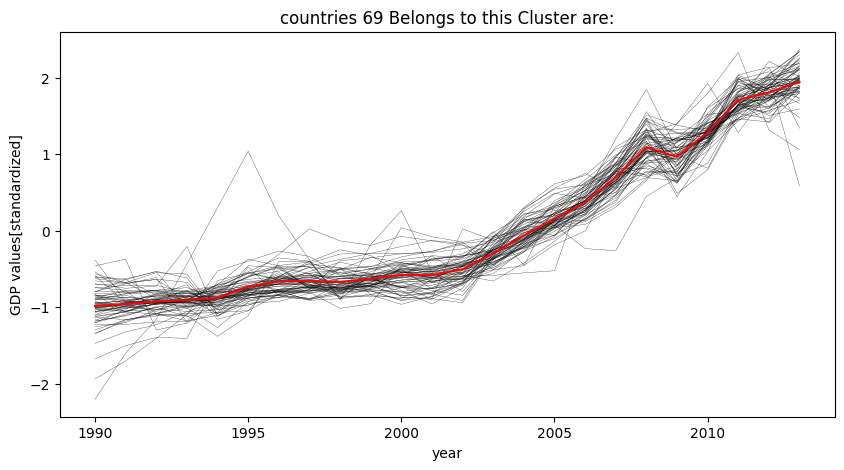

['Algeria' 'Armenia' 'Bahrain' 'Bangladesh' 'Benin' 'Bhutan' 'Botswana'
 'Brunei Darussalam' 'Bulgaria' 'Burkina Faso' 'Cambodia' 'Cameroon'
 'Canada' 'Chad' 'Chile' 'Comoros' 'Costa Rica' "Côte d'Ivoire"
 'Dominican Republic' 'Ecuador' 'Equatorial Guinea' 'Fiji' 'Gabon'
 'Guatemala' 'Guinea-Bissau' 'Guyana' 'Haiti' 'Honduras' 'Hong Kong SAR'
 'India' 'Iran, Islamic Rep.' 'Japan' 'Jordan' 'Kuwait' 'Lebanon'
 'Lesotho' 'Macedonia, FYR' 'Madagascar' 'Malawi' 'Malaysia' 'Maldives'
 'Mali' 'Malta' 'Mauritius' 'Morocco' 'Mozambique' 'Namibia' 'New Zealand'
 'Nicaragua' 'Nigeria' 'Norway' 'Pakistan' 'Samoa' 'Saudi Arabia'
 'Senegal' 'Singapore' 'South Africa' 'Suriname' 'Sweden' 'Switzerland'
 'Tanzania' 'Togo' 'Tonga' 'Turkey' 'United Arab Emirates' 'Vanuatu'
 'Venezuela, RB' 'Vietnam' 'Yemen, Rep.']





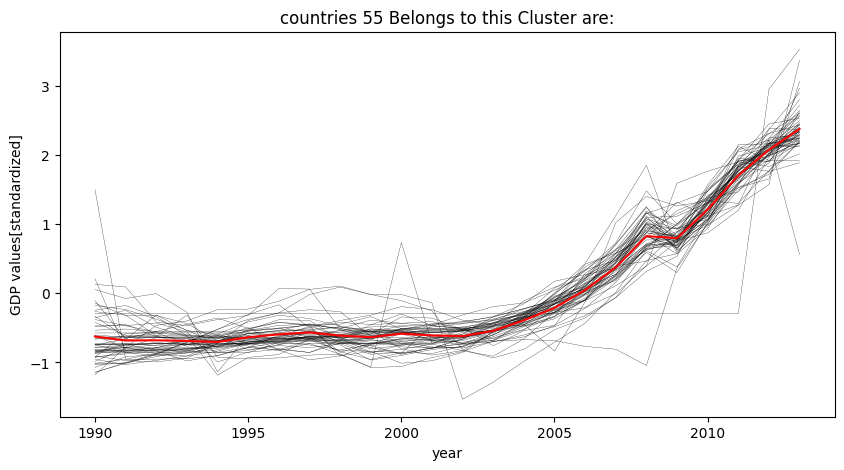

['Afghanistan' 'Angola' 'Argentina' 'Australia' 'Azerbaijan' 'Belarus'
 'Bolivia' 'Brazil' 'Burundi' 'Central African Republic' 'China'
 'Colombia' 'Congo, Dem. Rep.' 'Congo, Rep.' 'Curacao' 'Djibouti'
 'Egypt, Arab Rep.' 'Ethiopia' 'Georgia' 'Ghana' 'Guinea' 'Indonesia'
 'Iraq' 'Israel' 'Kazakhstan' 'Kenya' 'Kyrgyz Republic' 'Lao PDR'
 'Liberia' 'Mauritania' 'Moldova' 'Mongolia' 'Myanmar' 'Nepal' 'Niger'
 'Oman' 'Panama' 'Papua New Guinea' 'Paraguay' 'Peru' 'Philippines'
 'Qatar' 'Russian Federation' 'Rwanda' 'São Tomé and Principe'
 'Sierra Leone' 'Sri Lanka' 'Tajikistan' 'Thailand' 'Uganda' 'Ukraine'
 'Uruguay' 'Uzbekistan' 'Zambia' 'Zimbabwe']





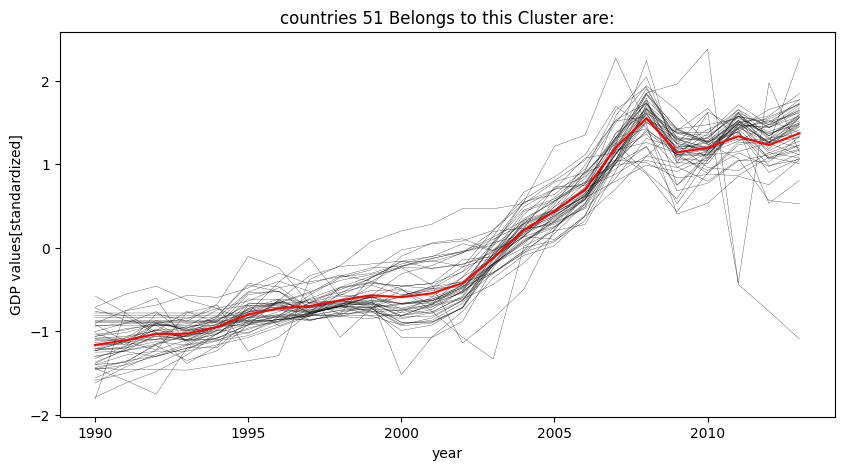

['Albania' 'Antigua and Barbuda' 'Aruba' 'Austria' 'Bahamas, The'
 'Barbados' 'Belgium' 'Belize' 'Bosnia and Herzegovina' 'Cabo Verde'
 'Croatia' 'Cyprus' 'Czech Republic' 'Denmark' 'Dominica' 'El Salvador'
 'Estonia' 'Finland' 'France' 'Gambia, The' 'Germany' 'Greece' 'Grenada'
 'Hungary' 'Iceland' 'Ireland' 'Italy' 'Jamaica' 'Korea, Rep.' 'Latvia'
 'Libya' 'Lithuania' 'Luxembourg' 'Mexico' 'Montenegro' 'Netherlands'
 'New Caledonia' 'Poland' 'Portugal' 'Romania' 'Serbia' 'Seychelles'
 'Slovak Republic' 'Slovenia' 'Spain' 'Sudan' 'Syrian Arab Republic'
 'Trinidad and Tobago' 'Tunisia' 'United Kingdom' 'United States']





In [ ]:

#plot all cluster centers
fig, ax = plt.subplots(figsize=(10, 5))
lins=ax.plot(years, km.cluster_centers_.T)
ax.set_xlabel("year")
ax.set_ylabel("GDP values[standardized]")
ax.legend(lins, ["cluster 0", "cluster 1", "cluster 2"])
ax.set_title("Display of Three cluster centers")
fig.show()

#add some space after the graph
plt.pause(0.01)
print("\n\n")

#plot each cluster individually and its members
for cluster_number in range(km.n_clusters):

  #True/False index of where label_ is cluster_number
  ind = km.labels_ == cluster_number

  # get the members of that cluster number
  mems = gdp_filteredst[ind]

  #make a plot
  fig, ax = plt.subplots(figsize=[10, 5])
  ax.plot(years, mems.T, lw=0.2, color="k",label=gdp_filteredst.index[ind].values)
  ax.plot(years, km.cluster_centers_[cluster_number], color="r")
  ax.set_xlabel("year")
  ax.set_ylabel("GDP values[standardized]")
  total=len(gdp_filteredst.index[ind].values)
  ax.set_title('countries {total} Belongs to this Cluster are:'.format(total=total))
  fig.show()

  # -- refresh screen
  plt.pause(0.01)
  print(gdp_filteredst.index[ind].values)
  print("\n\n")

We can see the cluster analysis plot above and individual cluster plots of cluster 0, 1 and 2. Also countries belong to the individual clusters are mentioned in the plot.These are the observation we made from each clusters

Cluster 0:

We have 69 countries out of 175 countries belong to this cluster 0. Some countries in this cluster such as bahrain, kuwait, saudi arabia and the united arab emirates(UAE) which are belong to the same middle east region and also are oil producing countries with high dependence on oil for their economics and Some countries like bangladesh, cambodia, Benin, malli.. etc have similar levels of economic development and also which are among poorest countries in the world belong to this cluster.some countries like India, canada, japan, norway, switzerland and united arab emirates are among world richest countries belong to this cluster.

Cluster 1:

We have 55 countries out of 175 countries belong to this cluster 1. Some countries like brazil, columbia and peru..etc which are belong to the same region south america are known for it natural resources and have significant exports of commodities such as gas and minerals.Some countries like afghanistan, Burundi, liberia, Niger.. etc which are among poorest countries in the world belong to this cluster. Some countries like china, australia, qatar and israel..etc are among richest countries in the world belong to this cluster 1.

Cluster 2:

We have 51 countries out of 175 countries belong to this cluster 2. Most of the countries in this cluster are below to this european region.Some countries like Austria, Belgium, Denmark, estonia, Finland, ireland, iceland, italy, netherlands and united kingdom..etc are belong to the same european region are of same cluster and United states are also belong to this cluster 2.


In [ ]:
km.labels_

array([1, 2, 0, 1, 2, 1, 0, 2, 1, 2, 1, 2, 0, 0, 2, 1, 2, 2, 0, 0, 1, 2,
       0, 1, 0, 0, 0, 1, 2, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 2, 1,
       2, 2, 2, 1, 2, 0, 0, 1, 2, 0, 2, 1, 0, 2, 2, 0, 2, 1, 2, 1, 2, 2,
       0, 1, 0, 0, 0, 0, 0, 2, 2, 0, 1, 0, 1, 2, 1, 2, 2, 0, 0, 1, 1, 2,
       0, 1, 1, 2, 0, 0, 1, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 1, 0, 2, 1, 1,
       2, 0, 0, 1, 0, 1, 2, 2, 0, 0, 1, 0, 0, 1, 0, 1, 1, 1, 1, 1, 2, 2,
       1, 2, 1, 1, 0, 1, 0, 0, 2, 2, 1, 0, 2, 2, 0, 2, 1, 2, 0, 0, 0, 2,
       1, 0, 1, 0, 0, 2, 2, 0, 1, 1, 0, 2, 2, 1, 1, 0, 0, 0, 0, 1, 1],
      dtype=int32)

These are the labels from the each countries it represents which countries belongs to which clusters.

In [ ]:
gdp_filtered['clusterlabels']=km.labels_.astype(str)

<ipython-input-435-e2875ea5aba3>:1: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [ ]:
gdp_filtered

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,clusterlabels
Country Name,,,,,,,,,,,,,,,,,,,,,
Afghanistan,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,4.055180e+09,...,6.209138e+09,6.971286e+09,9.747880e+09,1.010931e+10,1.241616e+10,1.585668e+10,1.780511e+10,1.990732e+10,2.014640e+10,1
Albania,2.028554e+09,1.099559e+09,6.521750e+08,1.185315e+09,1.880952e+09,2.392765e+09,3.199641e+09,2.258514e+09,2.545965e+09,3.212122e+09,...,8.052074e+09,8.896073e+09,1.067732e+10,1.288135e+10,1.204421e+10,1.192692e+10,1.289076e+10,1.231983e+10,1.277622e+10,2
Algeria,6.204856e+10,4.571561e+10,4.800308e+10,4.994560e+10,4.254318e+10,4.176432e+10,4.694158e+10,4.817761e+10,4.818775e+10,4.864065e+10,...,1.030000e+11,1.170000e+11,1.350000e+11,1.710000e+11,1.370000e+11,1.610000e+11,2.000000e+11,2.090000e+11,2.100000e+11,0
Angola,1.123628e+10,3.390500e+09,3.390500e+09,3.390500e+09,3.390500e+09,5.561222e+09,7.526964e+09,7.649716e+09,6.506619e+09,6.152937e+09,...,3.697092e+10,5.238101e+10,6.526645e+10,8.853861e+10,7.030716e+10,8.379950e+10,1.120000e+11,1.280000e+11,1.370000e+11,1
Antigua and Barbuda,4.594704e+08,4.817074e+08,4.992815e+08,5.351741e+08,5.894296e+08,5.772815e+08,6.337296e+08,6.806185e+08,7.278593e+08,7.662000e+08,...,1.022963e+09,1.157663e+09,1.312759e+09,1.370070e+09,1.228330e+09,1.148700e+09,1.137637e+09,1.199948e+09,1.181448e+09,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"Venezuela, RB",4.859832e+10,5.347697e+10,6.040180e+10,6.006501e+10,5.841867e+10,7.740773e+10,7.054321e+10,8.584353e+10,9.133120e+10,9.797689e+10,...,1.460000e+11,1.830000e+11,2.300000e+11,3.160000e+11,3.300000e+11,3.930000e+11,3.160000e+11,3.810000e+11,3.710000e+11,0
Vietnam,6.471741e+09,9.613370e+09,9.866990e+09,1.318095e+10,1.628643e+10,2.073616e+10,2.465747e+10,2.684370e+10,2.720960e+10,2.868366e+10,...,5.763326e+10,6.637166e+10,7.741443e+10,9.913030e+10,1.060000e+11,1.160000e+11,1.360000e+11,1.560000e+11,1.710000e+11,0
"Yemen, Rep.",5.647119e+09,5.930370e+09,6.463650e+09,5.368271e+09,4.167356e+09,4.258789e+09,5.785685e+09,6.838557e+09,6.325142e+09,7.641103e+09,...,1.674634e+10,1.906198e+10,2.165053e+10,2.691085e+10,2.513027e+10,3.090675e+10,3.272642e+10,3.540134e+10,4.041524e+10,0


In [ ]:
fig = px.choropleth(gdp_filtered, locations=gdp_filtered.index,locationmode = "country names",color="clusterlabels",color_continuous_scale=px.colors.diverging.BrBG,range_color=(0,3000000000000))

fig.update_layout(title_text ='GDP with cluster labels ',margin=dict(l=5, r=600, t=70, b=50))
fig.show()

As we can observe from the choropleth, green labeled countries are belong to cluster 0 and blue labeled countries are belong to cluster 1 and red labelled countries are belong to cluster 2. As we can observed few patterns in same regions like pakistan, india, iran, bangladesh, Saudi Arabia and yemen are belong to same cluster 0 and we can observe few patterns in south america and Top asia part belongs to cluster 1 and we observe that most of the countries of cluster 2 belong to the european region. so found some patterns in this regions and this can be due to so many reasons like same political influence, imports and exports, share same natural resources.

In [ ]:
avg_gdp_yearwisedata

,Year,averageGDP
0,1990,1.290079e+11
1,1991,1.339958e+11
2,1992,1.433478e+11
3,1993,1.456630e+11
4,1994,1.572450e+11
5,1995,1.750389e+11
6,1996,1.788685e+11
7,1997,1.781121e+11
8,1998,1.777489e+11
9,1999,1.844011e+11


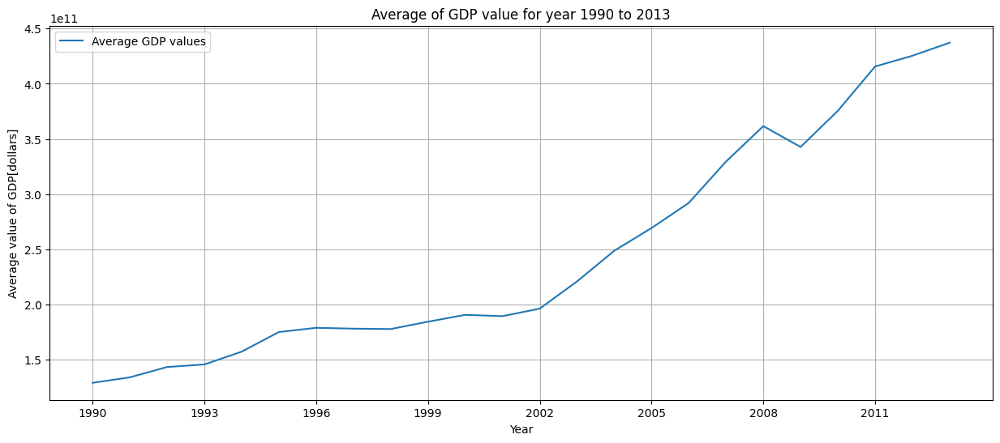

In [ ]:
#normal plot
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(15, 6))
plt.plot(avg_gdp_yearwisedata['Year'],avg_gdp_yearwisedata['averageGDP'],label="Average GDP values")
plt.title('Average of GDP value for year 1990 to 2013')
ax.axis("equal")
plt.xlabel('Year')
plt.ylabel('Average value of GDP[dollars]')
plt.xticks(np.arange(1990, 2014, 3))
plt.grid(True)
plt.legend()
plt.show()

Plot of Average GDP year wise with year in x axis and average GDP value in Y axis and this plot is before standardizing the data.

In [ ]:
avg_gdp_yearwisedata["year_st"] = (avg_gdp_yearwisedata["Year"] - avg_gdp_yearwisedata["Year"].mean()) / avg_gdp_yearwisedata["Year"].std()
avg_gdp_yearwisedata["averageGDP_st"] = (avg_gdp_yearwisedata["averageGDP"] - avg_gdp_yearwisedata["averageGDP"].mean()) / avg_gdp_yearwisedata["averageGDP"].std()

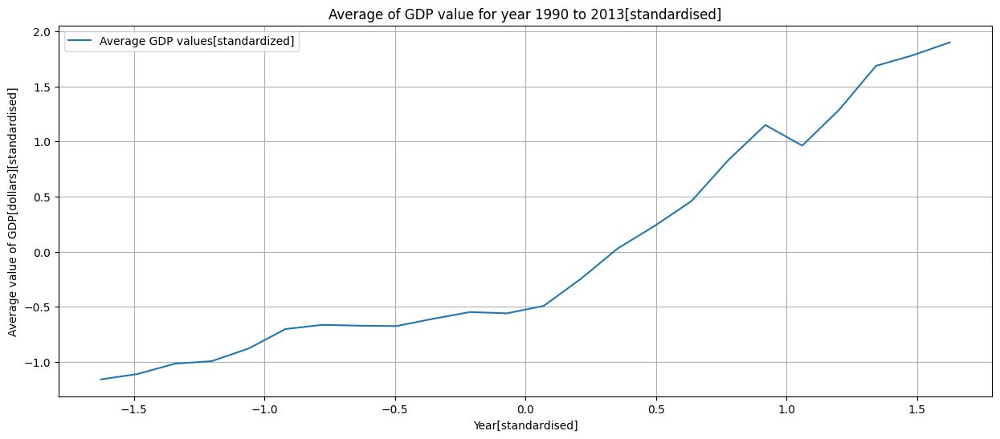

In [ ]:
#normal plot
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(15, 6))
plt.plot(avg_gdp_yearwisedata['year_st'],avg_gdp_yearwisedata['averageGDP_st'],label="Average GDP values[standardized]")
plt.title('Average of GDP value for year 1990 to 2013[standardised]')
ax.axis("equal")
plt.xlabel('Year[standardised]')
plt.ylabel('Average value of GDP[dollars][standardised]')
plt.grid(True)
plt.legend()
plt.show()

This is plot after standardized the data and X axis(year), Y axis(average value of GDP) both are standardized and plotted. we can see that trend doesn't change before and after standardization.

In [ ]:
from sklearn.linear_model import SGDRegressor
model=SGDRegressor()
model.fit(avg_gdp_yearwisedata[["year_st"]],avg_gdp_yearwisedata["averageGDP_st"])
pred_GDP=model.predict(avg_gdp_yearwisedata[["year_st"]])
avg_gdp_yearwisedata["predaverageGDP"]=pred_GDP

In [ ]:
model_normal=(pred_GDP*avg_gdp_yearwisedata['averageGDP'].std())+ avg_gdp_yearwisedata['averageGDP'].mean()

In [ ]:
avg_gdp_yearwisedata['model_normal']=model_normal

In [ ]:
avg_gdp_yearwisedata

,Year,averageGDP,year_st,averageGDP_st,predaverageGDP,model_normal
0,1990,1.290079e+11,-1.626346,-1.159115,-1.357267,1.090483e+11
1,1991,1.339958e+11,-1.484924,-1.109597,-1.239320,1.209289e+11
2,1992,1.433478e+11,-1.343503,-1.016753,-1.121374,1.328094e+11
3,1993,1.456630e+11,-1.202082,-0.993769,-1.003428,1.446900e+11
4,1994,1.572450e+11,-1.060660,-0.878786,-0.885482,1.565706e+11
5,1995,1.750389e+11,-0.919239,-0.702135,-0.767536,1.684512e+11
6,1996,1.788685e+11,-0.777817,-0.664116,-0.649590,1.803318e+11
7,1997,1.781121e+11,-0.636396,-0.671625,-0.531643,1.922123e+11
8,1998,1.777489e+11,-0.494975,-0.675232,-0.413697,2.040929e+11
9,1999,1.844011e+11,-0.353553,-0.609191,-0.295751,2.159735e+11


In [ ]:
mse = np.mean((avg_gdp_yearwisedata["averageGDP"] - avg_gdp_yearwisedata["model_normal"])**2)
print("MSE = {0:0.3}".format(mse))
r2 = r2_score(avg_gdp_yearwisedata["averageGDP"], avg_gdp_yearwisedata["model_normal"])
print("R^2 = {0:0.2}".format(r2))

MSE = 1.02e+21
R^2 = 0.89


we want to predict the GDP values of all the years from 1990 t0 2013. So We decide to use SDG Regressor to predict the GDP values of all the year. We will implement the same as we did in the assignment 2, standardize the data and fit the model with this standardized data and with this model we used to predict the GDP and the predicted values are also in standardized so we want to unstandardize the data. Later we calculate the MSE and R2 to analyse the model performance and we got MSE of 1.03e+21 and R2 of value 0.89 which is very good R2 square value but the MSE was high which is not that good for the model.


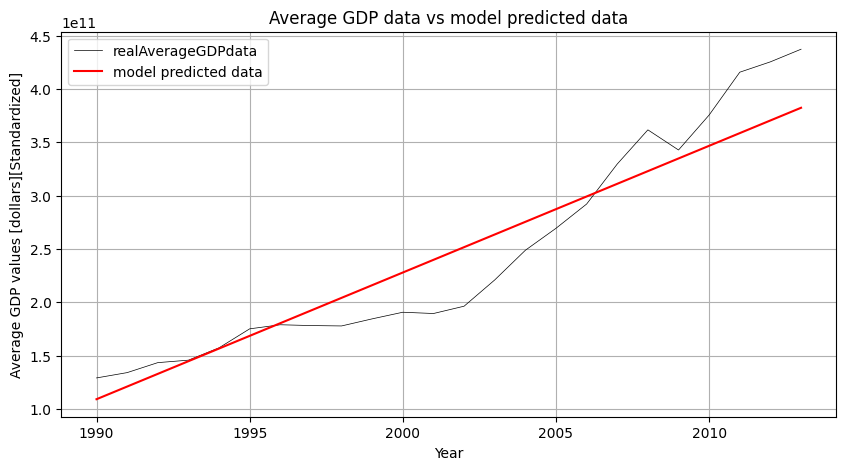

In [ ]:
ax = avg_gdp_yearwisedata.plot("Year", "averageGDP",linewidth=0.5,color="black",figsize=(10, 5), grid=True, xlabel="Year [Standardized]",
          ylabel="Average GDP values [dollars][Standardized]",label="realAverageGDPdata",title='Average GDP data vs model predicted data')
ax = avg_gdp_yearwisedata.plot("Year", "model_normal", label="model predicted data", color="red",grid=True, ax=ax)


This graph is to plot the model predicted data vs original data. As we can observe that GDP line was not the linear but the model is still doing compartively good as R2 was 0.89 which tells us that how well the model explains the variability.

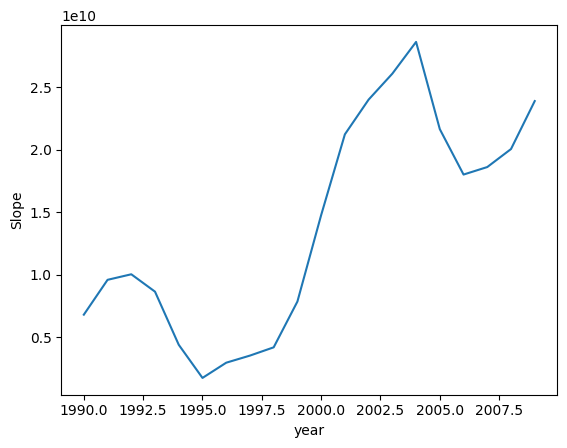

In [ ]:
from sklearn.linear_model import LinearRegression
# perform linear regression on each five year interval in GDP data
slopes = []
start_years = []
pred_gdp=[]
pred_year=[]

# initialize the linear regression model
model = LinearRegression()

for start_year in range(1990, 2010):
    end_year = start_year + 5
    GDP_interval = avg_gdp_yearwisedata[(avg_gdp_yearwisedata['Year'] >= start_year) & (avg_gdp_yearwisedata['Year'] < end_year)]
    x = GDP_interval['Year'].values.reshape(-1, 1)
    y = GDP_interval['averageGDP'].values.reshape(-1, 1)
    # fit the linear regression model
    model.fit(x, y)
    futureyear=end_year
    prediction = model.predict([[futureyear]])
    pred_gdp.append(prediction)
    pred_year.append(futureyear)
    slope, intercept = model.coef_[0], model.intercept_
    slopes.append(slope)
    start_years.append(start_year)

# plot the slopes as a function of time
plt.plot(start_years, slopes)
plt.xlabel('year')
plt.ylabel('Slope')
plt.show()

The above graph shows the slope of GDP raise for 23 years time period and by taking the 5 years time periods as input for model to fit and to find the slopes.

In [ ]:
pred_year=np.array(pred_year)
pred_gdp=np.array(pred_gdp)

In [ ]:
pred_gdp = np.squeeze(pred_gdp)

In [ ]:
print(pred_year)

[1995 1996 1997 1998 1999 2000 2001 2002 2003 2004 2005 2006 2007 2008
 2009 2010 2011 2012 2013 2014]


In [ ]:
new=avg_gdp_yearwisedata[avg_gdp_yearwisedata['Year']>1994]

In [ ]:
new

,Year,averageGDP,year_st,averageGDP_st,predaverageGDP,model_normal
5,1995,1.750389e+11,-0.919239,-0.702135,-0.767536,1.684512e+11
6,1996,1.788685e+11,-0.777817,-0.664116,-0.649590,1.803318e+11
7,1997,1.781121e+11,-0.636396,-0.671625,-0.531643,1.922123e+11
8,1998,1.777489e+11,-0.494975,-0.675232,-0.413697,2.040929e+11
9,1999,1.844011e+11,-0.353553,-0.609191,-0.295751,2.159735e+11
10,2000,1.906076e+11,-0.212132,-0.547574,-0.177805,2.278541e+11
11,2001,1.894074e+11,-0.070711,-0.559490,-0.059859,2.397346e+11
12,2002,1.962711e+11,0.070711,-0.491350,0.058087,2.516152e+11
13,2003,2.208886e+11,0.212132,-0.246956,0.176034,2.634958e+11
14,2004,2.487088e+11,0.353553,0.029234,0.293980,2.753764e+11


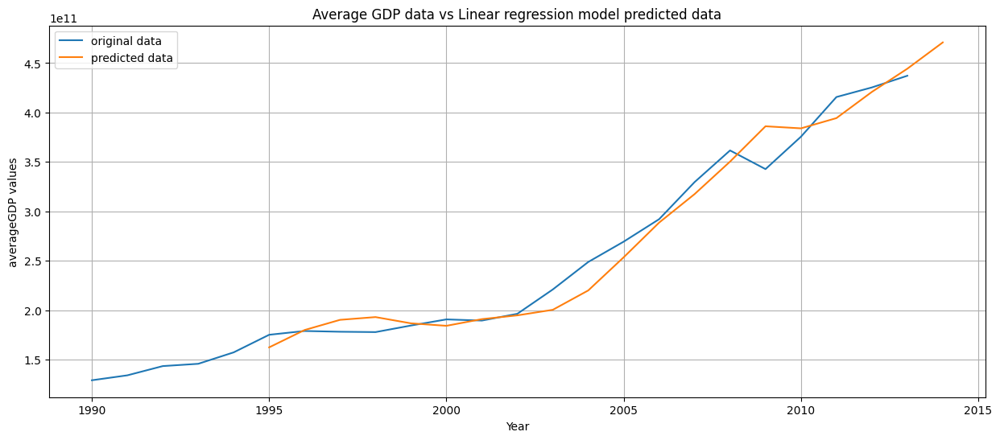

In [ ]:
fig, ax = plt.subplots(figsize=(15, 6))
ax.plot(avg_gdp_yearwisedata['Year'],avg_gdp_yearwisedata['averageGDP'],label='original data')
ax.plot(pred_year,pred_gdp,label='predicted data')
plt.title("Average GDP data vs Linear regression model predicted data")
plt.grid()
ax.legend()
plt.xlabel('Year')
plt.ylabel('averageGDP values')
plt.show()

In [ ]:
mse = np.mean((new['averageGDP'] - pred_gdp[:-1])**2)
print("MSE = {0:0.3}".format(mse))
r2 = r2_score(new["averageGDP"], pred_gdp[:-1])
print("R^2 = {0:0.2}".format(r2))

MSE = 2.56e+20
R^2 = 0.97


As we can this graph, it is plot between the original data values and Model predicted values using linear regression and we are training the model with a period of five years GDP values and predicting the next year values. For performance evaluation we used MSE and R2, we got MSE as 2.56e+20 and R2 value as 0.97.

Clustering, Decision Tree Regressor and visualizatio

In [ ]:
#loading four datasets
rname='/content/drive/MyDrive/MLPP Project/Final Project MLPP group 5/Food consumer price final.csv'
food=pd.read_csv(rname)
bname='/content/drive/MyDrive/MLPP Project/Final Project MLPP group 5/emission data final.csv'
ghg=pd.read_csv(bname)
mname='/content/drive/MyDrive/MLPP Project/Final Project MLPP group 5/Temp_countries_mapped_final.csv'
temp=pd.read_csv(mname)
gname='/content/drive/MyDrive/MLPP Project/Final Project MLPP group 5/gdp final.csv'
gdp=pd.read_csv(gname)

preparing GDP, GHG, temperature and FPI data for analysis

In [ ]:
#rename the column name in the gdp dataset for compatibility between datasets
gdp.rename(columns = {'Country Name':'Country'}, inplace = True)

In [ ]:
#Defining the timeframe of 1990 to 2013 for the countries in the datasets
ghg=ghg.loc[:, ['Country','1990','1991','1992','1993', '1994', '1995', '1996', '1997', '1998',
         '1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010',
         '2011','2012','2013']]
food=food.loc[:, ['Country','1990','1991','1992','1993', '1994', '1995', '1996', '1997', '1998',
         '1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010',
         '2011','2012','2013']]
temp=temp.loc[:, ['Country','1990','1991','1992','1993', '1994', '1995', '1996', '1997', '1998',
         '1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010',
         '2011','2012','2013']]
gdp=gdp.loc[:, ['Country','1990','1991','1992','1993', '1994', '1995', '1996', '1997', '1998',
         '1999','2000','2001','2002','2003','2004','2005','2006','2007','2008','2009','2010',
         '2011','2012','2013']]

selecting specific time line for datasets in order to be consistent for analysis

In [ ]:
#set the index and fill the NAs in the datasets
food = food.set_index("Country")
ghg = ghg.set_index("Country")
gdp = gdp.set_index("Country")
temp = temp.set_index("Country")
gdp= gdp.fillna(method='bfill',axis=1)
gdp= gdp.fillna(method='ffill',axis=1)
food=food.fillna(method='bfill',axis=1)
gdp= gdp.fillna(method='ffill',axis=1)
ghg=ghg.fillna(method='bfill', axis=1)
food_st = food.sub(food.mean(axis=1), axis=0).div(food.std(axis=1), axis=0)
ghg_st = ghg.sub(ghg.mean(axis=1), axis=0).div(ghg.std(axis=1), axis=0)
gdp_st = gdp.sub(gdp.mean(axis=1), axis=0).div(gdp.std(axis=1), axis=0)
temp_st = temp.sub(temp.mean(axis=1), axis=0).div(temp.std(axis=1), axis=0)
food_st = food_st.dropna()
gdp_st  =gdp_st.dropna()

Using melting function in order to bring time series data in the format of feature and target columns for analysis

In [ ]:
#reset the index and preparing to melt the data (Prepration for merging)
ghg_st = ghg_st.reset_index()
food_st = food_st.reset_index()
gdp_st = gdp_st.reset_index()
temp_st = temp_st.reset_index()
gdpmelt=pd.melt(gdp_st, id_vars=['Country'], var_name='Year', value_name='Value')
gdpmelt=gdpmelt.rename(columns = {'Value':'GDP'})
tempmelt=pd.melt(temp_st, id_vars=['Country'], var_name='Year', value_name='Value')
tempmelt=tempmelt.rename(columns = {'Value':'Temperature'})
ghgmelt=pd.melt(ghg_st, id_vars=['Country'], var_name='Year', value_name='Value')
ghgmelt=ghgmelt.rename(columns = {'Value':'GHG'})
foodmelt=pd.melt(food_st, id_vars=['Country'], var_name='Year', value_name='Value')
foodmelt=foodmelt.rename(columns = {'Value':'FPI'})

Merging datasets based on the country name and year

In [ ]:
#merging the dataframes for Decision Tree Regressor
temp1=foodmelt.merge(gdpmelt,left_on=['Country', 'Year'],right_on=['Country', 'Year'])
temp2=temp1.merge(ghgmelt,left_on=['Country', 'Year'],right_on=['Country', 'Year'])
tempfinal=temp2.merge(tempmelt,left_on=['Country', 'Year'],right_on=['Country', 'Year'])

Setting the target and features in the model where Temperature considered as dependent variable

In [ ]:
#Set the target and features of the model
tempfinal = tempfinal.dropna()
feat = tempfinal[["GDP", 'GHG', 'FPI']]
targ =tempfinal[["Temperature"]]

Running decision tree regressor and splitting data to the trainig and testing sets for analysis

In [ ]:
#running decision tree regressor on training and testing
feat_tr, feat_te, targ_tr, targ_te = train_test_split(feat, targ, test_size=0.2 ,random_state=302)
dtr= DecisionTreeRegressor(max_depth=5)
dtr.fit(feat_tr, targ_tr)

pred = dtr.predict(feat_tr)
accuracy = r2_score(targ_tr, pred)
print("Accuracy:", accuracy)

pred1 = dtr.predict(feat_te)
accuracy1 = r2_score(targ_te, pred1)
print("Accuracy:", accuracy1)
mse = mean_squared_error(targ_te, pred1)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

Accuracy: 0.2966881716089391
Accuracy: 0.1337324756179139
MSE:  0.9544689557848957
RMSE:  0.9769692706451394


results of decision tree regression indicates that model has a  poor performance when Temperature considers as the dependent vaiable. manipulating the max_depth reduced the contrain and give more flexibility to the model that helped current model to perform better in the trainig and testing sets but in general the the variability in the original temperature data deviate the accuracy and predictive power of the model.

Note: Extra analysis for comparing the performance of Random Forest Regressor and Decision Tree

In [ ]:
#Extra evaluation of the model through random forest regressor
feat_tr, feat_te, targ_tr, targ_te = train_test_split(feat, targ, test_size=0.2, random_state=302)
rfr= RandomForestRegressor(max_depth=5)
rfr.fit(feat_tr, targ_tr)

pred4 = rfr.predict(feat_tr)
accuracy4 = r2_score(targ_tr, pred4)
print("Accuracy:", accuracy4)

pred5 = rfr.predict(feat_te)
accuracy5 = r2_score(targ_te, pred5)
print("Accuracy:", accuracy5)
mse = mean_squared_error(targ_te, pred5)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

<ipython-input-464-73d0bab15e70>:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Accuracy: 0.33128944817442085
Accuracy: 0.19059615635203664
MSE:  0.8918155416319199
RMSE:  0.9443598581218496


results of random forest shows that model performed better in the random forest regarding the Rsqr and yielded model with more predictive power both in tarining and testing sets.

In [ ]:
#Finding the best number of the leaf for the decision tree model
from sklearn.model_selection import GridSearchCV
tuned_parameters= [{"min_samples_leaf":[1, 2, 5, 10, 20, 50, 100, 200, 500]}]
dtr_tune= DecisionTreeRegressor()
cv_tune= GridSearchCV(dtr_tune, tuned_parameters)
cv_tune.fit(feat_tr, targ_tr)
cv_tune.best_params_

{'min_samples_leaf': 50}

In [ ]:
#ten-fold cross validation
from sklearn.model_selection import cross_validate
cv_res = cross_validate(dtr, feat_tr, targ_tr, cv=10, return_estimator=True)
cv_res

{'fit_time': array([0.00749874, 0.016716  , 0.00736499, 0.00744605, 0.00724411,
        0.00712347, 0.01352763, 0.01441026, 0.01404834, 0.00734997]),
 'score_time': array([0.00248122, 0.00341773, 0.00281882, 0.00261784, 0.00295854,
        0.00300932, 0.01045775, 0.01036382, 0.00370526, 0.00359392]),
 'estimator': [DecisionTreeRegressor(max_depth=5),
  DecisionTreeRegressor(max_depth=5),
  DecisionTreeRegressor(max_depth=5),
  DecisionTreeRegressor(max_depth=5),
  DecisionTreeRegressor(max_depth=5),
  DecisionTreeRegressor(max_depth=5),
  DecisionTreeRegressor(max_depth=5),
  DecisionTreeRegressor(max_depth=5),
  DecisionTreeRegressor(max_depth=5),
  DecisionTreeRegressor(max_depth=5)],
 'test_score': array([0.23515545, 0.18264867, 0.16979784, 0.1589296 , 0.23915295,
        0.17095221, 0.24842543, 0.20565127, 0.18932425, 0.29467136])}

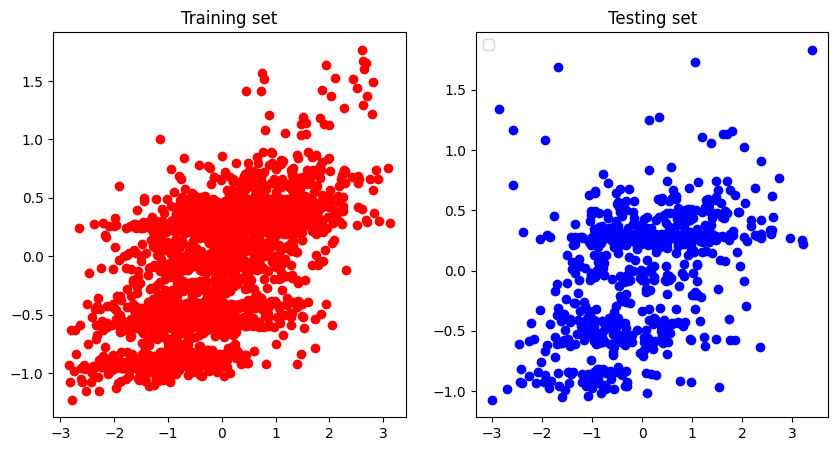

In [ ]:
#visualizing training and testing sets (dependent variable is temperature )
fig, axs=plt.subplots(1,2, figsize=(10,5))
axs[0].scatter(targ_tr, pred4, color="red")
axs[0].set_title("Training set")
axs[1].scatter(targ_te,pred5, color="blue")
axs[1].set_title("Testing set")
plt.legend()
plt.show()

Based on this graph showing the variability of dependent variable and independent variables in both training and testing sets that indicates a high dispersion which is going to justify the low predictive power of our model.

In [ ]:
feature_scoresDTR = pd.Series(rfr.feature_importances_, index=feat_tr.columns).sort_values(ascending=False)
feature_scoresDTR

GHG    0.836620
GDP    0.092121
FPI    0.071259
dtype: float64

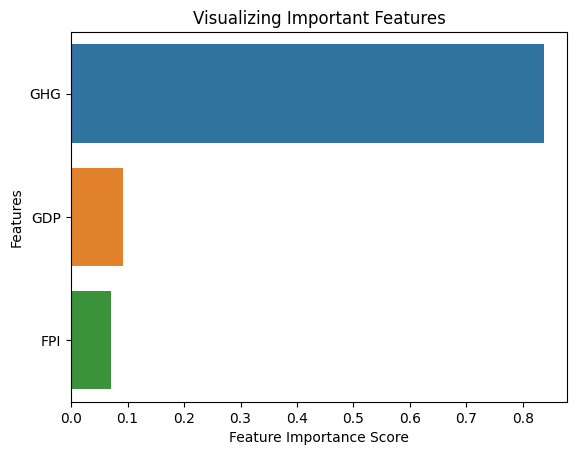

In [ ]:
# Creating a seaborn bar plot

sns.barplot(x=feature_scoresDTR, y=feature_scoresDTR.index)

# Add labels to the graph

plt.xlabel('Feature Importance Score')

plt.ylabel('Features')

# Add title to the graph

plt.title("Visualizing Important Features")
# Visualize the graph

plt.show()

results of this graph show the most important independent variable in the model contributing to the Rsqr prediction power of model.

In [ ]:
#evaluating the accuracy of model after setting optimal number of leaf in the model
dtr_mod = DecisionTreeRegressor(max_depth=5)
dtr_mod.fit(feat_tr, targ_tr)
dtr_mod.fit(feat_tr, targ_tr)

pred = dtr_mod.predict(feat_tr)
accuracy = r2_score(targ_tr, pred)
print("Accuracy:", accuracy)

pred1 = dtr_mod.predict(feat_te)
accuracy = r2_score(targ_te, pred1)
print("Accuracy:", accuracy)
mse = mean_squared_error(targ_te, pred1)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

Accuracy: 0.2966881716089391
Accuracy: 0.1337324756179139
MSE:  0.9544689557848957
RMSE:  0.9769692706451394


Ten-fold cross validation for getting insight to the model prediction performance

In [ ]:
#ten-fold cross validation for observing the accuracy on each fold
from sklearn.model_selection import cross_validate
cv_res = cross_validate(rfr, feat_tr, targ_tr, cv=10, return_estimator=True)
cv_res

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:686: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().

/usr/local/lib/python3.10/dist-packa

{'fit_time': array([0.64952016, 0.58479691, 0.69651222, 0.68022227, 0.77906871,
        1.2746706 , 0.79682302, 0.60570073, 0.6514945 , 0.48957229]),
 'score_time': array([0.01864123, 0.0155251 , 0.02074766, 0.01179218, 0.02597857,
        0.05107737, 0.01570177, 0.01567841, 0.01755977, 0.01450968]),
 'estimator': [RandomForestRegressor(max_depth=5),
  RandomForestRegressor(max_depth=5),
  RandomForestRegressor(max_depth=5),
  RandomForestRegressor(max_depth=5),
  RandomForestRegressor(max_depth=5),
  RandomForestRegressor(max_depth=5),
  RandomForestRegressor(max_depth=5),
  RandomForestRegressor(max_depth=5),
  RandomForestRegressor(max_depth=5),
  RandomForestRegressor(max_depth=5)],
 'test_score': array([0.29865056, 0.19586242, 0.21619049, 0.24695967, 0.26534286,
        0.20891643, 0.27676105, 0.27148975, 0.28606573, 0.27632618])}

Decision Tree regressor GHG as dependent variable

In [ ]:
#GHG as dependent variable and temperature, GDP and FPI are predictors
feat = tempfinal[["GDP", 'Temperature', 'FPI']]
targ =tempfinal[["GHG"]]

in order to check whether the temperature might as dependent variable might be issue or not we replace that with GHG which is good indicator of global warming based on the literature

Splitting the dataset to the training and testing set preparing for decision tree regressor funcation for new model

In [ ]:
#running decision tree regressor on training and testing
feat_tr, feat_te, targ_tr, targ_te = train_test_split(feat, targ, test_size=0.2, random_state=302)
dtr= DecisionTreeRegressor(max_depth=7)
dtr.fit(feat_tr, targ_tr)

pred2 = dtr.predict(feat_tr)
accuracy = r2_score(targ_tr, pred2)
print("Accuracy:", accuracy)

pred3 = dtr.predict(feat_te)
accuracy1 = r2_score(targ_te, pred3)
print("Accuracy:", accuracy1)
mse = mean_squared_error(targ_te, pred1)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

Accuracy: 0.9089065234274436
Accuracy: 0.8274502525332653
MSE:  0.4790544573311396
RMSE:  0.692137599998107


After replacing GHG with temperature results shows more consistancy and improvement in the accuracy both in the training and testing sets

Note: Extra analysis comparing the performance of Random forest regression and decsion tree  

In [ ]:
#Extra evaluation of the model through random forest regressor
feat_tr, feat_te, targ_tr, targ_te = train_test_split(feat, targ, test_size=0.2, random_state=302)
rfr= RandomForestRegressor(max_depth=7)
rfr.fit(feat_tr, targ_tr)

pred6 = rfr.predict(feat_tr)
accuracy6 = r2_score(targ_tr, pred6)
print("Accuracy:", accuracy6)

pred7 = rfr.predict(feat_te)
accuracy7 = r2_score(targ_te, pred7)
print("Accuracy:", accuracy7)
mse = mean_squared_error(targ_te, pred7)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

<ipython-input-474-11475a4edf41>:4: DataConversionWarning:

A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().



Accuracy: 0.9180333105101433
Accuracy: 0.8500333713897628
MSE:  0.146318394617454
RMSE:  0.38251587498750167


Random forest yield more stronger predictive power in both scenarios

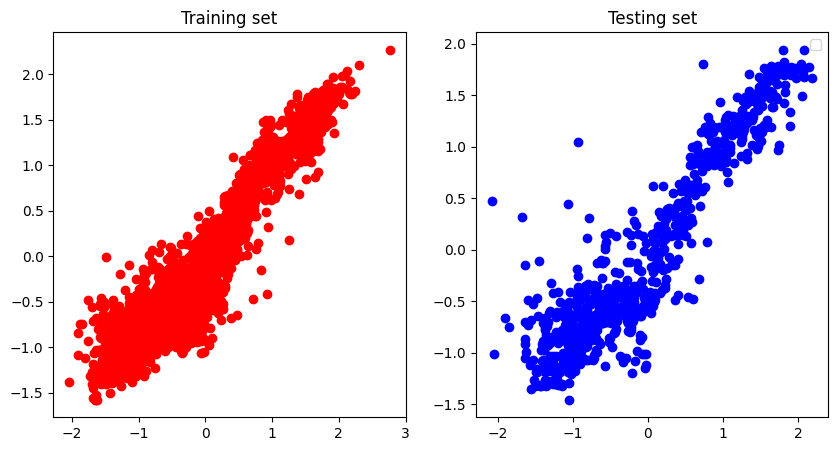

In [ ]:
#Plot Training and testing sets (Dependent variable is GHG)
fig, axs=plt.subplots(1,2, figsize=(10,5))
axs[0].scatter(targ_tr, pred6, color="red")
axs[0].set_title("Training set")
axs[1].scatter(targ_te,pred7, color="blue")
axs[1].set_title("Testing set")
plt.legend()
plt.show()

both decision tree and random forest shows high predictive power of the model since the main reason might be due to the smooth trend of data in GHG. scatter plot now shows more cohesive predictive pattern both in the training and testing sets

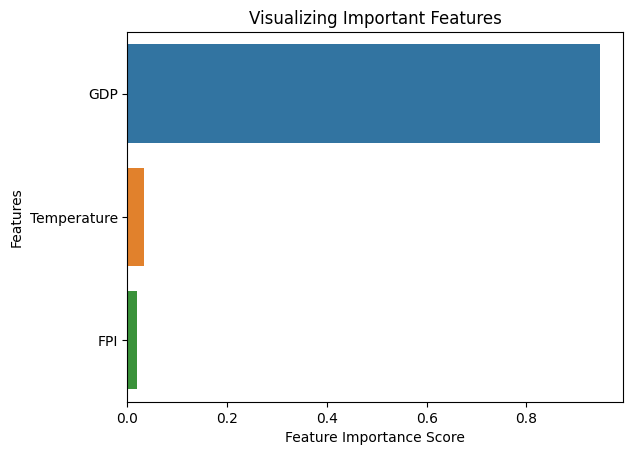

In [ ]:
feature_scoresDTR = pd.Series(rfr.feature_importances_, index=feat_tr.columns).sort_values(ascending=False)
feature_scoresDTR
# Creating a seaborn bar plot

sns.barplot(x=feature_scoresDTR, y=feature_scoresDTR.index)

# Add labels to the graph

plt.xlabel('Feature Importance Score')

plt.ylabel('Features')

# Add title to the graph

plt.title("Visualizing Important Features")
# Visualize the graph

plt.show()

the most important feature contributing to the Rsqr based on the previous model (GHG as dependent variable) is GDP

Running ten-fold cross validation to get a insight in the accuracy of the model

In [ ]:
#ten-fold cross validation
from sklearn.model_selection import cross_validate
cv_res = cross_validate(dtr, feat_tr, targ_tr, cv=10, return_estimator=True)
cv_res

{'fit_time': array([0.02199364, 0.01028776, 0.01633239, 0.00898004, 0.00887442,
        0.00853586, 0.0240407 , 0.0095706 , 0.0156374 , 0.00843215]),
 'score_time': array([0.00448155, 0.00369668, 0.00307918, 0.00244284, 0.0032866 ,
        0.00469494, 0.00361204, 0.00356865, 0.00277948, 0.00301671]),
 'estimator': [DecisionTreeRegressor(max_depth=7),
  DecisionTreeRegressor(max_depth=7),
  DecisionTreeRegressor(max_depth=7),
  DecisionTreeRegressor(max_depth=7),
  DecisionTreeRegressor(max_depth=7),
  DecisionTreeRegressor(max_depth=7),
  DecisionTreeRegressor(max_depth=7),
  DecisionTreeRegressor(max_depth=7),
  DecisionTreeRegressor(max_depth=7),
  DecisionTreeRegressor(max_depth=7)],
 'test_score': array([0.87485388, 0.83702161, 0.83775345, 0.8265581 , 0.87986271,
        0.87831853, 0.85783407, 0.86335222, 0.86199221, 0.85738996])}

Finding the most optimal number of leaf for the model

In [ ]:
#Finding the best number of the leaf for the decision tree model
from sklearn.model_selection import GridSearchCV
tuned_parameters= [{"min_samples_leaf":[1, 2, 5, 10, 20, 50, 100, 200, 500]}]
dtr_tune= DecisionTreeRegressor()
cv_tune= GridSearchCV(dtr_tune, tuned_parameters)
cv_tune.fit(feat_tr, targ_tr)
cv_tune.best_params_

{'min_samples_leaf': 50}

Considering the optimal number of leaf in the model and evaluating the accuracy

In [ ]:
#evaluating the accuracy of model after setting optimal number of leaf in the model
dtc_mod = DecisionTreeRegressor(min_samples_leaf=1)
dtc_mod.fit(feat_tr, targ_tr)
dtr.fit(feat_tr, targ_tr)

pred = dtr.predict(feat_tr)
accuracy = r2_score(targ_tr, pred)
print("Accuracy:", accuracy)

pred1 = dtr.predict(feat_te)
accuracy = r2_score(targ_te, pred1)
print("Accuracy:", accuracy)
mse = mean_squared_error(targ_te, pred1)
print("MSE: ", mse)
print("RMSE: ", mse**(1/2.0))

Accuracy: 0.9089065234274436
Accuracy: 0.8193787877315494
MSE:  0.176227245073735
RMSE:  0.4197942889960927


praparing dataset for cluster analysis and visualization by setting the "Country" as index and filling the NAs

In [ ]:
#preparing data for cluster analysis and visualization
#food = food.set_index("Country")
#ghg = ghg.set_index("Country")
#gdp = gdp.set_index("Country")
#temp = temp.set_index("Country")
food= food.dropna()
ghg = ghg.dropna()
gdp = gdp.dropna()
temp = temp.dropna()
yearghg= ghg.columns.values

In [ ]:
food

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,78.30,6.26,6.26,6.26,6.26,6.26,6.26,6.26,6.26,6.26,...,6.26,6.26,6.26,12.34,41.07,-13.35,-0.28,10.67,4.73,7.57
Albania,3.50,111.20,121.10,86.90,14.60,6.90,15.80,36.20,21.30,-0.10,...,-0.10,-0.50,1.00,2.99,5.23,4.91,4.81,4.75,2.34,4.24
Algeria,23.80,21.10,25.90,23.70,41.10,28.80,21.70,4.80,6.90,0.90,...,4.90,0.20,4.22,6.36,7.50,8.23,4.24,5.90,12.96,2.98
Angola,21.36,21.36,21.36,21.36,21.36,21.36,21.36,21.36,21.36,21.36,...,21.36,21.36,17.25,14.11,18.50,18.14,17.42,14.95,12.77,10.35
Armenia,4247.80,4247.80,4247.80,4247.80,4247.80,190.50,14.90,8.40,6.20,-5.60,...,10.00,0.80,4.10,6.70,11.10,-0.90,9.40,12.30,1.99,5.81
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Vanuatu,1.60,2.70,1.00,4.40,0.60,4.10,-1.10,0.70,3.30,1.40,...,3.40,-0.50,3.50,3.80,8.00,7.10,4.60,0.47,1.61,1.50
"Venezuela, RB",47.20,37.70,30.50,33.30,58.20,59.90,88.10,46.10,38.80,16.90,...,33.81,21.14,20.07,26.83,42.82,27.96,32.97,29.92,24.80,54.15
Vietnam,6.70,6.70,6.70,6.70,6.70,6.70,6.70,0.60,9.80,4.20,...,12.52,11.08,8.68,11.23,36.89,8.46,11.41,26.69,7.90,2.69


Graphing top ten countries in GHG dataset

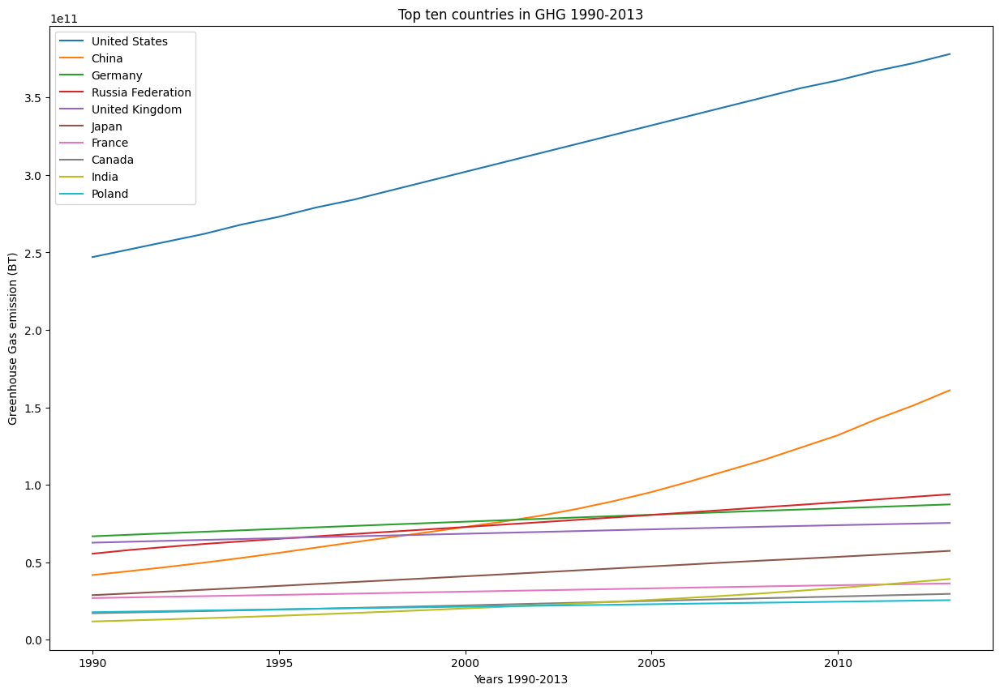

In [ ]:
#graphing top ten countries in GHG
ghg["Net Emissions"]=ghg.sum(axis=1)
sorted = ghg.sort_values(by='Net Emissions',ascending=False)
aa=sorted.iloc[0:10]
ghgten=aa.head(10)
ghgten = ghgten.drop("Net Emissions", axis='columns')
yearsghg1= ghgten.columns.values.astype(int)
fig, ax = plt.subplots(figsize=(15, 10))
ax.plot(yearsghg1, ghgten.iloc[0], label=ghgten.index[0])
ax.plot(yearsghg1, ghgten.iloc[1], label=ghgten.index[1])
ax.plot(yearsghg1, ghgten.iloc[2], label=ghgten.index[2])
ax.plot(yearsghg1, ghgten.iloc[3], label=ghgten.index[3])
ax.plot(yearsghg1, ghgten.iloc[4], label=ghgten.index[4])
ax.plot(yearsghg1, ghgten.iloc[5], label=ghgten.index[5])
ax.plot(yearsghg1, ghgten.iloc[6], label=ghgten.index[6])
ax.plot(yearsghg1, ghgten.iloc[7], label=ghgten.index[7])
ax.plot(yearsghg1, ghgten.iloc[8], label=ghgten.index[8])
ax.plot(yearsghg1, ghgten.iloc[9], label=ghgten.index[9])
ax.set_xlabel("Years 1990-2013")
ax.set_ylabel("Greenhouse Gas emission (BT)")
ax.set_title("Top ten countries in GHG 1990-2013")
ax.legend()
fig.show()

top ten countries in GHG shows that the most industrialized nations are contributing most to the global warming and US is so far, the most contributor in this case

In [ ]:
sorted.tail(10)

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,Net Emissions
Country,,,,,,,,,,,,,,,,,,,,,
Cabo Verde,2322135.0,2421063.0,2527319.0,2637239.0,2750823.0,2871735.0,3014631.0,3161191.0,3318743.0,3501943.0,...,5304631.0,5777287.0,6282919.0,6751911.0,7275863.0,7832791.0,8448343.0,8953975.0,9452279.0,115905112.0
Bhutan,747456.0,923575.0,1128952.0,1301980.0,1503588.0,1739729.0,2025040.0,2401878.0,2769041.0,3139802.0,...,5321940.0,5694946.0,6066973.0,6467797.0,6835598.0,7299755.0,7967219.0,8721026.0,9574170.0,102931823.0
Samoa,2114128.0,2220384.0,2330304.0,2440224.0,2553808.0,2671056.0,2795632.0,2923872.0,3055776.0,3191344.0,...,4092688.0,4257568.0,4429776.0,4609312.0,4796176.0,4983040.0,5184560.0,5382416.0,5580272.0,87767456.0
Grenada,1663456.0,1773376.0,1890624.0,2011536.0,2154432.0,2304656.0,2458544.0,2627088.0,2802960.0,2997152.0,...,4224592.0,4455424.0,4693584.0,4946400.0,5199216.0,5459360.0,5712176.0,5983312.0,6287424.0,87613568.0
Vanuatu,1696432.0,1762384.0,1824672.0,1886960.0,1949248.0,2015200.0,2099472.0,2183744.0,2264352.0,2348624.0,...,2806624.0,2854256.0,2953184.0,3048448.0,3169360.0,3290272.0,3422176.0,3535760.0,3642016.0,61749392.0
Tonga,1066224.0,1161488.0,1231104.0,1315376.0,1406976.0,1502240.0,1579184.0,1678112.0,1766048.0,1875968.0,...,2502512.0,2630752.0,2744336.0,2865248.0,2997152.0,3114400.0,3216992.0,3323248.0,3436832.0,52274288.0
Comoros,1007600.0,1073552.0,1139504.0,1209120.0,1278736.0,1352016.0,1428960.0,1509568.0,1597504.0,1689104.0,...,2410912.0,2572128.0,2674720.0,2780976.0,2912880.0,3074096.0,3209664.0,3352560.0,3528432.0,49885360.0
British Virgin Islands,875696.0,941648.0,1011264.0,1084544.0,1165152.0,1249424.0,1344688.0,1443616.0,1546208.0,1648800.0,...,2348624.0,2491520.0,2641744.0,2802960.0,2967840.0,3140048.0,3315920.0,3491792.0,3667664.0,49068288.0
Dominica,989280.0,1047904.0,1106528.0,1168816.0,1234768.0,1315376.0,1388656.0,1469264.0,1546208.0,1626816.0,...,2290000.0,2403584.0,2557472.0,2689376.0,2821280.0,2960512.0,3088752.0,3224320.0,3356224.0,48027712.0


Graphing top ten countries FPI

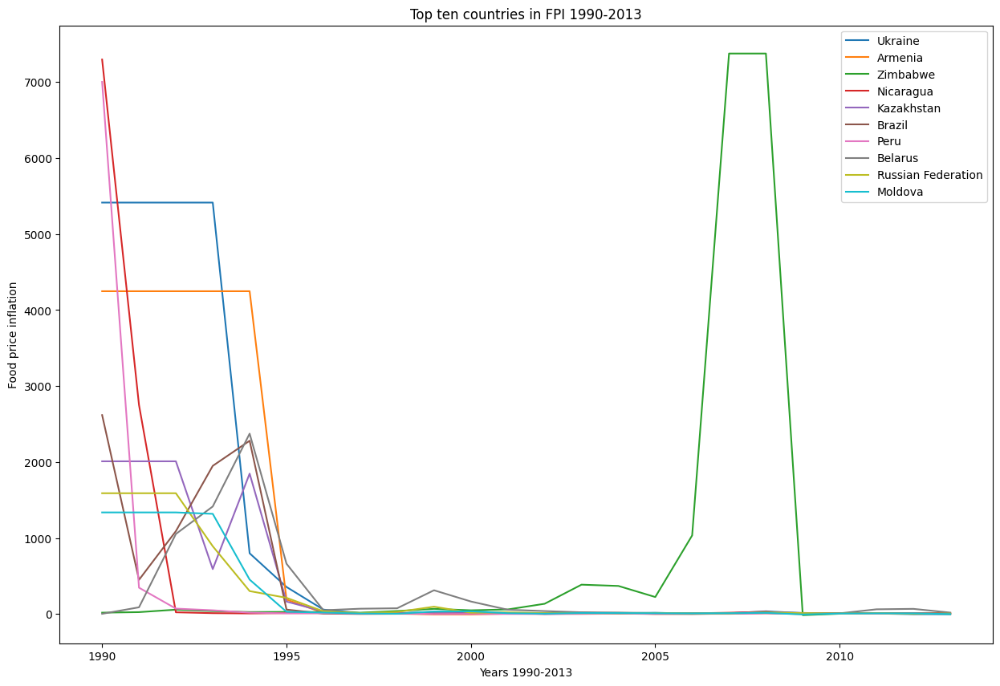

In [ ]:
#graphing top ten countries in Food price Inflation
food["Net Food Inflation"]=food.mean(axis=1)
sorted1 = food.sort_values(by='Net Food Inflation',ascending=False)
aa2=sorted1.iloc[0:10]
foodten = aa2.head(10)
foodten = foodten.drop("Net Food Inflation", axis='columns')
yearsfood1= foodten.columns.values.astype(int)
fig, ax = plt.subplots(figsize=(15, 10))
ax.plot(yearsfood1, foodten.iloc[0], label=foodten.index[0])
ax.plot(yearsfood1, foodten.iloc[1], label=foodten.index[1])
ax.plot(yearsfood1, foodten.iloc[2], label=foodten.index[2])
ax.plot(yearsfood1, foodten.iloc[3], label=foodten.index[3])
ax.plot(yearsfood1, foodten.iloc[4], label=foodten.index[4])
ax.plot(yearsfood1, foodten.iloc[5], label=foodten.index[5])
ax.plot(yearsfood1, foodten.iloc[6], label=foodten.index[6])
ax.plot(yearsfood1, foodten.iloc[7], label=foodten.index[7])
ax.plot(yearsfood1, foodten.iloc[8], label=foodten.index[8])
ax.plot(yearsfood1, foodten.iloc[9], label=foodten.index[9])
ax.set_xlabel("Years 1990-2013")
ax.set_ylabel("Food price inflation")
ax.set_title("Top ten countries in FPI 1990-2013")
ax.legend()
fig.show()

Price food inflation graph represents the top ten countries having highest food inflation and suffering from lack of appropriate economy.

Gparhing top ten countries for global temperature change in temperature dataset

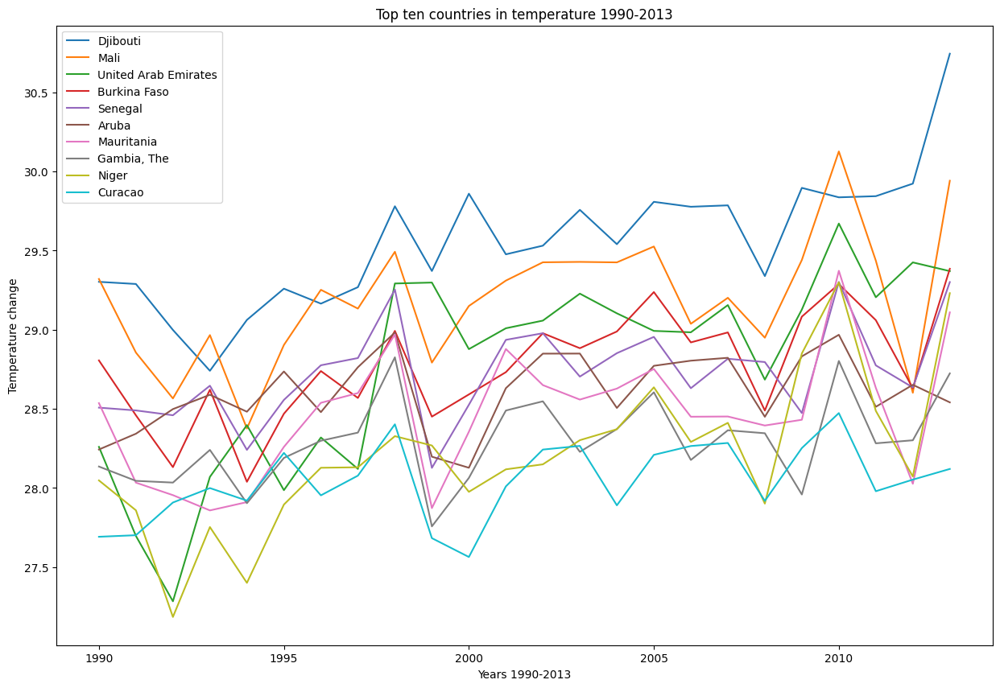

In [ ]:
#graphing top ten countries in temperature change
temp["Net temperature"]=temp.mean(axis=1)
sorted2 = temp.sort_values(by='Net temperature',ascending=False)
aa3=sorted2.iloc[0:10]
tempten = aa3.head(10)
tempten = tempten.drop("Net temperature", axis='columns')
yearstemp1= tempten.columns.values.astype(int)
fig, ax = plt.subplots(figsize=(15, 10))
ax.plot(yearstemp1, tempten.iloc[0], label=tempten.index[0])
ax.plot(yearstemp1, tempten.iloc[1], label=tempten.index[1])
ax.plot(yearstemp1, tempten.iloc[2], label=tempten.index[2])
ax.plot(yearstemp1, tempten.iloc[3], label=tempten.index[3])
ax.plot(yearstemp1, tempten.iloc[4], label=tempten.index[4])
ax.plot(yearstemp1, tempten.iloc[5], label=tempten.index[5])
ax.plot(yearstemp1, tempten.iloc[6], label=tempten.index[6])
ax.plot(yearstemp1, tempten.iloc[7], label=tempten.index[7])
ax.plot(yearstemp1, tempten.iloc[8], label=tempten.index[8])
ax.plot(yearstemp1, tempten.iloc[9], label=tempten.index[9])
ax.set_xlabel("Years 1990-2013")
ax.set_ylabel("Temperature change")
ax.set_title("Top ten countries in temperature 1990-2013")
ax.legend()
fig.show()

The temperature graph also shows the third world countries are suffering most from global warming consequences and climate change.

Graphing top ten countries for GDP dataset

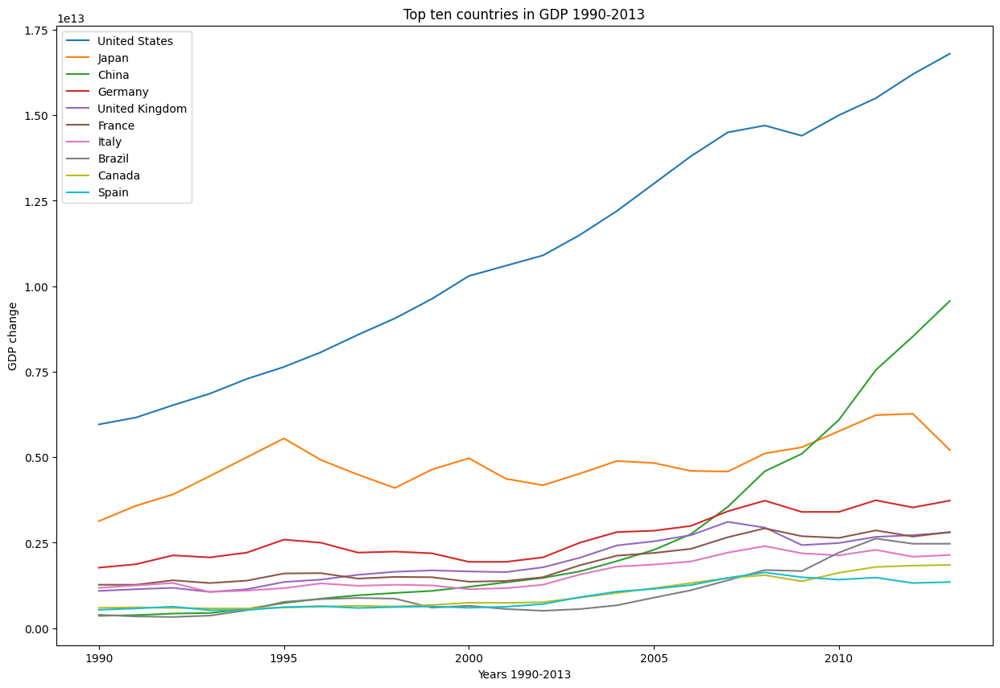

In [ ]:
#graphing top ten countries in GDP
gdp["Net gdp"]=gdp.mean(axis=1)
sorted3 = gdp.sort_values(by='Net gdp',ascending=False)
aa4=sorted3.iloc[0:10]
gdpten = aa4.head(10)
gdpten = gdpten.drop("Net gdp", axis='columns')
yearsgdp1= gdpten.columns.values.astype(int)
fig, ax = plt.subplots(figsize=(15, 10))
ax.plot(yearsgdp1, gdpten.iloc[0], label=gdpten.index[0])
ax.plot(yearsgdp1, gdpten.iloc[1], label=gdpten.index[1])
ax.plot(yearsgdp1, gdpten.iloc[2], label=gdpten.index[2])
ax.plot(yearsgdp1, gdpten.iloc[3], label=gdpten.index[3])
ax.plot(yearsgdp1, gdpten.iloc[4], label=gdpten.index[4])
ax.plot(yearsgdp1, gdpten.iloc[5], label=gdpten.index[5])
ax.plot(yearsgdp1, gdpten.iloc[6], label=gdpten.index[6])
ax.plot(yearsgdp1, gdpten.iloc[7], label=gdpten.index[7])
ax.plot(yearsgdp1, gdpten.iloc[8], label=gdpten.index[8])
ax.plot(yearsgdp1, gdpten.iloc[9], label=gdpten.index[9])
ax.set_xlabel("Years 1990-2013")
ax.set_ylabel("GDP change")
ax.set_title("Top ten countries in GDP 1990-2013")
ax.legend()
fig.show()

In [ ]:
sorted3.tail(10)

,1990,1991,1992,1993,1994,1995,1996,1997,1998,1999,...,2005,2006,2007,2008,2009,2010,2011,2012,2013,Net gdp
Country,,,,,,,,,,,,,,,,,,,,,
Bhutan,2.876582e+08,2.403200e+08,2.402158e+08,2.259981e+08,2.589856e+08,2.904648e+08,3.034355e+08,3.522610e+08,3.634528e+08,3.992688e+08,...,796938120.2,8.749899e+08,1.168309e+09,1.227809e+09,1.234014e+09,1.547991e+09,1.777101e+09,1.781281e+09,1.756216e+09,7.425014e+08
Seychelles,3.685848e+08,3.743596e+08,4.336672e+08,4.739168e+08,4.864512e+08,5.082215e+08,5.030685e+08,5.629588e+08,6.083693e+08,6.229855e+08,...,919103254.5,1.016418e+09,1.033562e+09,9.671996e+08,8.473979e+08,9.699365e+08,1.065827e+09,1.060226e+09,1.328158e+09,7.345873e+08
Comoros,4.296221e+08,4.241088e+08,4.573886e+08,4.528814e+08,3.191892e+08,3.984618e+08,3.960538e+08,3.644456e+08,3.701068e+08,3.824550e+08,...,653845122.9,6.984318e+08,7.956731e+08,9.156592e+08,9.053411e+08,9.079787e+08,1.023086e+09,1.015843e+09,1.116224e+09,5.984584e+08
Grenada,2.780988e+08,3.007579e+08,3.101604e+08,3.098122e+08,3.251118e+08,3.421725e+08,3.669114e+08,3.921906e+08,4.459036e+08,4.820094e+08,...,695555555.6,6.987007e+08,7.586836e+08,8.259760e+08,7.712756e+08,7.710133e+08,7.786559e+08,7.998823e+08,8.426201e+08,5.527689e+08
Guinea-Bissau,2.439620e+08,2.571504e+08,2.263134e+08,2.368808e+08,2.356200e+08,2.539669e+08,2.704198e+08,2.685510e+08,2.064575e+08,2.244467e+08,...,587029054.4,5.923657e+08,6.969108e+08,8.681547e+08,8.301265e+08,8.498784e+08,1.099819e+09,9.892712e+08,1.046087e+09,5.072690e+08
Samoa,1.257663e+08,1.255972e+08,1.323030e+08,1.331229e+08,2.210981e+08,2.248657e+08,2.499090e+08,2.854756e+08,2.694815e+08,2.588338e+08,...,465568018.3,5.058324e+08,5.704692e+08,6.192607e+08,5.847060e+08,6.631560e+08,7.371480e+08,7.603193e+08,7.700596e+08,3.871799e+08
Vanuatu,1.688792e+08,2.013342e+08,2.090888e+08,2.004919e+08,2.337013e+08,2.493333e+08,2.613700e+08,2.727712e+08,2.622934e+08,2.680070e+08,...,394962552.3,4.393768e+08,5.163929e+08,5.907482e+08,5.926225e+08,6.707132e+08,7.701533e+08,7.478397e+08,7.583045e+08,3.866829e+08
Dominica,2.014296e+08,2.197630e+08,2.340593e+08,2.455259e+08,2.643741e+08,2.745222e+08,2.922852e+08,3.029889e+08,3.224111e+08,3.317593e+08,...,364255555.6,3.902519e+08,4.213741e+08,4.581889e+08,4.890741e+08,4.938259e+08,5.010259e+08,4.859963e+08,4.982963e+08,3.545329e+08
Tonga,1.135638e+08,1.322011e+08,1.370663e+08,1.384899e+08,1.959910e+08,2.088717e+08,2.221006e+08,2.149915e+08,1.915049e+08,1.992146e+08,...,261797606.1,2.922321e+08,2.985140e+08,3.444286e+08,3.123774e+08,3.668400e+08,4.145234e+08,4.707141e+08,4.506436e+08,2.486542e+08


GDP and GHG seems sharing similar patterns and indicates industrialized countries that contribute to the global warming are getting benefit of having strong economy. The first conclusion is that the industrialized countries produce more and this will requires more energy consumption that consequently contribute to the global warming but they will not suffer from consequence of that since more pressure will be on undeveloped countries

Graph cumulative GHG for all countries

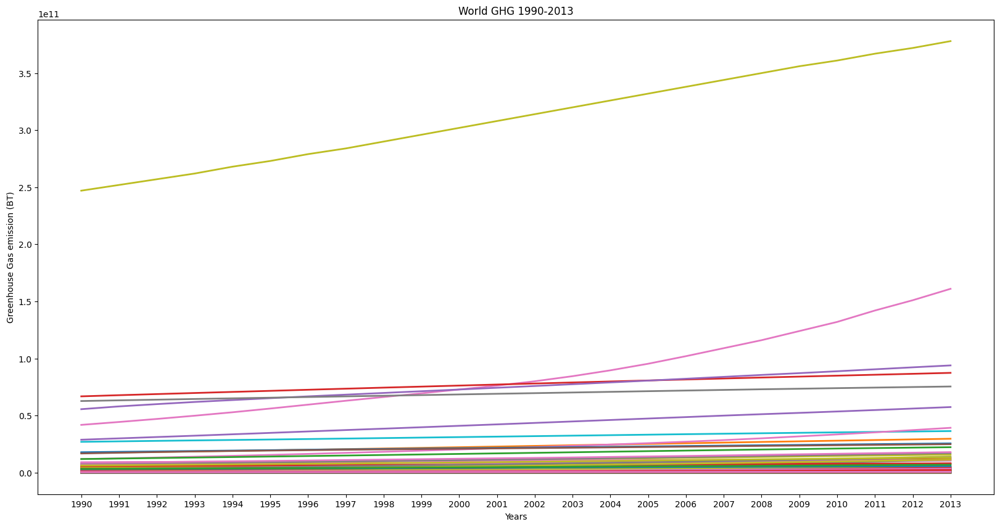

In [ ]:
#graphing cumulative for GHG
ghg = ghg.drop("Net Emissions", axis='columns')
food = food.drop("Net Food Inflation", axis='columns')
temp = temp.drop("Net temperature", axis='columns')
gdp = gdp.drop("Net gdp", axis='columns')
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(yearghg, ghg.T, lw=2)
ax.set_title("World GHG 1990-2013")
ax.set_xlabel("Years")
ax.set_ylabel("Greenhouse Gas emission (BT)")
fig.show()

Graph cumulative FPI for all countries in the dataset

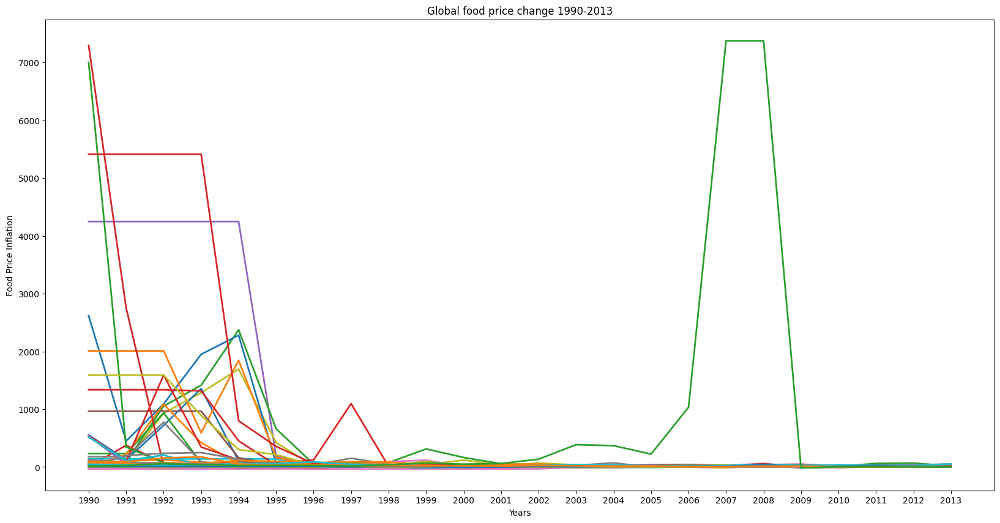

In [ ]:
#graphing cumulative for FPI
yearfood = food.columns.values
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(yearfood, food.T, lw=2)
ax.set_title("Global food price change 1990-2013")
ax.set_xlabel("Years")
ax.set_ylabel("Food Price Inflation")
fig.show()

cumulative temperature for all countries in the dataset

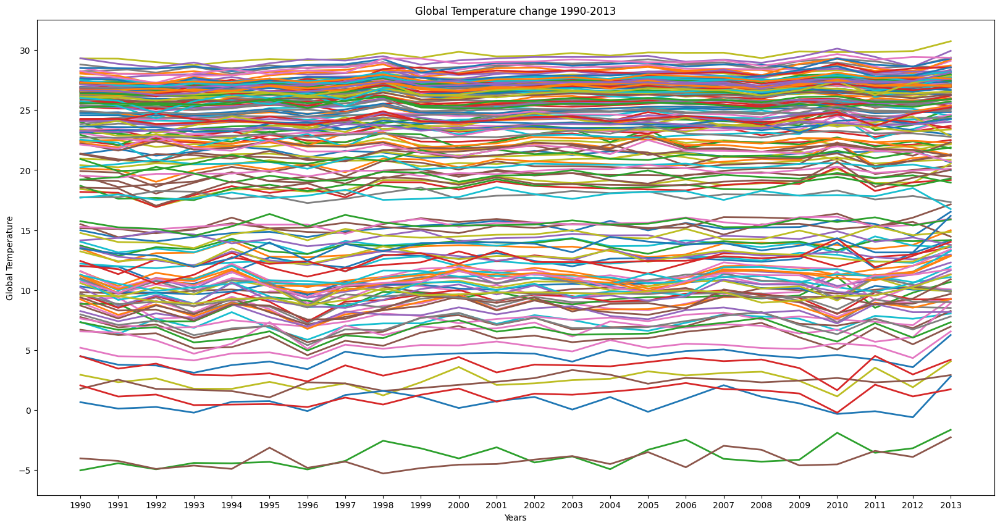

In [ ]:
#graphing cumulative for temperature
yeartemp = temp.columns.values
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(yeartemp, temp.T, lw=2)
ax.set_title("Global Temperature change 1990-2013")
ax.set_xlabel("Years")
ax.set_ylabel("Global Temperature")
fig.show()

Graph cumulative GDP for all countries  in the dataset

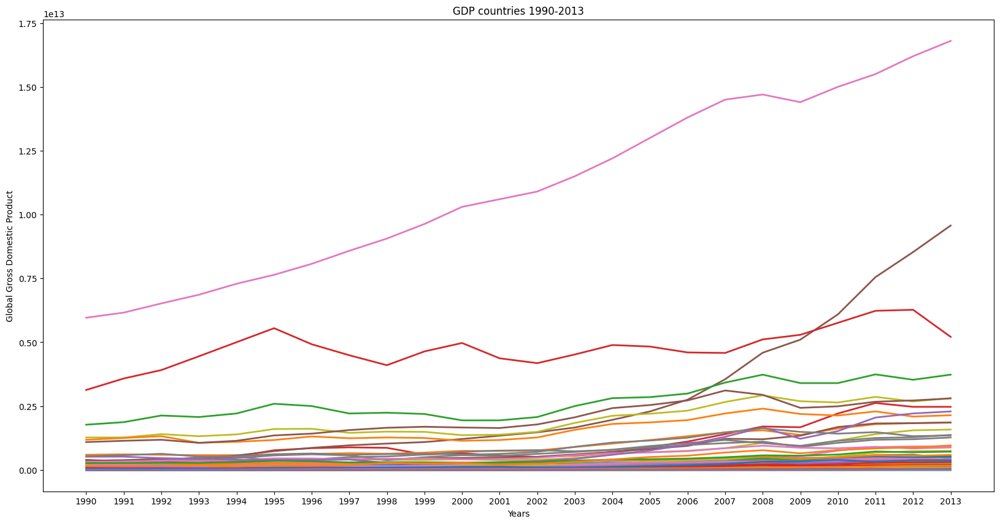

In [ ]:
#graphing cumulative for GDP
yeargdp = gdp.columns.values
fig, ax = plt.subplots(figsize=(20, 10))
ax.plot(yeargdp, gdp.T, lw=2)
ax.set_title("GDP countries 1990-2013")
ax.set_xlabel("Years")
ax.set_ylabel("Global Gross Domestic Product")
fig.show()

Graphing the unstandardized heatmap of GHG

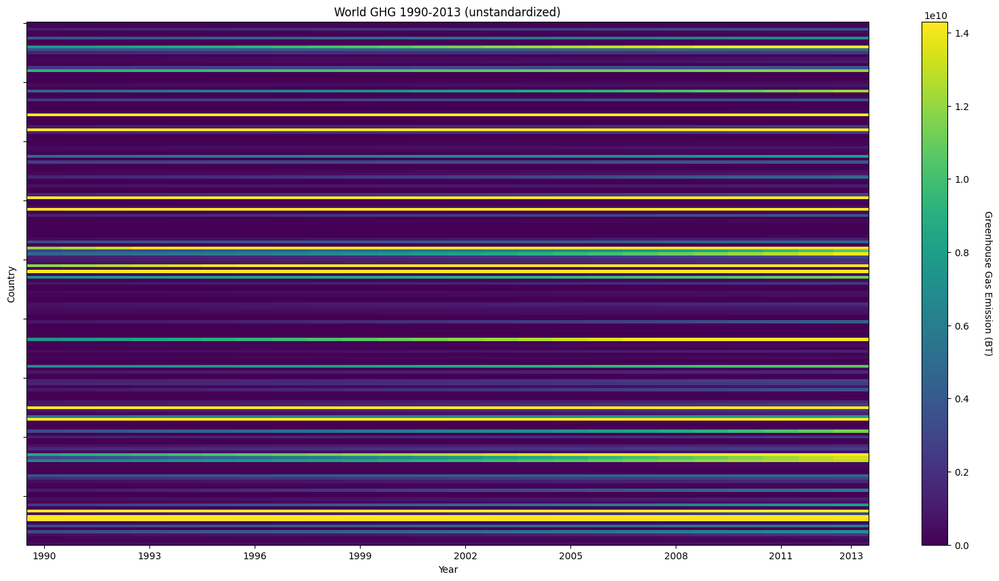

In [ ]:
#heatmap unstandardized graph for GHG
fig, ax = plt.subplots(figsize=(20, 10))
im = ax.imshow(ghg, aspect="auto", interpolation="nearest", cmap="viridis", vmin=0, vmax=14300000000)
xt = np.array([0, 3, 6, 9, 12, 15, 18, 21, 23])
ax.set_xticks(xt)
ax.set_xticklabels(yearghg[xt])
ax.set_yticklabels("")
ax.set_title("World GHG 1990-2013 (unstandardized)")
ax.set_xlabel("Year")
ax.set_ylabel("Country")
cbar = fig.colorbar(im)
cbar.ax.set_ylabel("Greenhouse Gas Emission (BT)", rotation=270)
cbar.ax.get_yaxis().labelpad = 25
fig.show()

Graphing the unstandardized heatmap of FPI

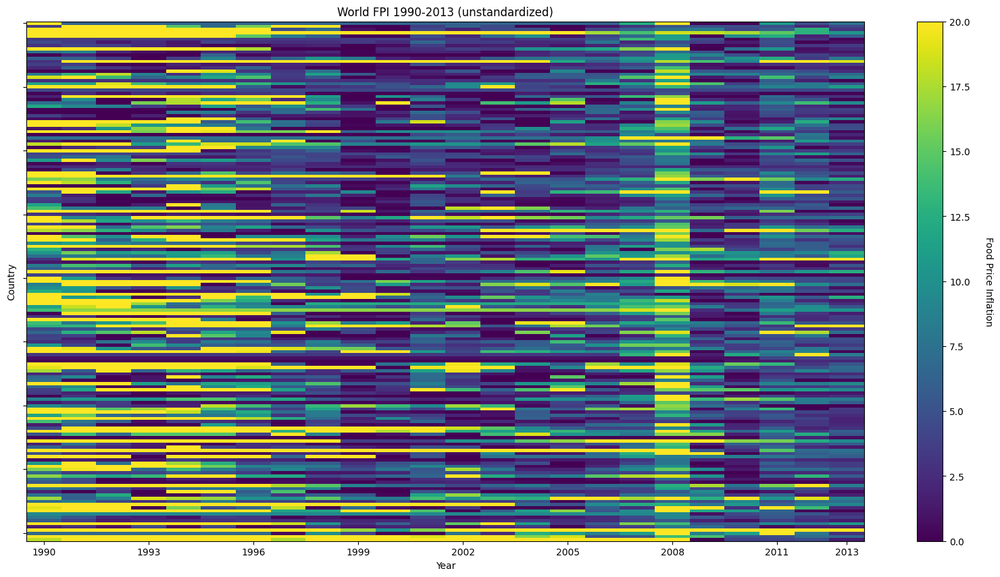

In [ ]:
#heatmap unstandardized graph for FPI
yearfood= food.columns.values
fig, ax = plt.subplots(figsize=(20, 10))
im1 = ax.imshow(food, aspect="auto", interpolation="nearest", vmin=0, vmax=20)
xt1 = np.array([0, 3, 6, 9, 12, 15, 18, 21, 23])
ax.set_xticks(xt1)
ax.set_xticklabels(yearghg[xt1])
ax.set_yticklabels("")
ax.set_title("World FPI 1990-2013 (unstandardized)")
ax.set_xlabel("Year")
ax.set_ylabel("Country")
cbar = fig.colorbar(im1)
cbar.ax.set_ylabel("Food Price Inflation", rotation=270)
cbar.ax.get_yaxis().labelpad = 25
fig.show()

Pattern shows a lots of variability in the food price dataset for each country

Standardizing the FPI and GHG dataset for new heatmap

In [ ]:
#standardizing the datasets for FPI and GHG
food_st = food.sub(food.mean(axis=1), axis=0).div(food.std(axis=1), axis=0)
ghg_st = ghg.sub(ghg.mean(axis=1), axis=0).div(ghg.std(axis=1), axis=0)
food_st.replace([np.inf, -np.inf], np.nan, inplace=True)
food_st = food_st.dropna()

Graph standardized heatmap for FPI

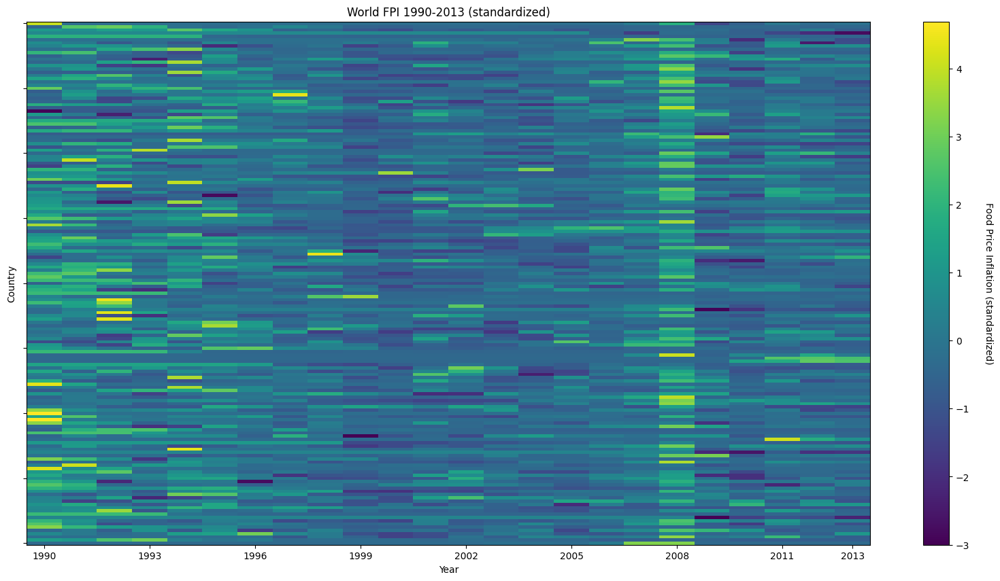

In [ ]:
#heatmap for FPI dataset after standardization
fig, ax = plt.subplots(figsize=(20, 10))
im1 = ax.imshow(food_st, aspect="auto", interpolation="nearest")
xt1 = np.array([0, 3, 6, 9, 12, 15, 18, 21, 23])
ax.set_xticks(xt1)
ax.set_xticklabels(yearfood[xt1])
ax.set_yticklabels("")
ax.set_xlabel("Year")
ax.set_ylabel("Country")
ax.set_title("World FPI 1990-2013 (standardized)")
cbar = fig.colorbar(im1)
cbar.ax.set_ylabel("Food Price Inflation (standardized)", rotation=270)
cbar.ax.get_yaxis().labelpad = 25
fig.show()

Graph standardized hetmap for GHG

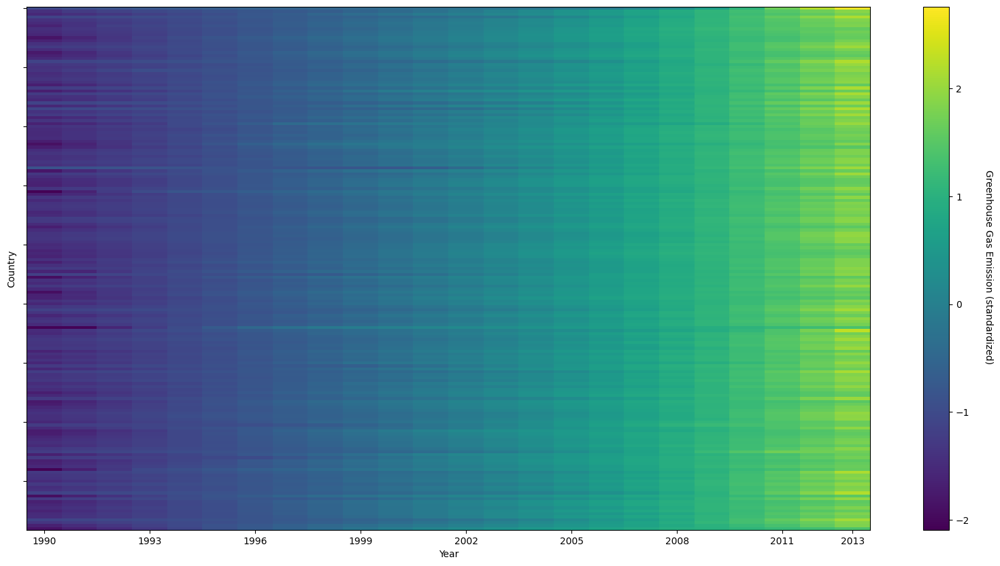

In [ ]:
#heatmap for GHG dataset after standardization
fig, ax = plt.subplots(figsize=(20, 10))
im = ax.imshow(ghg_st, aspect="auto", interpolation="nearest", cmap="viridis")
xt = np.array([0, 3, 6, 9, 12, 15, 18, 21, 23])
ax.set_xticks(xt)
ax.set_xticklabels(yearghg[xt])
ax.set_yticklabels("")
ax.set_xlabel("Year")
ax.set_ylabel("Country")
cbar = fig.colorbar(im)
cbar.ax.set_ylabel("Greenhouse Gas Emission (standardized) ", rotation=270)
cbar.ax.get_yaxis().labelpad = 25
fig.show()

Running K-mean clustering with 4 clusters for GHG and FPI

In [ ]:
#conducting K-mean clustering
featfood=food_st
featghg=ghg_st
from sklearn.cluster import KMeans
kmfood=KMeans(n_clusters=4)
kmfood.fit(featfood)
kmghg=KMeans(n_clusters=3)
kmghg.fit(featghg)

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



KMeans(n_clusters=3)

Visualazing the FPI and GHG clusters

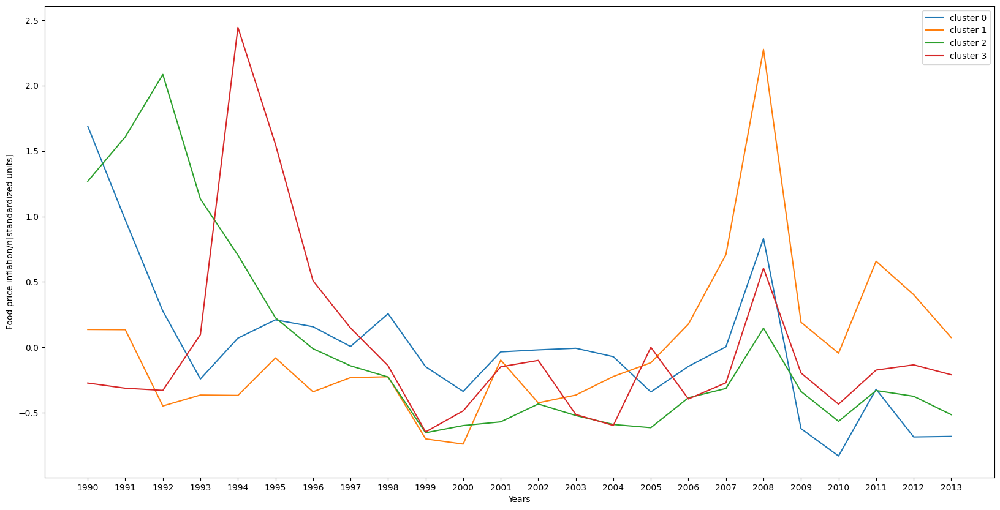

In [ ]:
#visualizing four clusters for FPI
fig, ax = plt.subplots(figsize=(20, 10))
linsfood= ax.plot(yearfood, kmfood.cluster_centers_.T)
ax.set_xlabel("Years")
ax.set_ylabel("Food price inflation/n[standardized units]")
ax.legend(linsfood, ["cluster 0", "cluster 1", "cluster 2", "cluster 3"])
fig.show()

Based on the data four distinct cluster has been determined with different patterns, most of the countries were suffering of food inflation befor 2000 but this pattern have been changed for all countries after 2000 except in 2008 which was the world financial and economic crisis.

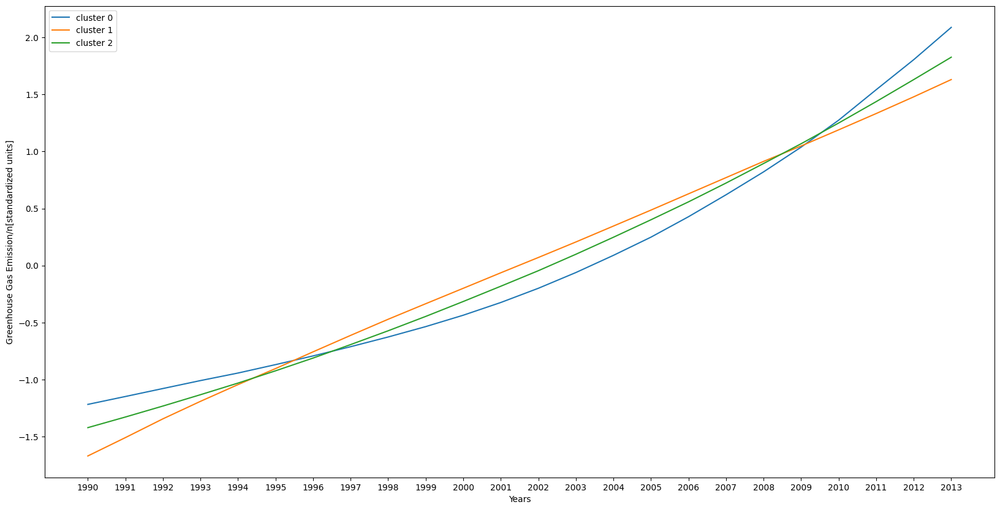

In [ ]:
#visualizing four clusters for GHG
fig, ax = plt.subplots(figsize=(20, 10))
linsghg= ax.plot(yearghg, kmghg.cluster_centers_.T)
ax.set_xlabel("Years")
ax.set_ylabel("Greenhouse Gas Emission/n[standardized units]")
ax.legend(linsghg, ["cluster 0", "cluster 1", "cluster 2", "cluster 3"])
fig.show()

GHG shows pretty similar upward pattern for all countries and some countries with more contribution and higher slope in the graph such as China, Russia and some middle east countries

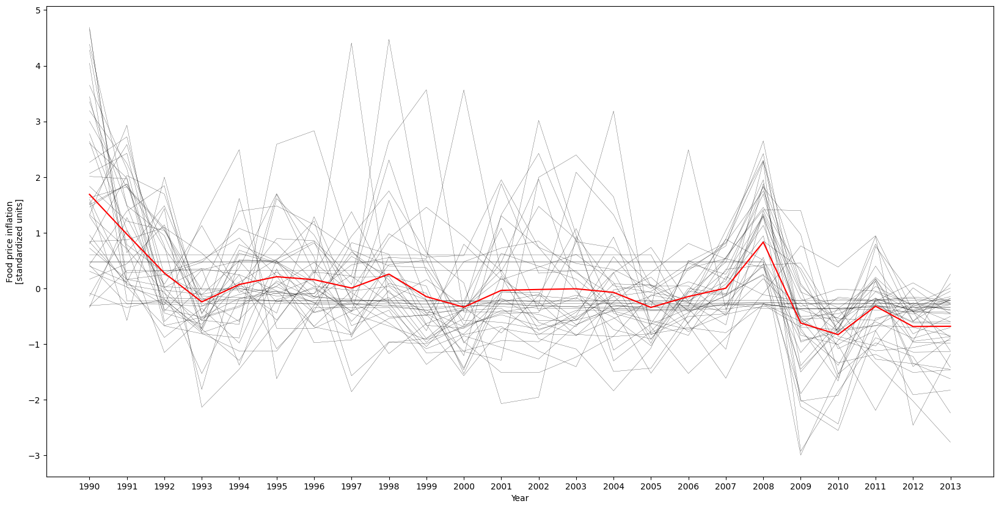

member countries  ['Afghanistan' 'Angola' 'Australia' 'Bahamas, The' 'Bolivia' 'Bulgaria'
 'Cabo Verde' 'Costa Rica' 'Cyprus' 'Dominican Republic' 'Ecuador'
 'El Salvador' 'Gambia, The' 'Guatemala' 'Haiti' 'Honduras' 'Indonesia'
 'Ireland' 'Italy' 'Japan' 'Jordan' 'Korea, Rep.' 'Lao PDR' 'Liberia'
 'Malaysia' 'Mexico' 'Myanmar' 'Namibia' 'Nicaragua' 'Norway'
 'Papua New Guinea' 'Paraguay' 'Peru' 'Philippines' 'Poland' 'Portugal'
 'Serbia' 'Sierra Leone' 'Slovenia' 'Spain' 'Switzerland' 'Tonga'
 'United Arab Emirates' 'United States']





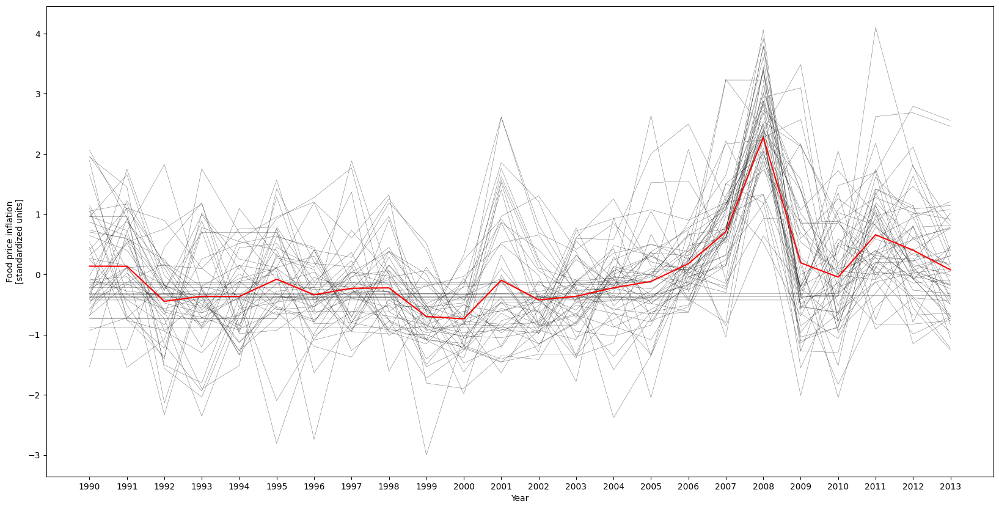

member countries  ['Aruba' 'Austria' 'Bahrain' 'Bangladesh' 'Belgium' 'Belize'
 'Bosnia and Herzegovina' 'Brunei Darussalam' 'Cambodia' 'Canada'
 'Comoros' 'Congo, Dem. Rep.' 'Curacao' 'Denmark' 'Dominica'
 'Egypt, Arab Rep.' 'Ethiopia' 'Fiji' 'Finland' 'France' 'Germany'
 'Grenada' 'Guinea' 'Guinea-Bissau' 'Iceland' 'Kuwait' 'Luxembourg'
 'Maldives' 'Malta' 'Mauritania' 'Mauritius' 'Mongolia' 'Montenegro'
 'Morocco' 'Netherlands' 'New Zealand' 'Oman' 'Pakistan' 'Panama' 'Qatar'
 'Rwanda' 'Samoa' 'Saudi Arabia' 'Seychelles' 'Singapore' 'Sweden'
 'Thailand' 'Trinidad and Tobago' 'Tunisia' 'United Kingdom' 'Vanuatu'
 'Vietnam' 'Zimbabwe']





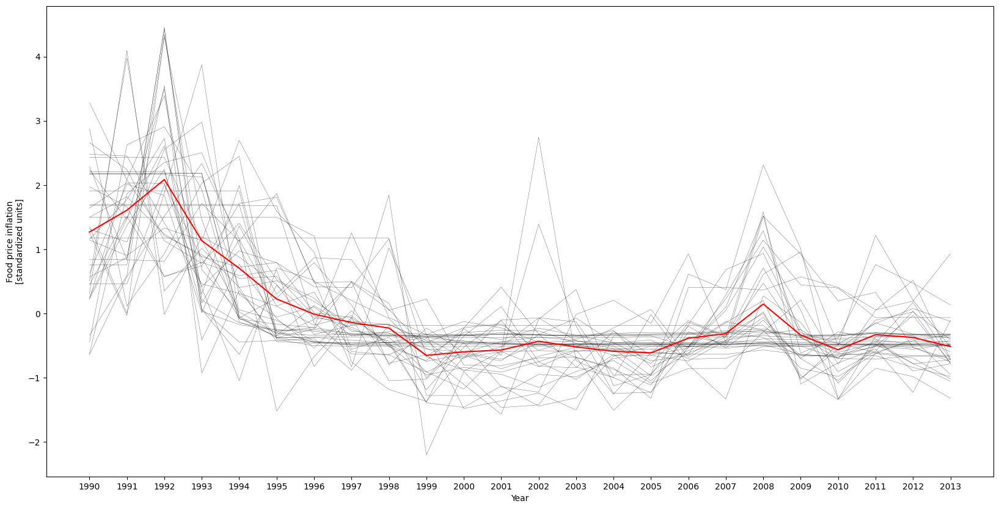

member countries  ['Albania' 'Algeria' 'Armenia' 'Bhutan' 'Botswana' 'Brazil' 'Chad' 'Chile'
 'Colombia' 'Croatia' 'Czech Republic' 'Estonia' 'Georgia' 'Greece'
 'Hong Kong SAR' 'Hungary' 'India' 'Israel' 'Jamaica' 'Kazakhstan' 'Kenya'
 'Kyrgyz Republic' 'Latvia' 'Lebanon' 'Lesotho' 'Lithuania'
 'Macedonia, FYR' 'Moldova' 'Mozambique' 'Romania' 'Russian Federation'
 'São Tomé and Principe' 'Slovak Republic' 'South Africa' 'Tanzania'
 'Uganda' 'Ukraine' 'Uruguay' 'Zambia']





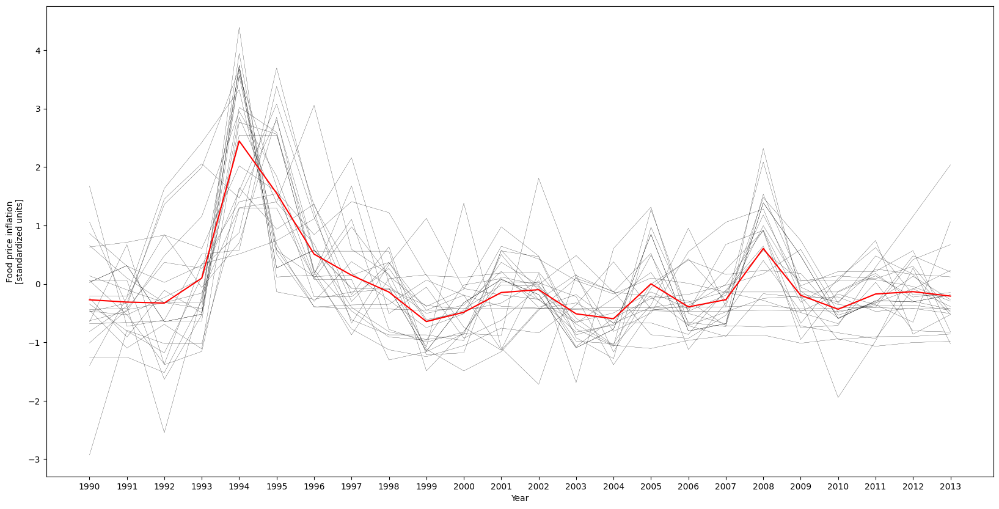

member countries  ['Azerbaijan' 'Belarus' 'Benin' 'Burkina Faso' 'Burundi' 'Cameroon'
 'Central African Republic' 'China' 'Congo, Rep.' "Côte d'Ivoire"
 'Equatorial Guinea' 'Gabon' 'Ghana' 'Iran, Islamic Rep.' 'Madagascar'
 'Malawi' 'Mali' 'New Caledonia' 'Niger' 'Nigeria' 'Senegal' 'Swaziland'
 'Togo' 'Turkey' 'Venezuela, RB']





In [ ]:
plt.pause(0.01) # "refresh" the screen
print("\n\n")

#plot each cluster individually and its members
for cnum in range(kmfood.n_clusters):

  #True/False index of where label_ is cnum
  indfood = kmfood.labels_ == cnum

  #Get the members of that cluster number
  memsfood = food_st[indfood]

  #make a plot
  fig, ax = plt.subplots(figsize=[20, 10])
  ax.plot(yearfood, memsfood.T, lw=0.2, color="k")
  ax.plot(yearfood, kmfood.cluster_centers_[cnum], color="r")
  ax.set_xlabel("Year")
  ax.set_ylabel("Food price inflation\n[standardized units]")
  fig.show()

  #refresh screen
  plt.pause(0.01)

  #print member countries and extra space
  print("member countries ", food_st.index[indfood].values)
  print("\n\n")

In [ ]:
food_st_new= food_st.reset_index()
food_st_new['cluster']=kmfood.labels_
food_st_new['cluster']=food_st_new['cluster'].astype(str)
fig_cluster = px.choropleth(food_st_new, locations="Country", locationmode = "country names", color="cluster",
                    color_continuous_scale=px.colors.diverging.BrBG,labels={'Average FPI'},
                    title="Categorizing countries Based on Food Price inflation 1990-2013")
fig_cluster.show()

Based on the graph countries in the cluster 3 are suffering from food inflation even after 2000 which most countries were expriencing some level of economic stability. these countries such as china, Iran and west african countries such as Nigeria, Mali, Algeria, one country in europe Ukraine are in similar cluster experincing the food inflation.

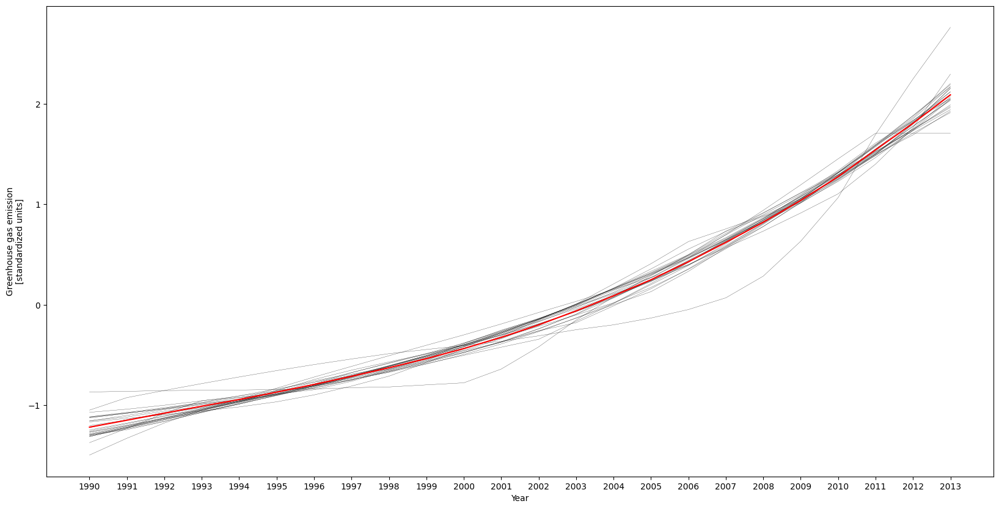

member countries  ['Afghanistan' 'Angola' 'Bangladesh' 'Benin' 'Bosnia and Herzegovina'
 'Burkina Faso' 'Cambodia' 'Cabo Verde' 'Chad' 'China' 'Equatorial Guinea'
 'Ethiopia' 'Lao PDR' 'Liberia' 'Maldives' 'Mongolia' 'Mozambique' 'Oman'
 'Papua New Guinea' 'Qatar' 'Sudan' 'Tanzania' 'Trinidad and Tobago'
 'Uganda' 'United Arab Emirates' 'Vietnam']





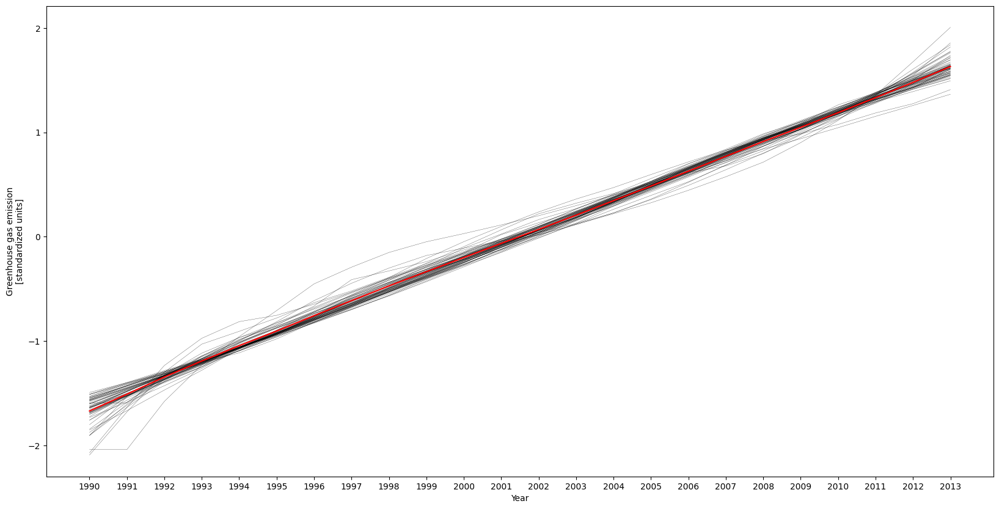

member countries  ['Austria' 'Azerbaijan' 'Bahamas, The' 'Belarus' 'Belgium' 'Bulgaria'
 'Burundi' 'Canada' 'Central African Republic' 'Colombia' 'Congo, Rep.'
 "Côte d'Ivoire" 'Czech Republic' 'Congo, Dem. Rep.' 'Denmark' 'Estonia'
 'Finland' 'France' 'Gabon' 'Georgia' 'Germany' 'Greece' 'Guyana'
 'Hungary' 'Ireland' 'Italy' 'Jamaica' 'Japan' 'Kyrgyz Republic' 'Latvia'
 'Libya' 'Lithuania' 'Luxembourg' 'Macedonia, FYR' 'Malawi' 'Malta'
 'Moldova' 'Netherlands' 'Norway' 'Poland' 'Portugal' 'Romania'
 'Russia Federation' 'Rwanda' 'Serbia' 'Singapore' 'Slovak Republic'
 'Slovenia' 'Spain' 'Suriname' 'Sweden' 'Switzerland' 'Tajikistan'
 'Ukraine' 'United Kingdom' 'United States' 'Uzbekistan' 'Zambia'
 'Zimbabwe']





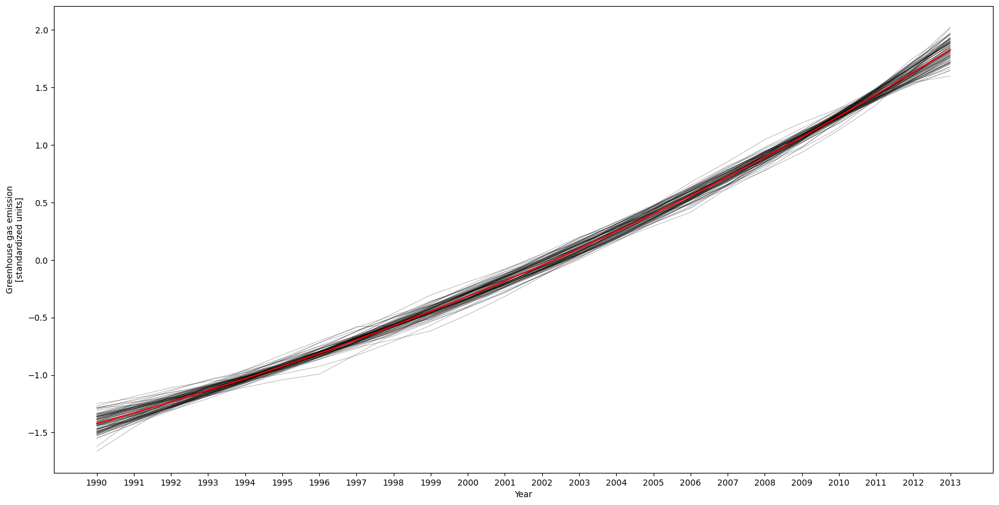

member countries  ['Albania' 'Algeria' 'Antigua and Barbuda' 'Argentina' 'Armenia' 'Aruba'
 'Australia' 'Bahrain' 'Barbados' 'Belize' 'Bhutan' 'Bolivia' 'Botswana'
 'Brazil' 'British Virgin Islands' 'Brunei Darussalam' 'Cameroon' 'Chile'
 'Comoros' 'Costa Rica' 'Croatia' 'Curacao' 'Cyprus' 'Djibouti' 'Dominica'
 'Dominican Republic' 'Ecuador' 'Egypt, Arab Rep.' 'El Salvador' 'Fiji'
 'Gambia, The' 'Ghana' 'Grenada' 'Guatemala' 'Guinea' 'Guinea-Bissau'
 'Haiti' 'Honduras' 'Hong Kong SAR' 'Iceland' 'India' 'Indonesia'
 'Iran, Islamic Rep.' 'Iraq' 'Israel' 'Jordan' 'Kazakhstan' 'Kenya'
 'Kuwait' 'Lebanon' 'Lesotho' 'Madagascar' 'Malaysia' 'Mali' 'Mauritania'
 'Mauritius' 'Mexico' 'Montenegro' 'Morocco' 'Myanmar' 'Namibia' 'Nepal'
 'New Caledonia' 'New Zealand' 'Nicaragua' 'Niger' 'Nigeria' 'Pakistan'
 'Panama' 'Paraguay' 'Peru' 'Philippines' 'Samoa' 'São Tomé and Principe'
 'Saudi Arabia' 'Senegal' 'Seychelles' 'Sierra Leone' 'South Africa'
 'Korea, Rep.' 'Sri Lanka' 'Swaziland' 'Syria Ara

In [ ]:
plt.pause(0.01) # "refresh" the screen
print("\n\n")

# -- plot each cluster individually and its members
for cnum1 in range(kmghg.n_clusters):

  # -- True/False index of where label_ is cnum
  indghg = kmghg.labels_ == cnum1

  # -- get the members of that cluster number
  memsghg = ghg_st[indghg]

  # -- make a plot
  fig, ax = plt.subplots(figsize=[20, 10])
  ax.plot(yearghg, memsghg.T, lw=0.2, color="k")
  ax.plot(yearghg, kmghg.cluster_centers_[cnum1], color="r")
  ax.set_xlabel("Year")
  ax.set_ylabel("Greenhouse gas emission\n[standardized units]")
  fig.show()

  # -- refresh screen
  plt.pause(0.01)

  # -- print member countries and extra space
  print("member countries ", ghg_st.index[indghg].values)
  print("\n\n")

In [ ]:
ghg_st_new= ghg_st.reset_index()
ghg_st_new['cluster']=kmghg.labels_
ghg_st_new['cluster']=ghg_st_new['cluster'].astype(str)
fig_cluster = px.choropleth(ghg_st_new, locations="Country", locationmode = "country names", color="cluster",
                    color_continuous_scale=px.colors.diverging.BrBG,labels={'Average Greenhouse Gas emission'},
                    title="Categorizing countries Based on Greenhouse gas emission 1990-2013")
#fig3.update_layout( title_x=0.14, title_y=0.9 ,margin=dict(l=5, r=500, t=90, b=40),legend=dict(x=-2.0, y=-2.0, orientation='h'))
#fig3.update_layout(coloraxis_colorbar_x=0.85)
fig_cluster.show()

All countries are contributing the same globam warming and GHG but in general industrialized nations such as US, Canada, Europian nations and Russia following the same pattern as the most countributors to the global warming

Running correlation and heatmap between constructs in the model (GHG, GDP, Temperature and FPI)

In [ ]:
#correlation between independent and dependent variables
corr = tempfinal.corr()
print(corr)

                  FPI       GDP       GHG  Temperature
FPI          1.000000 -0.114374 -0.163759    -0.061871
GDP         -0.114374  1.000000  0.915590     0.318733
GHG         -0.163759  0.915590  1.000000     0.388038
Temperature -0.061871  0.318733  0.388038     1.000000


<ipython-input-504-ace988217daa>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



<ipython-input-505-adcc2ba1f70b>:2: FutureWarning:

The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



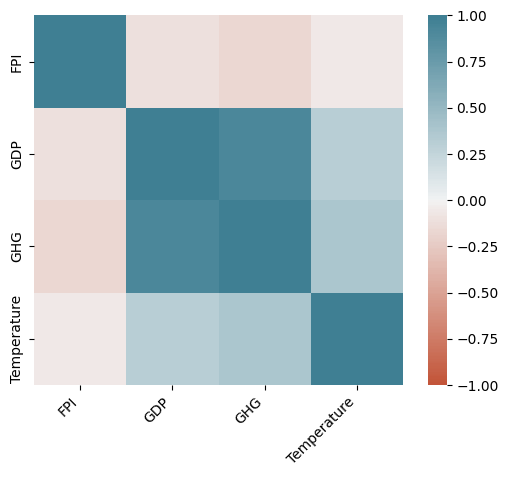

In [ ]:
#heatmap correlation
corr = tempfinal.corr()
ax = sns.heatmap(
    corr,
    vmin=-1, vmax=1, center=0,
    cmap=sns.diverging_palette(20, 220, n=200),
    square=True
)
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

The correlation matrix shows that Temperature and GHG, GDP are somewhat having weak to modearte correlation but food price is the least related factor in this group.

<ipython-input-506-3a38d01a942e>:2: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



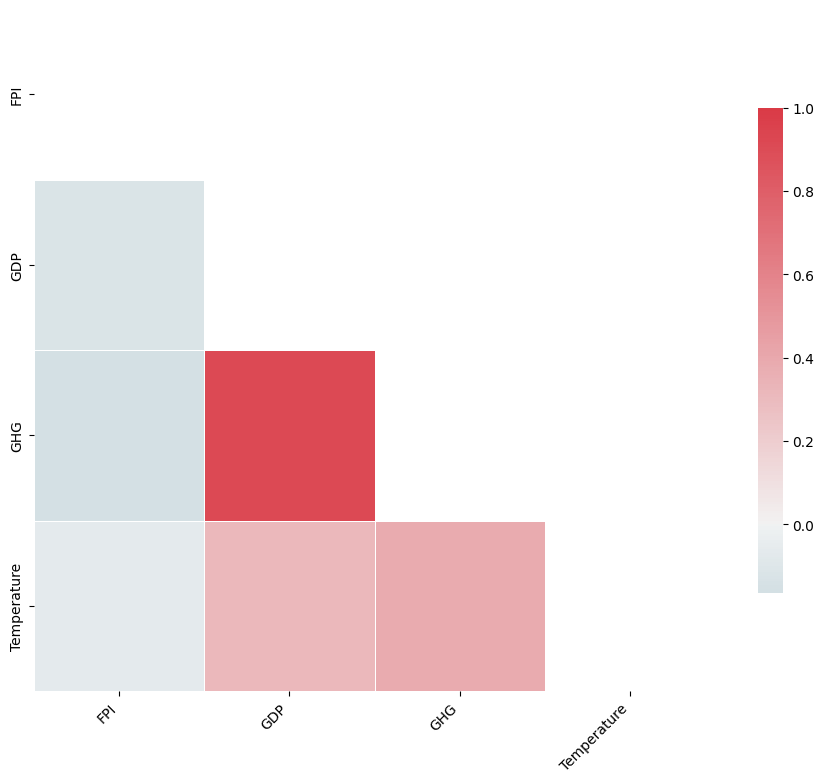

In [ ]:
#heatmap correlation
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
ax = sns.heatmap(corr, mask=mask, cmap=cmap, vmax=1, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .7})
ax.set_xticklabels(
    ax.get_xticklabels(),
    rotation=45,
    horizontalalignment='right'
);

Temperature analysis

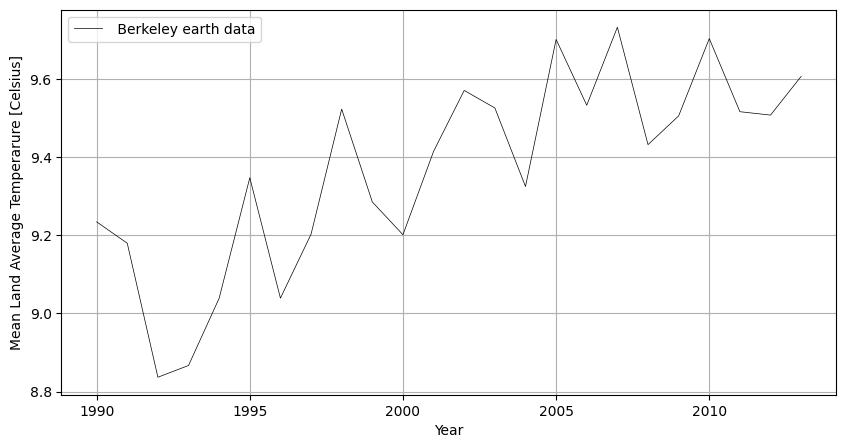

In [ ]:
ax = tempf.plot("year", "LandAverageTemperature",linewidth=0.5,color="black",figsize=(10, 5), grid=True, xlabel="Year",
          ylabel="Mean Land Average Temperarure [Celsius]",label=" Berkeley earth data")

In [ ]:
tempf["year_st"] = (tempf["year"] - tempf["year"].mean()) / tempf["year"].std() #standardising the data
tempf["LandAverageTemperature_st"] = (tempf["LandAverageTemperature"] - tempf["LandAverageTemperature"].mean()) / tempf["LandAverageTemperature"].std()

In [ ]:
tempf.head()

,year,LandAverageTemperature,year_st,LandAverageTemperature_st
0,1990,9.234167,-1.626346,-0.529057
1,1991,9.179417,-1.484924,-0.746053
2,1992,8.836583,-1.343503,-2.104835
3,1993,8.866583,-1.202082,-1.985933
4,1994,9.038750,-1.060660,-1.303570


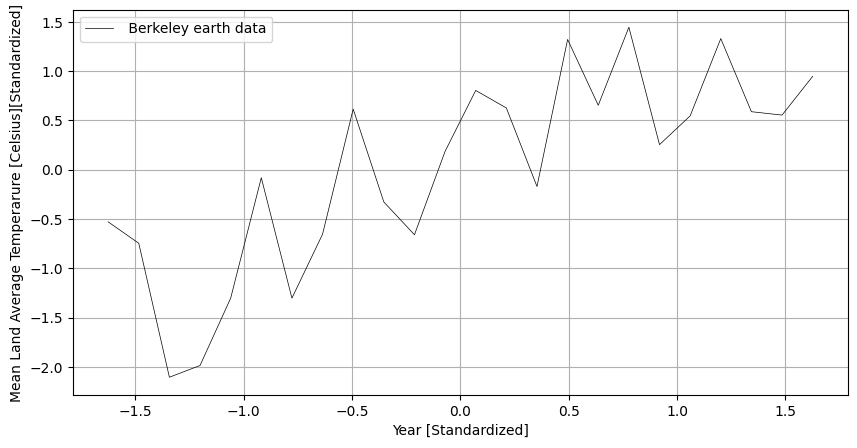

In [ ]:
ax = tempf.plot("year_st", "LandAverageTemperature_st",linewidth=0.5,color="black",figsize=(10, 5), grid=True, xlabel="Year [Standardized]",
          ylabel="Mean Land Average Temperarure [Celsius][Standardized]",label=" Berkeley earth data")

The rise in average world land temperature is approximately 1.5 degrees C in the past 250 years, and about 0.9 degrees in the past 50 years. (Berkeley Earth , 2019). This graph depicts the trend of the mean land average temperature from 1990-2013.


In [ ]:
#Fitting a linear regression model
from sklearn.linear_model import SGDRegressor
tempf_lm = SGDRegressor()
tempf_lm.fit(tempf[["year_st"]], tempf["LandAverageTemperature_st"])

SGDRegressor()

In [ ]:
tempf_model= tempf_lm.predict(tempf[["year_st"]])
tempf["model_st"]= tempf_model

In [ ]:
tempf_model_unst = tempf["model_st"] * tempf["LandAverageTemperature"].std() + tempf["LandAverageTemperature"].mean()
tempf["model_unst"]=tempf_model_unst

In [ ]:
tempf.head()

,year,LandAverageTemperature,year_st,LandAverageTemperature_st,model_st,model_unst
0,1990,9.234167,-1.626346,-0.529057,-1.078284,9.095592
1,1991,9.179417,-1.484924,-0.746053,-0.984712,9.119201
2,1992,8.836583,-1.343503,-2.104835,-0.891139,9.142810
3,1993,8.866583,-1.202082,-1.985933,-0.797567,9.166419
4,1994,9.038750,-1.060660,-1.303570,-0.703994,9.190029


In [ ]:
mse = np.mean((tempf["LandAverageTemperature"] - tempf["model_unst"])**2)
print("MSE = {0:0.4}".format(mse))

r2 = 1 - np.var(tempf["LandAverageTemperature"] - tempf["model_unst"]) / np.var(tempf["LandAverageTemperature"])
print("R^2 = {0:0.2}".format(r2))

MSE = 0.02491
R^2 = 0.59


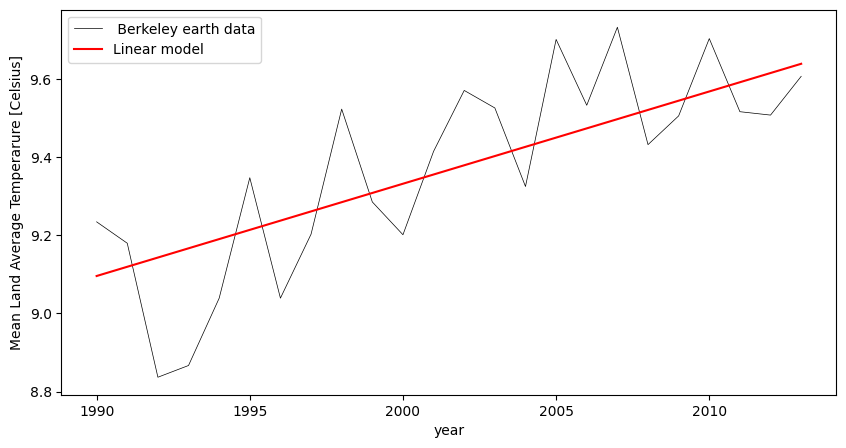

In [ ]:
ax = tempf.plot("year", "LandAverageTemperature",linewidth=0.5,color="black",figsize=(10, 5), grid=True, xlabel="Year [Standardized]",
          ylabel="Mean Land Average Temperarure [Celsius]",label=" Berkeley earth data")

ax = tempf.plot("year", "model_unst", label="Linear model", color="red", ax=ax)

In the above case , we use linear regression to predict the temperature. We are assuming linearity in this case whereas the trend that is being followed by the temperature is not linear. The model is able to explain only 60% variability in the temperature.





In [ ]:
from sklearn.linear_model import LinearRegression

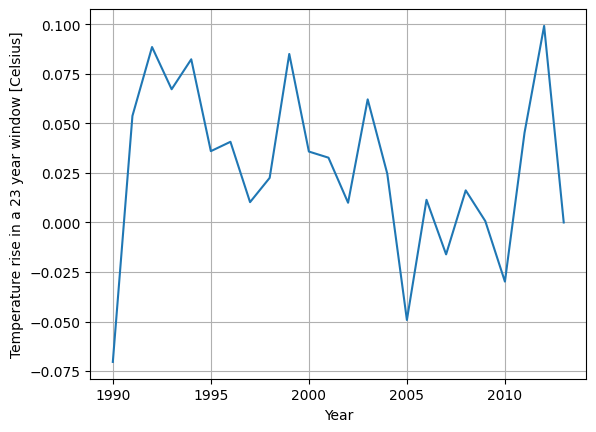

In [ ]:
# perform linear regression on each 5 year interval in the temperature data
slopes = []
start_years = []
# initialize the linear regression model
model = LinearRegression()
for start_year in range(1990, 2014):
    end_year = start_year + 5
    # select the temp data between the start and end year interval
    tempf_df = tempf[(tempf['year'] >= start_year) & (tempf['year'] < end_year)]
    x = tempf_df['year'].values.reshape(-1, 1)
    y = tempf_df['LandAverageTemperature'].values.reshape(-1, 1)
    # fit the linear regression model
    model.fit(x, y)
    # get the slope andintercept values
    slope, intercept = model.coef_[0], model.intercept_
    # add the slope and inttercept values to the list
    slopes.append(slope)
    start_years.append(start_year)
# plot the slopes as a function of time
plt.plot(start_years, slopes, '-')
plt.locator_params(axis="both", integer=True)
plt.grid()
plt.xlabel('Year')
plt.ylabel('Temperature rise in a 23 year window [Celsius]')
plt.show()

The above graph depicts the temperature rise in a 23 year window. Buckets of 5 years were taken and then regression was performed accordinly. The slopes have been plotted here.

In [ ]:
mname='/content/drive/MyDrive/MLPP Project/Final Project MLPP group 5/Temp_countries_mapped_final.csv'
temp=pd.read_csv(mname)
temp = temp.set_index("Country")
#temp = temp.reset_index()
#temp = temp.set_index("Country")

In [ ]:
years=np.arange(1990,2014,1)

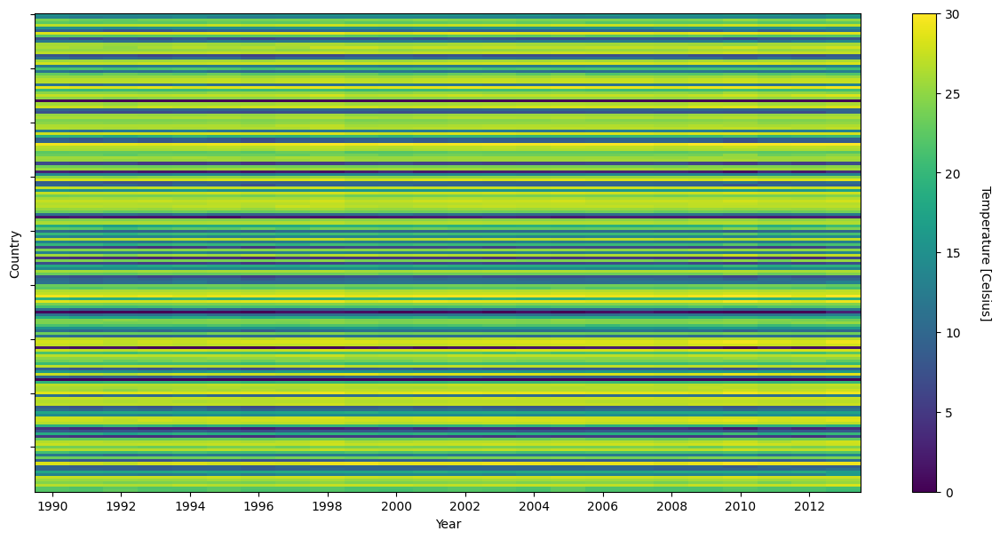

In [ ]:
# -- initialize the figure
fig, ax = plt.subplots(figsize=(15, 7))

# -- plot all time series with a "heatmap"
im= ax.imshow(temp, aspect="auto",interpolation="nearest",clim=(0,30))

# # -- set the x-axis ticks to be years
xts = np.array([0,2,4,6,8,10,12,14,16,18,20,22 ])
ax.set_xticks(xts)
ax.set_xticklabels(years[xts])
ax.set_yticklabels("")

# # -- set the axis labels
ax.set_xlabel("Year")
ax.set_ylabel("Country")

# # -- set the colorbar and label
cbar = fig.colorbar(im)
cbar.ax.set_ylabel("Temperature [Celsius]", rotation=270)
cbar.ax.get_yaxis().labelpad = 25

# -- show the figure
fig.show()

The above figure is the heatmap of the unstandardized temperature dataset. The trends cannot be interpreted rightfully. The data needs to be standardized.  

In [ ]:
temp_st = temp.sub(temp.mean(axis=1),axis=0).div(temp.std(axis=1),axis=0)

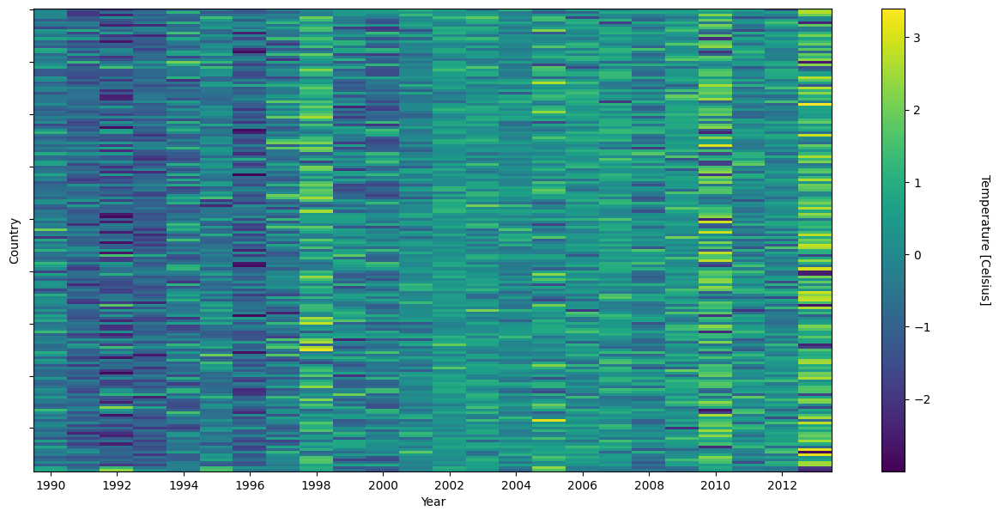

In [ ]:
# -- initialize the figure
fig, ax = plt.subplots(figsize=(15, 7))

# -- plot all time series with a "heatmap"
im= ax.imshow(temp_st, aspect="auto",interpolation="nearest")

# # -- set the x-axis ticks to be years
xts = np.array([0,2,4,6,8,10,12,14,16,18,20,22 ])
ax.set_xticks(xts)
ax.set_xticklabels(years[xts])
ax.set_yticklabels("")

# # -- set the axis labels
ax.set_xlabel("Year")
ax.set_ylabel("Country")

# # -- set the colorbar and label
cbar = fig.colorbar(im)
cbar.ax.set_ylabel("Temperature [Celsius]", rotation=270)
cbar.ax.get_yaxis().labelpad = 50

# -- show the figure
fig.show()

The above figure is the heatmap of the standardized temperature dataset. We do see some countries where the temperature is increasing with time though a clear distinction cannot be made.

In [ ]:
from sklearn.cluster import KMeans

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

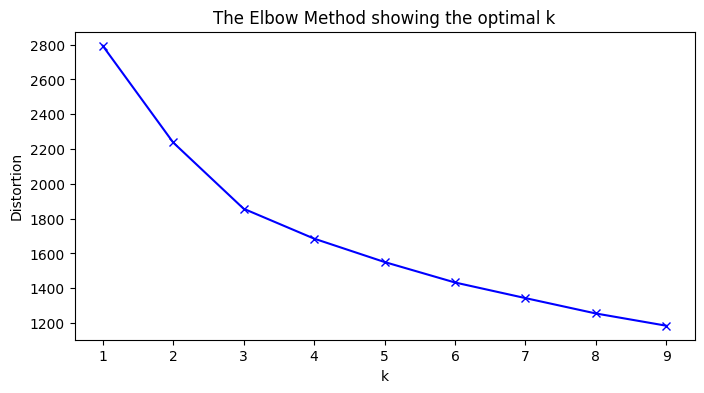

In [ ]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(temp_st)
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(8,4))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

The above plot shows the optimal number of clusters for the dataset using elbow method.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



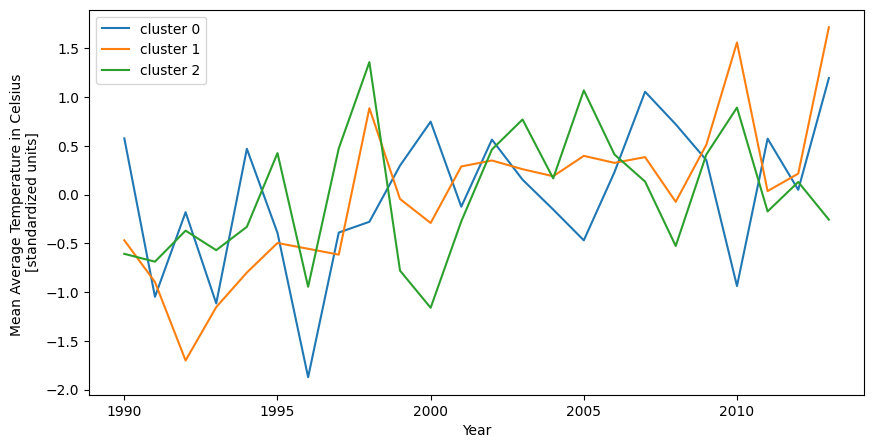

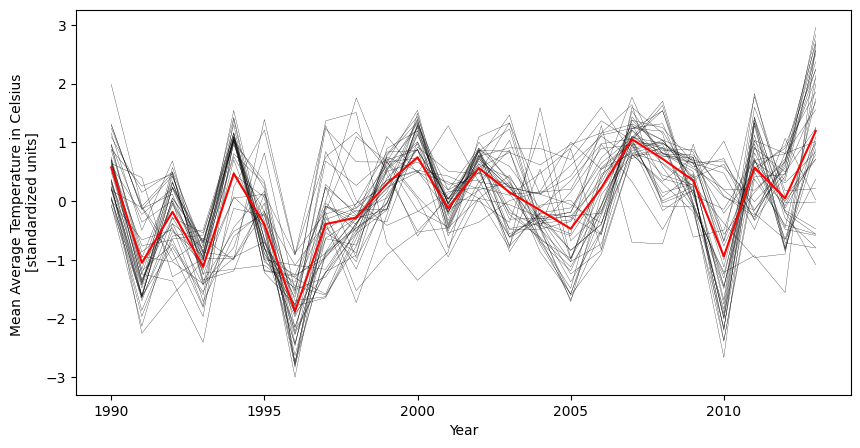

member countries  ['Albania' 'Austria' 'Bahamas, The' 'Belarus' 'Belgium'
 'Bosnia And Herzegovina' 'Bulgaria' 'Croatia' 'Czech Republic' 'Denmark'
 'Estonia' 'Finland' 'France' 'Germany' 'Hungary' 'Ireland' 'Italy'
 'Japan' 'Korea, Rep.' 'Latvia' 'Lithuania' 'Luxembourg' 'Macedonia, FYR'
 'Malta' 'Moldova' 'Mongolia' 'Montenegro' 'Netherlands' 'Norway' 'Poland'
 'Romania' 'Russian Federation' 'Serbia' 'Slovak Republic' 'Slovenia'
 'Spain' 'Sweden' 'Switzerland' 'Ukraine' 'United Kingdom']
member countries  40





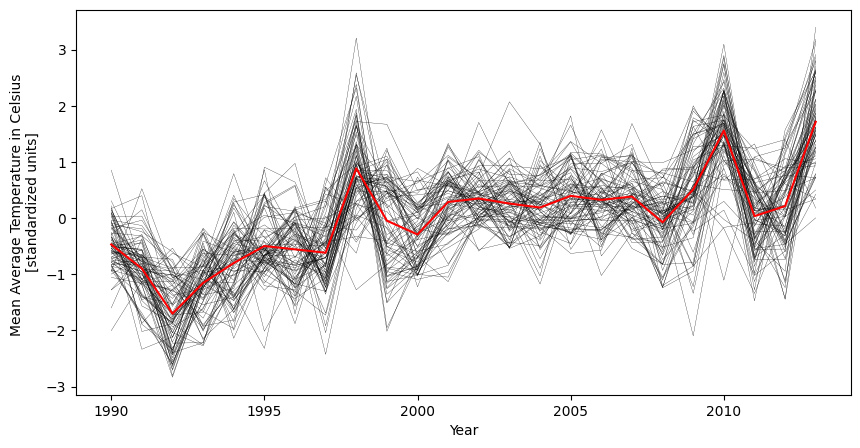

member countries  ['Afghanistan' 'Algeria' 'Armenia' 'Azerbaijan' 'Bahrain' 'Bangladesh'
 'Benin' 'Bhutan' 'Burkina Faso' 'Cambodia' 'Cameroon' 'Canada'
 'Central African Republic' 'Chad' 'China' "Côte d'Ivoire" 'Cyprus'
 'Djibouti' 'Egypt, Arab Rep.' 'Equatorial Guinea' 'Ethiopia' 'Fiji'
 'Gambia, The' 'Georgia' 'Ghana' 'Greece' 'Guinea' 'Guinea-Bissau'
 'Hong Kong SAR' 'Iceland' 'India' 'Iran, Islamic Rep.' 'Iraq' 'Israel'
 'Jordan' 'Kazakhstan' 'Kenya' 'Kuwait' 'Kyrgyz Republic' 'Lao PDR'
 'Lebanon' 'Liberia' 'Libya' 'Malaysia' 'Mali' 'Mauritania' 'Mauritius'
 'Mexico' 'Morocco' 'Myanmar' 'Nepal' 'New Caledonia' 'New Zealand'
 'Niger' 'Nigeria' 'Oman' 'Pakistan' 'Papua New Guinea' 'Philippines'
 'Qatar' 'Samoa' 'São Tomé and Principe' 'Saudi Arabia' 'Senegal'
 'Seychelles' 'Sierra Leone' 'Singapore' 'Sri Lanka' 'Sudan'
 'Syrian Arab Republic' 'Tajikistan' 'Thailand' 'Togo' 'Tonga'
 'Trinidad And Tobago' 'Tunisia' 'Turkey' 'United Arab Emirates'
 'United States' 'Uzbekistan' 'Vietnam

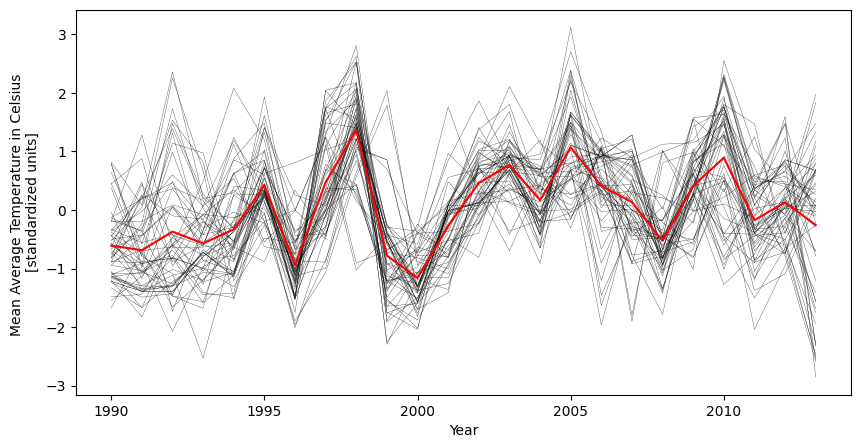

member countries  ['Angola' 'Antigua and Barbuda' 'Argentina' 'Aruba' 'Australia' 'Barbados'
 'Belize' 'Bolivia' 'Botswana' 'Brazil' 'British Virgin Islands'
 'Brunei Darussalam' 'Burundi' 'Cabo Verde' 'Chile' 'Colombia' 'Comoros'
 'Congo, Dem. Rep.' 'Congo, Rep.' 'Costa Rica' 'Curacao' 'Dominica'
 'Dominican Republic' 'Ecuador' 'El Salvador' 'Gabon' 'Grenada'
 'Guatemala' 'Guyana' 'Haiti' 'Honduras' 'Indonesia' 'Jamaica' 'Lesotho'
 'Madagascar' 'Malawi' 'Maldives' 'Mozambique' 'Namibia' 'Nicaragua'
 'Panama' 'Paraguay' 'Peru' 'Portugal' 'Rwanda' 'South Africa' 'Suriname'
 'Swaziland' 'Tanzania' 'Uganda' 'Uruguay' 'Vanuatu' 'Venezuela, RB'
 'Zambia' 'Zimbabwe']
member countries  55





In [ ]:
# -- now let's plot all cluster centers, their members, and print their
#    member names

feat = temp_st

# -- cluster
km = KMeans(n_clusters=3, random_state=100)
km.fit(feat)

# -- plot all cluster centers
fig, ax = plt.subplots(figsize=(10, 5))
lins=ax.plot(years, km.cluster_centers_.T)
ax.set_xlabel("Year")
ax.set_ylabel("Mean Average Temperature in Celsius \n[standardized units]")
ax.legend(lins, ["cluster 0", "cluster 1", "cluster 2"])
fig.show()

# -- add some space after the graph
plt.pause(0.01) # "refresh" the screen
print("\n\n")

# -- plot each cluster individually and its members
for cnum in range(km.n_clusters):

  # -- True/False index of where label_ is cnum
  ind = km.labels_ == cnum

  # -- get the members of that cluster number
  mems = temp_st[ind]

  # -- make a plot
  fig, ax = plt.subplots(figsize=[10, 5])
  ax.plot(years, mems.T, lw=0.2, color="k")
  ax.plot(years, km.cluster_centers_[cnum], color="r")
  ax.set_xlabel("Year")
  ax.set_ylabel("Mean Average Temperature in Celsius \n[standardized units]")
  #ax.set_title("Number of countries in cluster is " +str(len(mems)))

  #ax3.set_title("Number of countries in cluster 2 is "+str(len(mems)))
  fig.show()

  # -- refresh screen
  plt.pause(0.01)

  # -- print member countries and extra space
  print("member countries ",temp_st.index[ind].values)
  print("member countries ",len(temp_st.index[ind]))
  print("\n\n")

The clustering algorithm has grouped the countries into 3 main clusters based on the temperature change across 1990-2013. Cluster 0 has 40 countries, cluster 1 has 82 countries and cluster 2 has 55 countries.Based on the clustering analysis performed above, a distinct pattern or difference could not be made between the three clusters due to the variability and fluctuations in the temperature dataset.

In [ ]:
temp_st_new= temp_st.reset_index()
temp_st_new['cluster']=km.labels_
temp_st_new['cluster']=temp_st_new['cluster'].astype(str)

In [ ]:
fig_cluster = px.choropleth(temp_st_new, locations="Country", locationmode = "country names", color="cluster",
                    color_continuous_scale=px.colors.diverging.BrBG,labels={'AverageTemperature':'Mean Average Temperature in Celsius'},
                    title="Clusters - Mean Average Temperature Contrywise ")

fig_cluster.update_layout(margin=dict(l=5, r=600, t=70, b=50))
#fig3.update_layout( title_x=0.14, title_y=0.9 ,margin=dict(l=5, r=500, t=90, b=40),legend=dict(x=-2.0, y=-2.0, orientation='h'))
#fig3.update_layout(coloraxis_colorbar_x=0.85)
fig_cluster.show()

The above graph depicts the clusters represented by different colours and the clusters are mapped to the countries. We can observe a spatial pattern here.

**MOVING AVERAGE FOR A WINDOW OF 10 YEARS**

A moving average with a window of 10 years was applied to the temperature dataset. Moving averages help to smooth out the noise and random fluctuations in a time series, revealing underlying trends and patterns. Given that there are multiple fluctuations in the temperature dataset a moving average with a window of 10 years was applied.


In [ ]:
x= temp.T
def my_func(col):
    # do something with the column, applying moving average:
    return col.rolling(10).mean()

# Apply the function to each column using the apply() method
result = x.apply(my_func)
y=result.T
y=y.iloc[:,9:]
temp_1=y
years_1=np.arange(1999,2014,1)
years_1

array([1999, 2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009,
       2010, 2011, 2012, 2013])

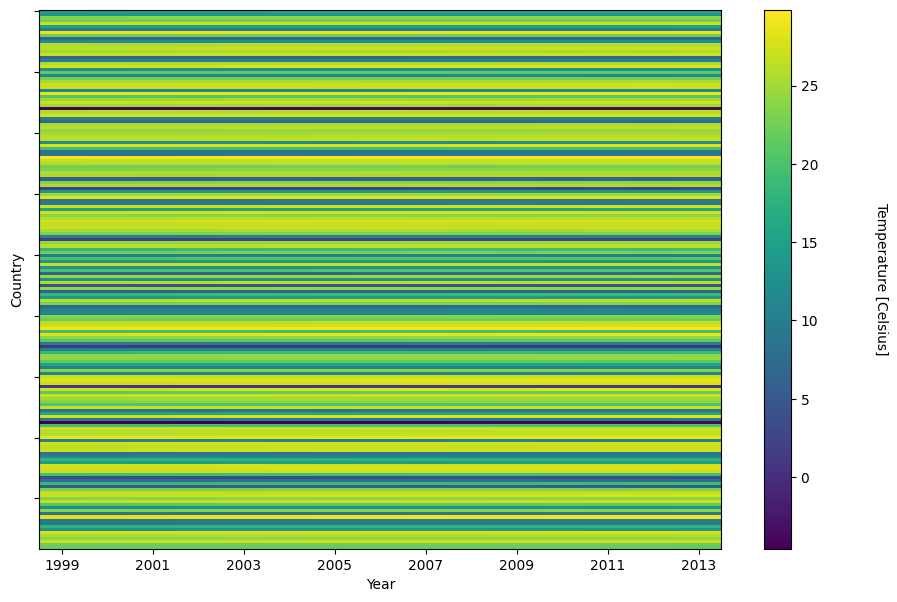

In [ ]:
# -- initialize the figure
fig, ax = plt.subplots(figsize=(11, 7))

# -- plot all time series with a "heatmap"
im= ax.imshow(temp_1, aspect="auto",interpolation="nearest")

# # -- set the x-axis ticks to be years
xts = np.array([0,2,4,6,8,10,12,14 ])
ax.set_xticks(xts)
ax.set_xticklabels(years_1[xts])
ax.set_yticklabels("")

# # -- set the axis labels
ax.set_xlabel("Year")
ax.set_ylabel("Country")

# # -- set the colorbar and label
cbar = fig.colorbar(im)
cbar.ax.set_ylabel("Temperature [Celsius]", rotation=270)
cbar.ax.get_yaxis().labelpad = 50

# -- show the figure
fig.show()

The above heatmap is of the temperature dataset for which moving average has been applied but the data has not been standardized. It is ideal to standardize the data to observe the pattern across countries.

In [ ]:
temp_st_1 = temp_1.sub(temp_1.mean(axis=1),axis=0).div(temp_1.std(axis=1),axis=0) #standardize across columns

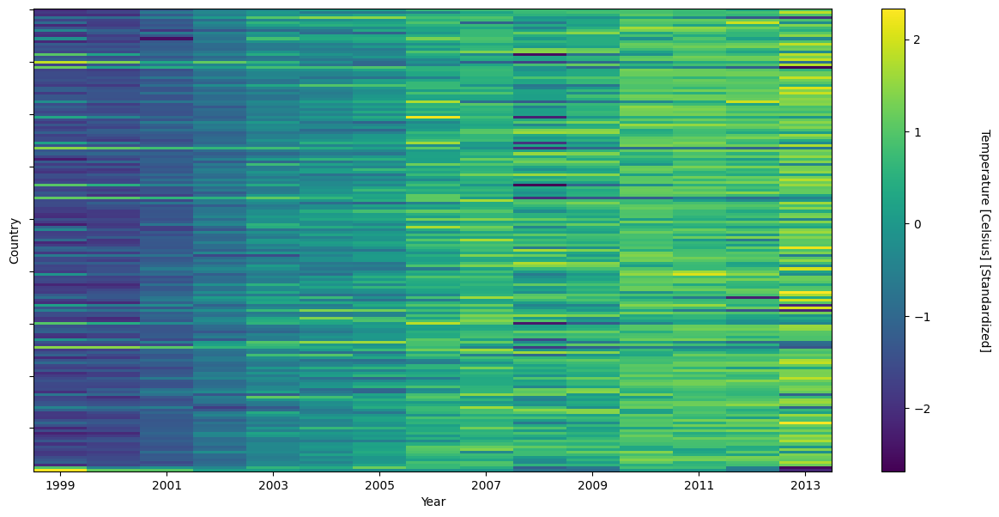

In [ ]:
# -- initialize the figure
fig, ax = plt.subplots(figsize=(15, 7))

# -- plot all time series with a "heatmap"
im= ax.imshow(temp_st_1, aspect="auto",interpolation="nearest")

# # -- set the x-axis ticks to be years
xts = np.array([0,2,4,6,8,10,12,14 ])
ax.set_xticks(xts)
ax.set_xticklabels(years_1[xts])
ax.set_yticklabels("")

# # -- set the axis labels
ax.set_xlabel("Year")
ax.set_ylabel("Country")

# # -- set the colorbar and label
cbar = fig.colorbar(im)
cbar.ax.set_ylabel("Temperature [Celsius] [Standardized]", rotation=270)
cbar.ax.get_yaxis().labelpad = 50

# -- show the figure
fig.show()

The above heatmap is of the temperature dataset for which moving average has been applied and the data has been standardized. We can now observe a clear pattern. Majority of the countries see an increase in temperature as time increases.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will chang

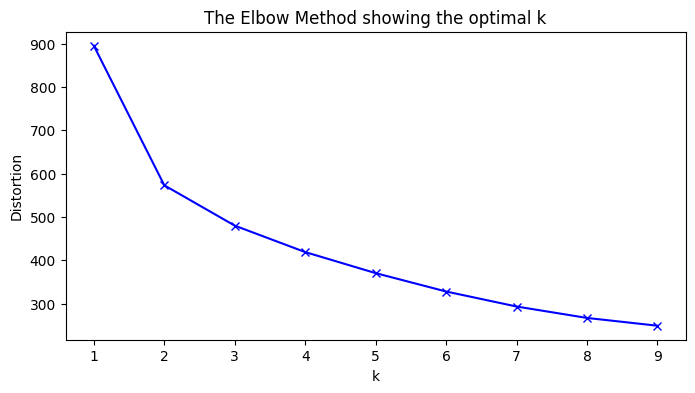

In [ ]:
distortions = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(temp_st_1)
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(8,4))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

The above figure shows the optimal number of clusteres based on the elbow method. k=3 was  chosen for our analysis.

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



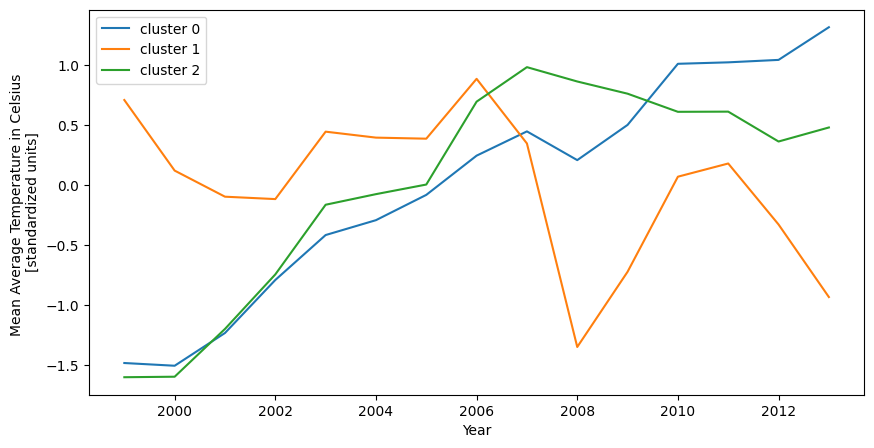

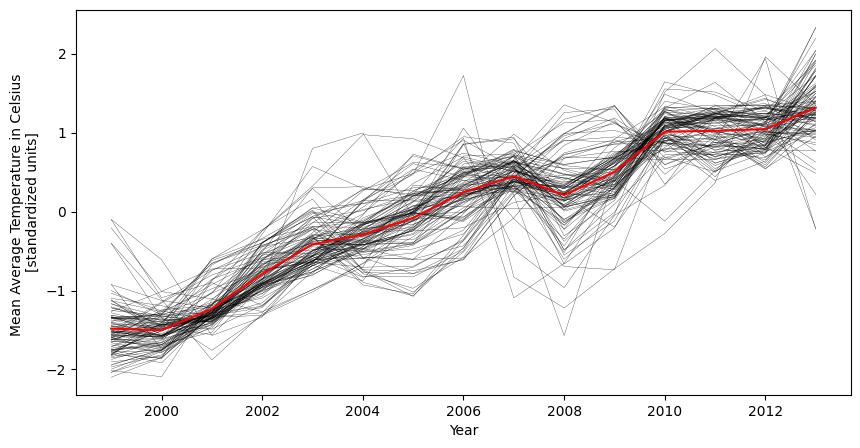

member countries  ['Albania' 'Antigua and Barbuda' 'Argentina' 'Aruba' 'Australia'
 'Azerbaijan' 'Bangladesh' 'Barbados' 'Belarus' 'Benin' 'Bhutan'
 'Bosnia And Herzegovina' 'Brazil' 'British Virgin Islands'
 'Brunei Darussalam' 'Bulgaria' 'Burkina Faso' 'Burundi' 'Cabo Verde'
 'Cambodia' 'Cameroon' 'Canada' 'Central African Republic' 'Chad' 'Chile'
 'Colombia' 'Comoros' 'Congo, Dem. Rep.' 'Congo, Rep.' "Côte d'Ivoire"
 'Croatia' 'Curacao' 'Cyprus' 'Djibouti' 'Dominica' 'Egypt, Arab Rep.'
 'Equatorial Guinea' 'Ethiopia' 'Finland' 'Gabon' 'Gambia, The' 'Georgia'
 'Ghana' 'Greece' 'Grenada' 'Guinea' 'Guinea-Bissau' 'Guyana' 'Hungary'
 'Iceland' 'India' 'Iran, Islamic Rep.' 'Iraq' 'Israel' 'Japan' 'Jordan'
 'Kenya' 'Kuwait' 'Lao PDR' 'Lebanon' 'Liberia' 'Libya' 'Macedonia, FYR'
 'Madagascar' 'Malawi' 'Malaysia' 'Maldives' 'Mali' 'Mauritania'
 'Mauritius' 'Mexico' 'Moldova' 'Montenegro' 'Morocco' 'Myanmar' 'Nepal'
 'Niger' 'Nigeria' 'Norway' 'Oman' 'Panama' 'Portugal' 'Romania'
 'Russian F

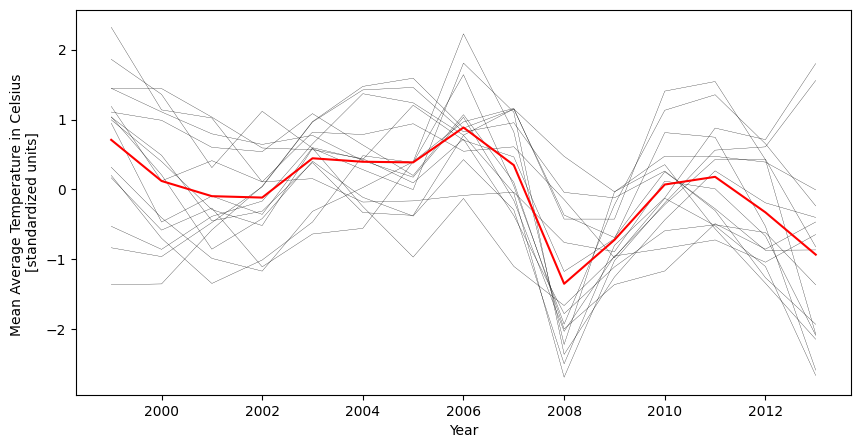

member countries  ['Angola' 'Belize' 'Bolivia' 'Botswana' 'Costa Rica' 'Ecuador'
 'El Salvador' 'Guatemala' 'Honduras' 'Mozambique' 'Namibia' 'Nicaragua'
 'Papua New Guinea' 'Peru' 'Zambia' 'Zimbabwe']
member countries  16





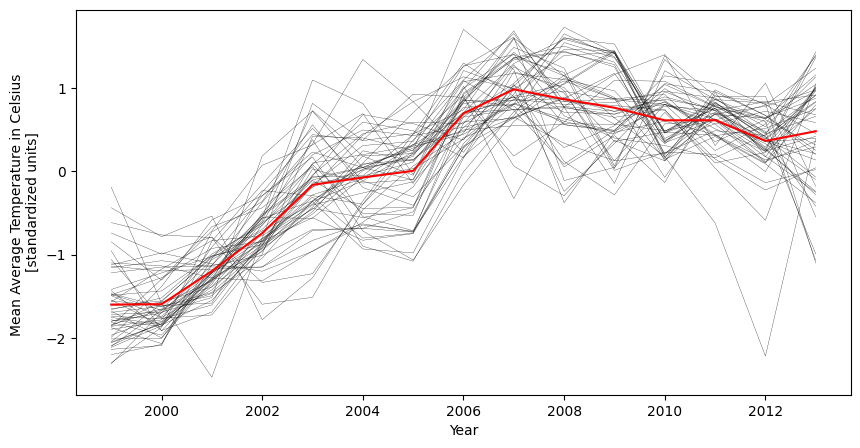

member countries  ['Afghanistan' 'Algeria' 'Armenia' 'Austria' 'Bahamas, The' 'Bahrain'
 'Belgium' 'China' 'Czech Republic' 'Denmark' 'Dominican Republic'
 'Estonia' 'Fiji' 'France' 'Germany' 'Haiti' 'Hong Kong SAR' 'Indonesia'
 'Ireland' 'Italy' 'Jamaica' 'Kazakhstan' 'Korea, Rep.' 'Kyrgyz Republic'
 'Latvia' 'Lesotho' 'Lithuania' 'Luxembourg' 'Malta' 'Mongolia'
 'Netherlands' 'New Caledonia' 'New Zealand' 'Pakistan' 'Paraguay'
 'Philippines' 'Poland' 'Qatar' 'Samoa' 'Slovenia' 'South Africa' 'Spain'
 'Swaziland' 'Sweden' 'Switzerland' 'Tajikistan' 'Tonga' 'Tunisia'
 'United Kingdom' 'United States' 'Uruguay' 'Uzbekistan' 'Yemen, Rep.']
member countries  53





In [ ]:
feat_1=temp_st_1
# -- now let's plot all cluster centers, their members, and print their
#    member names

# -- cluster
km_1 = KMeans(n_clusters=3, random_state=200)
km_1.fit(feat_1)

# -- plot all cluster centers
fig, ax = plt.subplots(figsize=(10, 5))
lins=ax.plot(years_1, km_1.cluster_centers_.T)
ax.set_xlabel("Year")
ax.set_ylabel("Mean Average Temperature in Celsius \n[standardized units]")
ax.legend(lins, ["cluster 0", "cluster 1", "cluster 2"])
fig.show()

# -- add some space after the graph
plt.pause(0.01) # "refresh" the screen
print("\n\n")

# -- plot each cluster individually and its members
for cnum in range(km_1.n_clusters):

  # -- True/False index of where label_ is cnum
  ind = km_1.labels_ == cnum

  # -- get the members of that cluster number
  mems = temp_st_1[ind]

  # -- make a plot
  fig, ax = plt.subplots(figsize=[10, 5])
  ax.plot(years_1, mems.T, lw=0.2, color="k")
  ax.plot(years_1, km_1.cluster_centers_[cnum], color="r")
  ax.set_xlabel("Year")
  ax.set_ylabel("Mean Average Temperature in Celsius \n[standardized units]")
  #ax.set_title("Number of countries in cluster is " +str(len(mems)))

  #ax3.set_title("Number of countries in cluster 2 is "+str(len(mems)))
  fig.show()

  # -- refresh screen
  plt.pause(0.01)

  # -- print member countries and extra space
  print("member countries ",temp_st_1.index[ind].values)
  print("member countries ",len(temp_st_1.index[ind]))
  print("\n\n")

We can make out a clear distinction in the trend of temperature among the 3 clusters. Cluster 0 has 108 member countries and sees a clear increase in temperature with time. This cluster sees maximum rise in temperature with time.  Cluster 1 has the least number of countries , 16 and sees a varying pattern with a dip in temperature. Cluster 2 has 53 member countries and observes an increase in temperature until upto a certain point after which there is a slight dip and the curve plateaus.

In [ ]:
temp_st_new_1= temp_st_1.reset_index()
temp_st_new_1['cluster']=km_1.labels_
temp_st_new_1['cluster']=temp_st_new_1['cluster'].astype(str)

In [ ]:
fig_cluster = px.choropleth(temp_st_new_1, locations="Country", locationmode = "country names", color="cluster",
                    color_continuous_scale=px.colors.diverging.BrBG,labels={'AverageTemperature':'Mean Average Temperature in Celsius'}
                    ,title="Cluster - Mean Average Temperature Contrywise Worldwide")

fig_cluster.update_layout(margin=dict(l=5, r=600, t=70, b=50))
#fig3.update_layout( title_x=0.14, title_y=0.9 ,margin=dict(l=5, r=500, t=90, b=40),legend=dict(x=-2.0, y=-2.0, orientation='h'))
#fig3.update_layout(coloraxis_colorbar_x=0.85)
fig_cluster.show()

There are 16 countries in cluster 1 colored in green.These are the countries that observe a decrease in temperature. We can clearly see that these areas are away from the north pole/Arctic region. It also been observed in the previously plotted chloropeth that areas closer to arctic region see a higher increase in temperature. This is also supported by literature which state that the Arctic region, which includes the North Pole and surrounding areas, is experiencing more rapid warming than other parts of the world,  known as Arctic amplification. These 16 countries are away from the arctic region and see a decline in temperature.


The number of countries in cluster 2 is 53. China,France,Germany,Italy,United Kingdom,United States, Spain- the countries that have top 10 GDP and the top 10 GHG emissions are a part of this cluster. Poland which is one among top 10 countries which emit GHG is a also a part of this cluster.
Samoa,Swaziland,Tonga,the countries with one of the lowest GDPs and GHG emissions are part of this cluster.


The number of countries in cluster 0 is 108. This is the cluster that sees the maximum rise in temperature with time. Brazil,Canada which are among the countries with top 10 GDP and top 10 GHG emissions are a part of this cluster. Indian and Russia which are top contributors to GHG emissions are also a part of this cluster.Comoros,Dominica,Grenada,Guinea-Bissau,
São Tomé and Principe, Vanuatu, Cabo Verde, Bhutan
which have low GDP and GHG emissions are also a part of this cluster. Inspite of not being developed or industrialised and not having the benefits of developed countries these countries are few of the major sufferers which see rise in temperature in time.



The clustering analysis of the temperature dataset reveals a discernible pattern where certain countries experience a consistent temperature increase, while only a few observe a temperature decrease. The detailed analysis of each cluster highlights that climate change affects countries unequally. Specifically, some countries with low greenhouse gas emissions and GDP experience a substantial temperature rise. They face the brunt of a mistake that isnt theirs.

Conversely, some countries with high greenhouse gas emissions and GDP observe a temperature increase but not to the same degree. The countries that see an increase in temperature are not necessarily the countries that emit maximum GHG or have maximum GDP. Hence

**DISCUSSION AND CONCLUSION**

While all countries are affected by climate change to some extent, the impacts are not equally distributed, and some countries are more vulnerable than others. Additionally, responsibility for causing climate change is not equally distributed, with developed countries historically contributing more than developing countries, although this is changing as developing countries increase their emissions.

Developed countries, particularly those with a long history of industrialization, have contributed the most to the accumulation of greenhouse gases in the atmosphere. Their high levels of emissions over time have had a significant impact on global warming and climate change.Developing countries, although generally having lower historical emissions, are often more vulnerable to the impacts of climate change. These countries often have limited resources, infrastructure, and technological capabilities to adapt to and mitigate the effects of climate change. They may also have higher dependence on climate-sensitive sectors such as agriculture, which makes them more susceptible to climate-related disasters like droughts, floods, and storms.: Both developed and developing countries need to take action to reduce greenhouse gas emissions. However, the responsibility of developed countries in mitigating climate change is greater due to their historical emissions and higher per capita emissions. They are expected to take the lead in reducing emissions, transitioning to renewable energy sources, and supporting developing countries in their mitigation efforts.[Climate change and inequality](https://www.imf.org/en/Publications/fandd/issues/2021/09/climate-change-and-inequality-guivarch-mejean-taconet)


The Paris Agreement, adopted at the 21st Conference of the Parties (COP21) in 2015, is a landmark international agreement on climate change. It aims to strengthen the global response to climate change. The agreement sets out a comprehensive framework to address global warming and its impacts.[Paris agreement](https://unfccc.int/documents/184656)

The main goal of the Paris Agreement is to limit the global average temperature increase to well below 2 degrees Celsius above pre-industrial levels, while aiming to pursue efforts to limit the increase to 1.5 degrees Celsius. This temperature threshold is crucial for avoiding catastrophic climate change effects. Under the Paris Agreement, countries are expected to make voluntary and nationally determined contributions to reduce greenhouse gas emissions. These contributions are submitted every five years and should reflect the country's efforts to mitigate climate change and adapt to its impacts. The agreement also establishes a transparency framework, requiring countries to regularly report on their emissions and progress towards their NDCs.

Furthermore, the Paris Agreement emphasizes the importance of financial and technological support to developing countries. Developed nations committed to providing financial assistance, capacity building, and technology transfer to support developing countries in their climate actions.

The Paris Agreement has been ratified by 191 countries, and is widely regarded as a major step forward in global efforts to combat climate change. The Paris Agreement has become a cornerstone of international efforts to combat climate change, providing a framework for cooperation, collaboration, and accountability. It represents a significant step forward in global climate governance, signaling a collective commitment to tackle one of the most pressing challenges of our time and pave the way for a sustainable and resilient planet for future generations.

Each country's specific circumstances, policies, and actions play a role in their relationship with climate change.Addressing climate change requires global cooperation and collaboration between developed and developing countries.



**Previous Literature and References**

1.[Persistent effect of temperature on GDP identified from lower frequency temperature variability](https://iopscience.iop.org/article/10.1088/1748-9326/ac82c2)

2.[The GDP-Temperature relationship: Implications for climate change damages](https://www.sciencedirect.com/science/article/abs/pii/S0095069621000280)

3.[The impact of climate change on economic output across industries in Chile](https://journals.plos.org/plosone/article?id=10.1371/journal.pone.0266811)

4.[The cost of climate change on economic growth](https://www.sciencedaily.com/releases/2022/08/220810134130.htm)

5.[Climate Impacts](https://www.c2es.org/content/climate-impacts/)

6.[Climate change and Economic factors](https://www.sciencedirect.com/science/article/pii/S0048969718347053?casa_token=1WAMJzIF5zYAAAAA:rOhAGKkGc-b92xhkmAxf0RD2njHW3Tl8bbChdwSZCk0AD8_GR-H7AN1puf3MxzT6a8A0eMxzzM0)

7.[Climate Change in Low-income countries](https://link.springer.com/article/10.1007/s41748-021-00209-6)

8.[Climate change in Developing Countries](https://www.sciencedirect.com/science/article/pii/S0048969719333418?casa_token=q-MG63HHzFkAAAAA:v8aEBupZ6Ywdsn21BQfsOahYHWZ8zEO5oyFz6HZ03UtiU4M2NxEQsXzR1S7F1736ilxHOFc6ogk)

9.[Strategies for mitigation of climate change](https://link.springer.com/article/10.1007/s10311-020-01059-w)

10.[The mitigating effects of economic complexity](https://onlinelibrary.wiley.com/doi/abs/10.1002/sd.2125?casa_token=Q_J7OYEfeW4AAAAA:bxhKpl4IRjIsgaWFu1LE8I1zKJrvhD0qgnUBGrV-RA_eRaWfhkLusZAqsf63E1oMqnFSxDc4NSFXyIPG)